XGBoost to predict streamflow. Forcings are aggregated from hourly to daily to match streamflow resolution.

In [1]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append('..')
import os
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn import model_selection
from sklearn import metrics
from datetime import datetime, timedelta
import hydroeval
import netCDF4 as nc
import xgboost as xgb
import scipy as sp
import pickle
from src import load_data, evaluate

np.random.seed(0)

time_stamp = datetime.now().strftime('%Y%m%d-%H%M%S')
time_stamp

'20190706-075633'

In [2]:
station_data_dict = load_data.load_train_test_gridded_aggregatedForcings(include_all_forcing_vars=True)

Test: 2010-01-09 00:00:00 - 2010-12-31
02GA010
Shapes: train (1323, 1646), val (146, 1646), test (357, 1646)
XGBRegressor(base_score=0.5, booster='gbtree',
             colsample_bylevel=0.40887264618382646,
             colsample_bytree=0.5104526368418408, gamma=0.45420415837476136,
             importance_type='gain', learning_rate=0.2658514371722699,
             max_delta_step=0, max_depth=7, min_child_weight=11, missing=nan,
             n_estimators=1000, n_jobs=-1, nthread=None, objective='reg:linear',
             random_state=123, reg_alpha=25.220571096776126,
             reg_lambda=15.33642641307088, scale_pos_weight=1, seed=None,
             silent=True, subsample=0.880163427403828)
[0]	validation_0-rmse:20.41	validation_1-rmse:22.2447
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:18.1839	validation_1-rmse:20.3206
[2]	validation_0-rmse:16.

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[8]	validation_0-rmse:10.6153	validation_1-rmse:17.0647
[9]	validation_0-rmse:10.0391	validation_1-rmse:16.9369
[10]	validation_0-rmse:9.48409	validation_1-rmse:16.795
[11]	validation_0-rmse:9.06268	validation_1-rmse:16.6917
[12]	validation_0-rmse:8.69917	validation_1-rmse:16.5535
[13]	validation_0-rmse:8.32366	validation_1-rmse:16.5586
[14]	validation_0-rmse:7.96636	validation_1-rmse:16.377
[15]	validation_0-rmse:7.72912	validation_1-rmse:16.3963
[16]	validation_0-rmse:7.41527	validation_1-rmse:16.3808
[17]	validation_0-rmse:7.1217	validation_1-rmse:16.1675
[18]	validation_0-rmse:6.88322	validation_1-rmse:16.1868
[19]	validation_0-rmse:6.67649	validation_1-rmse:16.1999
[20]	validation_0-rmse:6.40042	validation_1-rmse:16.1753
[21]	validation_0-rmse:6.20823	validation_1-rmse:16.219
[22]	validation_0-rmse:6.03451	validation_1-rmse:16.1879
[23]	validation_0-rmse:5.88255	validation_1-rmse:16.1847
[24]	validation_0-rmse:5.68213	validation_1-rmse:16.2671
[25]	validation_0-rmse:5.52036	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[20]	validation_0-rmse:13.5973	validation_1-rmse:13.3485
[21]	validation_0-rmse:13.5081	validation_1-rmse:13.3003
[22]	validation_0-rmse:13.4131	validation_1-rmse:13.2418
[23]	validation_0-rmse:13.3156	validation_1-rmse:13.1818
[24]	validation_0-rmse:13.2265	validation_1-rmse:13.1399
[25]	validation_0-rmse:13.1387	validation_1-rmse:13.1004
[26]	validation_0-rmse:13.0587	validation_1-rmse:13.0313
[27]	validation_0-rmse:12.9765	validation_1-rmse:12.9666
[28]	validation_0-rmse:12.8989	validation_1-rmse:12.8879
[29]	validation_0-rmse:12.818	validation_1-rmse:12.8392
[30]	validation_0-rmse:12.7495	validation_1-rmse:12.7864
[31]	validation_0-rmse:12.6674	validation_1-rmse:12.7344
[32]	validation_0-rmse:12.5912	validation_1-rmse:12.6929
[33]	validation_0-rmse:12.5264	validation_1-rmse:12.6374
[34]	validation_0-rmse:12.4571	validation_1-rmse:12.5834
[35]	validation_0-rmse:12.3833	validation_1-rmse:12.521
[36]	validation_0-rmse:12.3292	validation_1-rmse:12.4818
[37]	validation_0-rmse:12.2576	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:11.8235	validation_1-rmse:13.1318
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:11.6787	validation_1-rmse:13.0054
[2]	validation_0-rmse:11.5348	validation_1-rmse:12.872
[3]	validation_0-rmse:11.3889	validation_1-rmse:12.7497
[4]	validation_0-rmse:11.2441	validation_1-rmse:12.6728
[5]	validation_0-rmse:11.1012	validation_1-rmse:12.538
[6]	validation_0-rmse:10.9738	validation_1-rmse:12.4821
[7]	validation_0-rmse:10.8403	validation_1-rmse:12.3845
[8]	validation_0-rmse:10.7287	validation_1-rmse:12.2755
[9]	validation_0-rmse:10.6078	validation_1-rmse:12.1964
[10]	validation_0-rmse:10.4702	validation_1-rmse:12.115
[11]	validation_0-rmse:10.3636	validation_1-rmse:12.0468
[12]	validation_0-rmse:10.2587	validation_1-rmse:12.0004
[13]	validation_0-rmse:10.1484	validation_1-rmse:11.9337
[14]	validation_0-rmse:10.0416	validation_1-rmse:11.851

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[31]	validation_0-rmse:5.74168	validation_1-rmse:5.74916
[32]	validation_0-rmse:5.70183	validation_1-rmse:5.74738
[33]	validation_0-rmse:5.66003	validation_1-rmse:5.72386
[34]	validation_0-rmse:5.63078	validation_1-rmse:5.7282
[35]	validation_0-rmse:5.59587	validation_1-rmse:5.72328
[36]	validation_0-rmse:5.55882	validation_1-rmse:5.73497
[37]	validation_0-rmse:5.53462	validation_1-rmse:5.74016
[38]	validation_0-rmse:5.50692	validation_1-rmse:5.73778
[39]	validation_0-rmse:5.47119	validation_1-rmse:5.71622
[40]	validation_0-rmse:5.44171	validation_1-rmse:5.70045
[41]	validation_0-rmse:5.41332	validation_1-rmse:5.72032
[42]	validation_0-rmse:5.38706	validation_1-rmse:5.70054
[43]	validation_0-rmse:5.33301	validation_1-rmse:5.64817
[44]	validation_0-rmse:5.29795	validation_1-rmse:5.62513
[45]	validation_0-rmse:5.27195	validation_1-rmse:5.62223
[46]	validation_0-rmse:5.24887	validation_1-rmse:5.59656
[47]	validation_0-rmse:5.22927	validation_1-rmse:5.56137
[48]	validation_0-rmse:5.21185	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:102.38	validation_1-rmse:127.331
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:100.499	validation_1-rmse:125.557
[2]	validation_0-rmse:98.748	validation_1-rmse:123.971
[3]	validation_0-rmse:97.072	validation_1-rmse:122.272
[4]	validation_0-rmse:95.4473	validation_1-rmse:120.883
[5]	validation_0-rmse:93.8849	validation_1-rmse:119.413
[6]	validation_0-rmse:92.2896	validation_1-rmse:117.895
[7]	validation_0-rmse:90.8188	validation_1-rmse:116.449
[8]	validation_0-rmse:89.454	validation_1-rmse:115.233
[9]	validation_0-rmse:88.0206	validation_1-rmse:113.985
[10]	validation_0-rmse:86.5969	validation_1-rmse:112.698
[11]	validation_0-rmse:85.2407	validation_1-rmse:111.434
[12]	validation_0-rmse:83.9803	validation_1-rmse:110.446
[13]	validation_0-rmse:82.7995	validation_1-rmse:109.297
[14]	validation_0-rmse:81.6085	validation_1-rmse:108.245

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[23]	validation_0-rmse:3.46655	validation_1-rmse:4.98611
[24]	validation_0-rmse:3.40917	validation_1-rmse:4.93468
[25]	validation_0-rmse:3.35525	validation_1-rmse:4.87996
[26]	validation_0-rmse:3.31386	validation_1-rmse:4.84954
[27]	validation_0-rmse:3.27653	validation_1-rmse:4.82337
[28]	validation_0-rmse:3.23116	validation_1-rmse:4.82697
[29]	validation_0-rmse:3.19544	validation_1-rmse:4.80628
[30]	validation_0-rmse:3.15007	validation_1-rmse:4.73788
[31]	validation_0-rmse:3.11706	validation_1-rmse:4.71846
[32]	validation_0-rmse:3.08189	validation_1-rmse:4.69554
[33]	validation_0-rmse:3.05469	validation_1-rmse:4.69104
[34]	validation_0-rmse:3.02235	validation_1-rmse:4.683
[35]	validation_0-rmse:2.97486	validation_1-rmse:4.66293
[36]	validation_0-rmse:2.95011	validation_1-rmse:4.66372
[37]	validation_0-rmse:2.92372	validation_1-rmse:4.65188
[38]	validation_0-rmse:2.90219	validation_1-rmse:4.63416
[39]	validation_0-rmse:2.86823	validation_1-rmse:4.61186
[40]	validation_0-rmse:2.83234	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[46]	validation_0-rmse:7.07924	validation_1-rmse:8.59194
[47]	validation_0-rmse:7.04054	validation_1-rmse:8.56326
[48]	validation_0-rmse:7.0072	validation_1-rmse:8.52291
[49]	validation_0-rmse:6.96263	validation_1-rmse:8.47504
[50]	validation_0-rmse:6.92626	validation_1-rmse:8.46666
[51]	validation_0-rmse:6.88708	validation_1-rmse:8.46211
[52]	validation_0-rmse:6.82628	validation_1-rmse:8.37741
[53]	validation_0-rmse:6.73486	validation_1-rmse:8.30626
[54]	validation_0-rmse:6.69636	validation_1-rmse:8.266
[55]	validation_0-rmse:6.66787	validation_1-rmse:8.24226
[56]	validation_0-rmse:6.63492	validation_1-rmse:8.23165
[57]	validation_0-rmse:6.5944	validation_1-rmse:8.17329
[58]	validation_0-rmse:6.54944	validation_1-rmse:8.14491
[59]	validation_0-rmse:6.52539	validation_1-rmse:8.12833
[60]	validation_0-rmse:6.49255	validation_1-rmse:8.12339
[61]	validation_0-rmse:6.46906	validation_1-rmse:8.10296
[62]	validation_0-rmse:6.44458	validation_1-rmse:8.06621
[63]	validation_0-rmse:6.42214	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/pandas/plotting/_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[2]	validation_0-rmse:7.52489	validation_1-rmse:7.84147
[3]	validation_0-rmse:7.04684	validation_1-rmse:7.36724
[4]	validation_0-rmse:6.65293	validation_1-rmse:6.98966
[5]	validation_0-rmse:6.28327	validation_1-rmse:6.61926
[6]	validation_0-rmse:5.96939	validation_1-rmse:6.32192
[7]	validation_0-rmse:5.70062	validation_1-rmse:6.0434
[8]	validation_0-rmse:5.446	validation_1-rmse:5.8314
[9]	validation_0-rmse:5.23284	validation_1-rmse:5.65956
[10]	validation_0-rmse:5.04259	validation_1-rmse:5.50077
[11]	validation_0-rmse:4.8971	validation_1-rmse:5.38221
[12]	validation_0-rmse:4.76453	validation_1-rmse:5.26777
[13]	validation_0-rmse:4.64935	validation_1-rmse:5.1624
[14]	validation_0-rmse:4.53367	validation_1-rmse:5.02221
[15]	validation_0-rmse:4.4351	validation_1-rmse:4.95673
[16]	validation_0-rmse:4.34899	validation_1-rmse:4.87827
[17]	validation_0-rmse:4.27458	validation_1-rmse:4.83372
[18]	validation_0-rmse:4.20106	validation_1-rmse:4.74894
[19]	validation_0-rmse:4.14007	validation_1-rm

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[45]	validation_0-rmse:3.39355	validation_1-rmse:4.71811
[46]	validation_0-rmse:3.34826	validation_1-rmse:4.72153
[47]	validation_0-rmse:3.31814	validation_1-rmse:4.68769
[48]	validation_0-rmse:3.29799	validation_1-rmse:4.65158
[49]	validation_0-rmse:3.27813	validation_1-rmse:4.67387
[50]	validation_0-rmse:3.26801	validation_1-rmse:4.69692
[51]	validation_0-rmse:3.25215	validation_1-rmse:4.71069
[52]	validation_0-rmse:3.23344	validation_1-rmse:4.70167
[53]	validation_0-rmse:3.21489	validation_1-rmse:4.69182
[54]	validation_0-rmse:3.19824	validation_1-rmse:4.67295
[55]	validation_0-rmse:3.16873	validation_1-rmse:4.64987
[56]	validation_0-rmse:3.15406	validation_1-rmse:4.6363
[57]	validation_0-rmse:3.13683	validation_1-rmse:4.58364
[58]	validation_0-rmse:3.11119	validation_1-rmse:4.57294
[59]	validation_0-rmse:3.09158	validation_1-rmse:4.58886
[60]	validation_0-rmse:3.07293	validation_1-rmse:4.56699
[61]	validation_0-rmse:3.0645	validation_1-rmse:4.56325
[62]	validation_0-rmse:3.04671	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[27]	validation_0-rmse:6.1972	validation_1-rmse:11.3981
[28]	validation_0-rmse:6.14336	validation_1-rmse:11.3173
[29]	validation_0-rmse:6.07784	validation_1-rmse:11.2257
[30]	validation_0-rmse:6.01399	validation_1-rmse:11.1438
[31]	validation_0-rmse:5.97701	validation_1-rmse:11.1367
[32]	validation_0-rmse:5.93332	validation_1-rmse:11.0742
[33]	validation_0-rmse:5.87285	validation_1-rmse:11.0368
[34]	validation_0-rmse:5.82572	validation_1-rmse:11.0105
[35]	validation_0-rmse:5.77001	validation_1-rmse:10.9415
[36]	validation_0-rmse:5.72655	validation_1-rmse:10.9013
[37]	validation_0-rmse:5.69347	validation_1-rmse:10.8668
[38]	validation_0-rmse:5.65134	validation_1-rmse:10.8062
[39]	validation_0-rmse:5.62384	validation_1-rmse:10.7848
[40]	validation_0-rmse:5.57701	validation_1-rmse:10.7285
[41]	validation_0-rmse:5.55593	validation_1-rmse:10.7278
[42]	validation_0-rmse:5.53131	validation_1-rmse:10.7321
[43]	validation_0-rmse:5.48843	validation_1-rmse:10.6702
[44]	validation_0-rmse:5.45845	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[6]	validation_0-rmse:9.86461	validation_1-rmse:12.6241
[7]	validation_0-rmse:9.50228	validation_1-rmse:12.3277
[8]	validation_0-rmse:9.1921	validation_1-rmse:12.0106
[9]	validation_0-rmse:8.8823	validation_1-rmse:11.8145
[10]	validation_0-rmse:8.64123	validation_1-rmse:11.5922
[11]	validation_0-rmse:8.42486	validation_1-rmse:11.3681
[12]	validation_0-rmse:8.17131	validation_1-rmse:11.1911
[13]	validation_0-rmse:7.96586	validation_1-rmse:11.0236
[14]	validation_0-rmse:7.74171	validation_1-rmse:10.7808
[15]	validation_0-rmse:7.56431	validation_1-rmse:10.6512
[16]	validation_0-rmse:7.40702	validation_1-rmse:10.5725
[17]	validation_0-rmse:7.22418	validation_1-rmse:10.4143
[18]	validation_0-rmse:7.09702	validation_1-rmse:10.3333
[19]	validation_0-rmse:6.97423	validation_1-rmse:10.3293
[20]	validation_0-rmse:6.859	validation_1-rmse:10.2739
[21]	validation_0-rmse:6.73902	validation_1-rmse:10.1871
[22]	validation_0-rmse:6.61353	validation_1-rmse:10.1176
[23]	validation_0-rmse:6.49797	validati

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:7.43747	validation_1-rmse:7.20646
[2]	validation_0-rmse:7.23174	validation_1-rmse:7.00991
[3]	validation_0-rmse:7.02979	validation_1-rmse:6.83562
[4]	validation_0-rmse:6.85624	validation_1-rmse:6.66185
[5]	validation_0-rmse:6.71731	validation_1-rmse:6.56973
[6]	validation_0-rmse:6.58002	validation_1-rmse:6.46803
[7]	validation_0-rmse:6.43695	validation_1-rmse:6.3927
[8]	validation_0-rmse:6.31537	validation_1-rmse:6.29131
[9]	validation_0-rmse:6.20002	validation_1-rmse:6.1757
[10]	validation_0-rmse:6.09046	validation_1-rmse:6.10166
[11]	validation_0-rmse:5.99509	validation_1-rmse:6.04854
[12]	validation_0-rmse:5.89368	validation_1-rmse:5.93708
[13]	validation_0-rmse:5.81995	validation_1-rmse:5.84918
[14]	validation_0-rmse:5.73795	validation_1-rmse:5.79126
[15]	validation_0-rmse:5.65622	validation_1-rmse:5.76372
[16]	validation_0-rmse:5.58137	validation_1-rmse:5.71374
[17]	validation_0-rmse:5.5225	validation_1-rmse:5.67703
[18]	validation_0-rmse:5.45179	validation_1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:5.58689	validation_1-rmse:5.24844
[2]	validation_0-rmse:5.3254	validation_1-rmse:5.17988
[3]	validation_0-rmse:5.11925	validation_1-rmse:5.10403
[4]	validation_0-rmse:4.92476	validation_1-rmse:5.03581
[5]	validation_0-rmse:4.779	validation_1-rmse:5.05075
[6]	validation_0-rmse:4.63908	validation_1-rmse:5.0288
[7]	validation_0-rmse:4.53149	validation_1-rmse:4.97384
[8]	validation_0-rmse:4.39372	validation_1-rmse:4.89213
[9]	validation_0-rmse:4.26861	validation_1-rmse:4.83189
[10]	validation_0-rmse:4.19538	validation_1-rmse:4.83545
[11]	validation_0-rmse:4.10989	validation_1-rmse:4.83439
[12]	validation_0-rmse:4.03308	validation_1-rmse:4.91428
[13]	validation_0-rmse:3.95602	validation_1-rmse:4.82246
[14]	validation_0-rmse:3.88718	validation_1-rmse:4.79837
[15]	validation_0-rmse:3.82519	validation_1-rmse:4.75236
[16]	validation_0-rmse:3.76367	validation_1-rmse:4.78417
[17]	validation_0-rmse:3.67609	validation_1-rmse:4.78478
[18]	validation_0-rmse:3.61964	validation_1-

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[24]	validation_0-rmse:11.1056	validation_1-rmse:13.0431
[25]	validation_0-rmse:11.0031	validation_1-rmse:12.9118
[26]	validation_0-rmse:10.9008	validation_1-rmse:12.7986
[27]	validation_0-rmse:10.8092	validation_1-rmse:12.7345
[28]	validation_0-rmse:10.7254	validation_1-rmse:12.7138
[29]	validation_0-rmse:10.6377	validation_1-rmse:12.667
[30]	validation_0-rmse:10.5458	validation_1-rmse:12.6278
[31]	validation_0-rmse:10.458	validation_1-rmse:12.5805
[32]	validation_0-rmse:10.385	validation_1-rmse:12.5001
[33]	validation_0-rmse:10.3079	validation_1-rmse:12.4636
[34]	validation_0-rmse:10.2209	validation_1-rmse:12.4489
[35]	validation_0-rmse:10.1421	validation_1-rmse:12.4075
[36]	validation_0-rmse:10.0675	validation_1-rmse:12.3578
[37]	validation_0-rmse:10.0027	validation_1-rmse:12.2894
[38]	validation_0-rmse:9.94535	validation_1-rmse:12.2755
[39]	validation_0-rmse:9.87974	validation_1-rmse:12.2481
[40]	validation_0-rmse:9.81214	validation_1-rmse:12.2116
[41]	validation_0-rmse:9.75706	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:25.8298	validation_1-rmse:24.8796
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:25.1498	validation_1-rmse:24.2045
[2]	validation_0-rmse:24.456	validation_1-rmse:23.6336
[3]	validation_0-rmse:23.8271	validation_1-rmse:23.0296
[4]	validation_0-rmse:23.1972	validation_1-rmse:22.584
[5]	validation_0-rmse:22.6398	validation_1-rmse:22.1659
[6]	validation_0-rmse:22.17	validation_1-rmse:21.6753
[7]	validation_0-rmse:21.6908	validation_1-rmse:21.3451
[8]	validation_0-rmse:21.2453	validation_1-rmse:21.0122
[9]	validation_0-rmse:20.9013	validation_1-rmse:20.673
[10]	validation_0-rmse:20.5457	validation_1-rmse:20.4365
[11]	validation_0-rmse:20.1925	validation_1-rmse:20.1639
[12]	validation_0-rmse:19.8457	validation_1-rmse:19.9803
[13]	validation_0-rmse:19.5409	validation_1-rmse:19.6601
[14]	validation_0-rmse:19.2671	validation_1-rmse:19.4266


/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[25]	validation_0-rmse:5.51792	validation_1-rmse:7.79205
[26]	validation_0-rmse:5.45757	validation_1-rmse:7.7923
[27]	validation_0-rmse:5.40097	validation_1-rmse:7.76038
[28]	validation_0-rmse:5.3324	validation_1-rmse:7.74444
[29]	validation_0-rmse:5.259	validation_1-rmse:7.6945
[30]	validation_0-rmse:5.19855	validation_1-rmse:7.69801
[31]	validation_0-rmse:5.14952	validation_1-rmse:7.70168
[32]	validation_0-rmse:5.10139	validation_1-rmse:7.70165
[33]	validation_0-rmse:5.03956	validation_1-rmse:7.68652
[34]	validation_0-rmse:4.98411	validation_1-rmse:7.68837
[35]	validation_0-rmse:4.93734	validation_1-rmse:7.69285
[36]	validation_0-rmse:4.89747	validation_1-rmse:7.69395
[37]	validation_0-rmse:4.84912	validation_1-rmse:7.68602
[38]	validation_0-rmse:4.80649	validation_1-rmse:7.65543
[39]	validation_0-rmse:4.76051	validation_1-rmse:7.64431
[40]	validation_0-rmse:4.71481	validation_1-rmse:7.64516
[41]	validation_0-rmse:4.67215	validation_1-rmse:7.63086
[42]	validation_0-rmse:4.63144	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[25]	validation_0-rmse:9.84626	validation_1-rmse:9.50506
[26]	validation_0-rmse:9.75959	validation_1-rmse:9.50792
[27]	validation_0-rmse:9.67169	validation_1-rmse:9.51103
[28]	validation_0-rmse:9.58051	validation_1-rmse:9.48955
[29]	validation_0-rmse:9.48213	validation_1-rmse:9.48279
[30]	validation_0-rmse:9.39352	validation_1-rmse:9.47513
[31]	validation_0-rmse:9.29494	validation_1-rmse:9.46715
[32]	validation_0-rmse:9.23604	validation_1-rmse:9.45542
[33]	validation_0-rmse:9.161	validation_1-rmse:9.44038
[34]	validation_0-rmse:9.08208	validation_1-rmse:9.43072
[35]	validation_0-rmse:9.02403	validation_1-rmse:9.4186
[36]	validation_0-rmse:8.97255	validation_1-rmse:9.379
[37]	validation_0-rmse:8.89735	validation_1-rmse:9.39063
[38]	validation_0-rmse:8.84707	validation_1-rmse:9.37753
[39]	validation_0-rmse:8.80559	validation_1-rmse:9.37857
[40]	validation_0-rmse:8.75098	validation_1-rmse:9.35781
[41]	validation_0-rmse:8.70922	validation_1-rmse:9.34692
[42]	validation_0-rmse:8.65686	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[11]	validation_0-rmse:4.7738	validation_1-rmse:4.84636
[12]	validation_0-rmse:4.63535	validation_1-rmse:4.85391
[13]	validation_0-rmse:4.52175	validation_1-rmse:4.86684
[14]	validation_0-rmse:4.38041	validation_1-rmse:4.85679
[15]	validation_0-rmse:4.28381	validation_1-rmse:4.83308
[16]	validation_0-rmse:4.17127	validation_1-rmse:4.8191
[17]	validation_0-rmse:4.07687	validation_1-rmse:4.83255
[18]	validation_0-rmse:4.00532	validation_1-rmse:4.8323
[19]	validation_0-rmse:3.91208	validation_1-rmse:4.83659
[20]	validation_0-rmse:3.83884	validation_1-rmse:4.82739
[21]	validation_0-rmse:3.74978	validation_1-rmse:4.7948
[22]	validation_0-rmse:3.67913	validation_1-rmse:4.79992
[23]	validation_0-rmse:3.61585	validation_1-rmse:4.79608
[24]	validation_0-rmse:3.55313	validation_1-rmse:4.76952
[25]	validation_0-rmse:3.49283	validation_1-rmse:4.78482
[26]	validation_0-rmse:3.44307	validation_1-rmse:4.77968
[27]	validation_0-rmse:3.39465	validation_1-rmse:4.78477
[28]	validation_0-rmse:3.3412	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[4]	validation_0-rmse:16.7503	validation_1-rmse:24.328
[5]	validation_0-rmse:16.1312	validation_1-rmse:23.8668
[6]	validation_0-rmse:15.5611	validation_1-rmse:23.3978
[7]	validation_0-rmse:14.9801	validation_1-rmse:23.2237
[8]	validation_0-rmse:14.4834	validation_1-rmse:22.9472
[9]	validation_0-rmse:13.9513	validation_1-rmse:22.5
[10]	validation_0-rmse:13.5013	validation_1-rmse:21.9145
[11]	validation_0-rmse:13.1087	validation_1-rmse:21.7682
[12]	validation_0-rmse:12.7056	validation_1-rmse:21.644
[13]	validation_0-rmse:12.2978	validation_1-rmse:21.3329
[14]	validation_0-rmse:11.89	validation_1-rmse:20.9626
[15]	validation_0-rmse:11.641	validation_1-rmse:20.9405
[16]	validation_0-rmse:11.3793	validation_1-rmse:20.5568
[17]	validation_0-rmse:11.0597	validation_1-rmse:20.1836
[18]	validation_0-rmse:10.8125	validation_1-rmse:19.7934
[19]	validation_0-rmse:10.5443	validation_1-rmse:19.5731
[20]	validation_0-rmse:10.2759	validation_1-rmse:19.2425
[21]	validation_0-rmse:10.0775	validation_1-r

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[19]	validation_0-rmse:4.71378	validation_1-rmse:3.51843
[20]	validation_0-rmse:4.64441	validation_1-rmse:3.48134
[21]	validation_0-rmse:4.5862	validation_1-rmse:3.47224
[22]	validation_0-rmse:4.53359	validation_1-rmse:3.47765
[23]	validation_0-rmse:4.47821	validation_1-rmse:3.44279
[24]	validation_0-rmse:4.43229	validation_1-rmse:3.42012
[25]	validation_0-rmse:4.38825	validation_1-rmse:3.40206
[26]	validation_0-rmse:4.33943	validation_1-rmse:3.40421
[27]	validation_0-rmse:4.28548	validation_1-rmse:3.38357
[28]	validation_0-rmse:4.23527	validation_1-rmse:3.3891
[29]	validation_0-rmse:4.18448	validation_1-rmse:3.37901
[30]	validation_0-rmse:4.14327	validation_1-rmse:3.37433
[31]	validation_0-rmse:4.0916	validation_1-rmse:3.38849
[32]	validation_0-rmse:4.04866	validation_1-rmse:3.3723
[33]	validation_0-rmse:4.01521	validation_1-rmse:3.3711
[34]	validation_0-rmse:3.96619	validation_1-rmse:3.3683
[35]	validation_0-rmse:3.9264	validation_1-rmse:3.36059
[36]	validation_0-rmse:3.88746	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[7]	validation_0-rmse:2.96333	validation_1-rmse:2.94779
[8]	validation_0-rmse:2.84095	validation_1-rmse:2.96187
[9]	validation_0-rmse:2.73469	validation_1-rmse:2.89614
[10]	validation_0-rmse:2.65693	validation_1-rmse:2.87931
[11]	validation_0-rmse:2.56951	validation_1-rmse:2.93317
[12]	validation_0-rmse:2.49933	validation_1-rmse:2.96541
[13]	validation_0-rmse:2.42846	validation_1-rmse:2.98909
[14]	validation_0-rmse:2.34022	validation_1-rmse:3.00587
[15]	validation_0-rmse:2.25132	validation_1-rmse:2.96818
[16]	validation_0-rmse:2.19562	validation_1-rmse:2.99169
[17]	validation_0-rmse:2.15827	validation_1-rmse:2.97561
[18]	validation_0-rmse:2.11198	validation_1-rmse:2.97915
[19]	validation_0-rmse:2.05775	validation_1-rmse:2.9695
[20]	validation_0-rmse:2.01513	validation_1-rmse:2.96403
[21]	validation_0-rmse:1.97931	validation_1-rmse:2.96869
[22]	validation_0-rmse:1.94137	validation_1-rmse:2.9645
[23]	validation_0-rmse:1.91049	validation_1-rmse:2.93664
[24]	validation_0-rmse:1.85891	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[12]	validation_0-rmse:6.95747	validation_1-rmse:8.20881
[13]	validation_0-rmse:6.79693	validation_1-rmse:8.06729
[14]	validation_0-rmse:6.6311	validation_1-rmse:7.92472
[15]	validation_0-rmse:6.47375	validation_1-rmse:7.78511
[16]	validation_0-rmse:6.3187	validation_1-rmse:7.65736
[17]	validation_0-rmse:6.17077	validation_1-rmse:7.54338
[18]	validation_0-rmse:6.03012	validation_1-rmse:7.42985
[19]	validation_0-rmse:5.89442	validation_1-rmse:7.31223
[20]	validation_0-rmse:5.76248	validation_1-rmse:7.19499
[21]	validation_0-rmse:5.63367	validation_1-rmse:7.09049
[22]	validation_0-rmse:5.51933	validation_1-rmse:6.97999
[23]	validation_0-rmse:5.4018	validation_1-rmse:6.88969
[24]	validation_0-rmse:5.28771	validation_1-rmse:6.79835
[25]	validation_0-rmse:5.1772	validation_1-rmse:6.72169
[26]	validation_0-rmse:5.0707	validation_1-rmse:6.62612
[27]	validation_0-rmse:4.96796	validation_1-rmse:6.5514
[28]	validation_0-rmse:4.86405	validation_1-rmse:6.46589
[29]	validation_0-rmse:4.77131	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[15]	validation_0-rmse:12.3249	validation_1-rmse:10.4012
[16]	validation_0-rmse:12.0615	validation_1-rmse:10.2001
[17]	validation_0-rmse:11.8468	validation_1-rmse:10.0573
[18]	validation_0-rmse:11.6178	validation_1-rmse:9.91563
[19]	validation_0-rmse:11.4144	validation_1-rmse:9.77375
[20]	validation_0-rmse:11.1965	validation_1-rmse:9.67026
[21]	validation_0-rmse:11.0019	validation_1-rmse:9.57246
[22]	validation_0-rmse:10.8225	validation_1-rmse:9.44992
[23]	validation_0-rmse:10.6445	validation_1-rmse:9.32332
[24]	validation_0-rmse:10.4957	validation_1-rmse:9.24009
[25]	validation_0-rmse:10.3238	validation_1-rmse:9.15268
[26]	validation_0-rmse:10.1875	validation_1-rmse:9.07941
[27]	validation_0-rmse:10.0293	validation_1-rmse:9.02287
[28]	validation_0-rmse:9.88316	validation_1-rmse:8.95289
[29]	validation_0-rmse:9.76417	validation_1-rmse:8.89886
[30]	validation_0-rmse:9.63851	validation_1-rmse:8.8487
[31]	validation_0-rmse:9.51291	validation_1-rmse:8.79936
[32]	validation_0-rmse:9.40251	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:29.9845	validation_1-rmse:27.3932
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:29.4486	validation_1-rmse:26.947
[2]	validation_0-rmse:28.9193	validation_1-rmse:26.4829
[3]	validation_0-rmse:28.4108	validation_1-rmse:26.0296
[4]	validation_0-rmse:27.9144	validation_1-rmse:25.6891
[5]	validation_0-rmse:27.4312	validation_1-rmse:25.3438
[6]	validation_0-rmse:26.9599	validation_1-rmse:25.0043
[7]	validation_0-rmse:26.5408	validation_1-rmse:24.6853
[8]	validation_0-rmse:26.0996	validation_1-rmse:24.3921
[9]	validation_0-rmse:25.6693	validation_1-rmse:24.0983
[10]	validation_0-rmse:25.2679	validation_1-rmse:23.8245
[11]	validation_0-rmse:24.8733	validation_1-rmse:23.5698
[12]	validation_0-rmse:24.4888	validation_1-rmse:23.312
[13]	validation_0-rmse:24.1127	validation_1-rmse:23.0358
[14]	validation_0-rmse:23.7425	validation_1-rmse:22.72

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:3.18534	validation_1-rmse:2.75552
[2]	validation_0-rmse:3.01614	validation_1-rmse:2.62141
[3]	validation_0-rmse:2.86917	validation_1-rmse:2.49726
[4]	validation_0-rmse:2.74925	validation_1-rmse:2.41352
[5]	validation_0-rmse:2.65026	validation_1-rmse:2.32021
[6]	validation_0-rmse:2.55396	validation_1-rmse:2.29607
[7]	validation_0-rmse:2.47639	validation_1-rmse:2.2384
[8]	validation_0-rmse:2.40276	validation_1-rmse:2.22391
[9]	validation_0-rmse:2.34478	validation_1-rmse:2.19601
[10]	validation_0-rmse:2.2828	validation_1-rmse:2.19144
[11]	validation_0-rmse:2.22849	validation_1-rmse:2.19022
[12]	validation_0-rmse:2.18654	validation_1-rmse:2.18341
[13]	validation_0-rmse:2.14166	validation_1-rmse:2.15035
[14]	validation_0-rmse:2.10688	validation_1-rmse:2.15944
[15]	validation_0-rmse:2.0661	validation_1-rmse:2.14374
[16]	validation_0-rmse:2.03336	validation_1-rmse:2.15638
[17]	validation_0-rmse:1.99327	validation_1-rmse:2.18393
[18]	validation_0-rmse:1.96177	validation_1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[21]	validation_0-rmse:5.42266	validation_1-rmse:6.33332
[22]	validation_0-rmse:5.34038	validation_1-rmse:6.32005
[23]	validation_0-rmse:5.26596	validation_1-rmse:6.24081
[24]	validation_0-rmse:5.19986	validation_1-rmse:6.19331
[25]	validation_0-rmse:5.12951	validation_1-rmse:6.19191
[26]	validation_0-rmse:5.05767	validation_1-rmse:6.1848
[27]	validation_0-rmse:5.00756	validation_1-rmse:6.20181
[28]	validation_0-rmse:4.93549	validation_1-rmse:6.18997
[29]	validation_0-rmse:4.8806	validation_1-rmse:6.19618
[30]	validation_0-rmse:4.83011	validation_1-rmse:6.19998
[31]	validation_0-rmse:4.77752	validation_1-rmse:6.19021
[32]	validation_0-rmse:4.72286	validation_1-rmse:6.16654
[33]	validation_0-rmse:4.67813	validation_1-rmse:6.18809
[34]	validation_0-rmse:4.6265	validation_1-rmse:6.21606
[35]	validation_0-rmse:4.58687	validation_1-rmse:6.19022
[36]	validation_0-rmse:4.53291	validation_1-rmse:6.20791
[37]	validation_0-rmse:4.48333	validation_1-rmse:6.24365
[38]	validation_0-rmse:4.4344	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:20.1708	validation_1-rmse:18.5535
[2]	validation_0-rmse:19.7847	validation_1-rmse:18.214
[3]	validation_0-rmse:19.3954	validation_1-rmse:17.8435
[4]	validation_0-rmse:19.0269	validation_1-rmse:17.5047
[5]	validation_0-rmse:18.6715	validation_1-rmse:17.1892
[6]	validation_0-rmse:18.3308	validation_1-rmse:16.8934
[7]	validation_0-rmse:18.0043	validation_1-rmse:16.599
[8]	validation_0-rmse:17.6859	validation_1-rmse:16.3034
[9]	validation_0-rmse:17.3799	validation_1-rmse:16.0334
[10]	validation_0-rmse:17.0832	validation_1-rmse:15.7539
[11]	validation_0-rmse:16.8024	validation_1-rmse:15.5003
[12]	validation_0-rmse:16.5321	validation_1-rmse:15.2625
[13]	validation_0-rmse:16.2647	validation_1-rmse:15.0252
[14]	validation_0-rmse:16.0042	validation_1-rmse:14.7713
[15]	validation_0-rmse:15.7539	validation_1-rmse:14.5622
[16]	validation_0-rmse:15.5068	validation_1-rmse:14.3451
[17]	validation_0-rmse:15.2695	validation_1-rmse:14.1375
[18]	validation_0-rmse:15.0362	validation_

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:41.3087	validation_1-rmse:42.0435
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:40.4161	validation_1-rmse:41.2889
[2]	validation_0-rmse:39.6148	validation_1-rmse:40.676
[3]	validation_0-rmse:38.7963	validation_1-rmse:40.0159
[4]	validation_0-rmse:38.1182	validation_1-rmse:39.4738
[5]	validation_0-rmse:37.4333	validation_1-rmse:38.8833
[6]	validation_0-rmse:36.7975	validation_1-rmse:38.2763
[7]	validation_0-rmse:36.2498	validation_1-rmse:37.6093
[8]	validation_0-rmse:35.6586	validation_1-rmse:37.0976
[9]	validation_0-rmse:35.0897	validation_1-rmse:36.6706
[10]	validation_0-rmse:34.5707	validation_1-rmse:36.2357
[11]	validation_0-rmse:34.0789	validation_1-rmse:35.7706
[12]	validation_0-rmse:33.6103	validation_1-rmse:35.2929
[13]	validation_0-rmse:33.1748	validation_1-rmse:35.0177
[14]	validation_0-rmse:32.7258	validation_1-rmse:34.6

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[39]	validation_0-rmse:4.24929	validation_1-rmse:4.82009
[40]	validation_0-rmse:4.21854	validation_1-rmse:4.7978
[41]	validation_0-rmse:4.19668	validation_1-rmse:4.79908
[42]	validation_0-rmse:4.16856	validation_1-rmse:4.79656
[43]	validation_0-rmse:4.14308	validation_1-rmse:4.77487
[44]	validation_0-rmse:4.11225	validation_1-rmse:4.76698
[45]	validation_0-rmse:4.0898	validation_1-rmse:4.75122
[46]	validation_0-rmse:4.0669	validation_1-rmse:4.762
[47]	validation_0-rmse:4.04547	validation_1-rmse:4.75043
[48]	validation_0-rmse:4.02651	validation_1-rmse:4.7509
[49]	validation_0-rmse:4.00578	validation_1-rmse:4.75141
[50]	validation_0-rmse:3.98088	validation_1-rmse:4.73871
[51]	validation_0-rmse:3.95538	validation_1-rmse:4.73175
[52]	validation_0-rmse:3.93959	validation_1-rmse:4.71311
[53]	validation_0-rmse:3.91582	validation_1-rmse:4.70453
[54]	validation_0-rmse:3.88641	validation_1-rmse:4.70695
[55]	validation_0-rmse:3.86007	validation_1-rmse:4.70796
[56]	validation_0-rmse:3.8474	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:343.637	validation_1-rmse:344.691
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:335.362	validation_1-rmse:335.627
[2]	validation_0-rmse:327.503	validation_1-rmse:329.3
[3]	validation_0-rmse:320.773	validation_1-rmse:324.42
[4]	validation_0-rmse:314.312	validation_1-rmse:319.93
[5]	validation_0-rmse:308.395	validation_1-rmse:315.656
[6]	validation_0-rmse:302.95	validation_1-rmse:310.196
[7]	validation_0-rmse:298.302	validation_1-rmse:307.47
[8]	validation_0-rmse:293.958	validation_1-rmse:304.413
[9]	validation_0-rmse:290.001	validation_1-rmse:300.99
[10]	validation_0-rmse:286.62	validation_1-rmse:297.622
[11]	validation_0-rmse:283.19	validation_1-rmse:294.606
[12]	validation_0-rmse:280.181	validation_1-rmse:291.526
[13]	validation_0-rmse:277.784	validation_1-rmse:289.625
[14]	validation_0-rmse:274.945	validation_1-rmse:288.591
[15]

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:45.0408	validation_1-rmse:46.1545
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:44.184	validation_1-rmse:45.2375
[2]	validation_0-rmse:43.2835	validation_1-rmse:44.3813
[3]	validation_0-rmse:42.4171	validation_1-rmse:43.5788
[4]	validation_0-rmse:41.6153	validation_1-rmse:43.0961
[5]	validation_0-rmse:40.8038	validation_1-rmse:42.4997
[6]	validation_0-rmse:40.0178	validation_1-rmse:41.9389
[7]	validation_0-rmse:39.3427	validation_1-rmse:41.4956
[8]	validation_0-rmse:38.6579	validation_1-rmse:41.1845
[9]	validation_0-rmse:37.9727	validation_1-rmse:40.66
[10]	validation_0-rmse:37.4303	validation_1-rmse:40.214
[11]	validation_0-rmse:36.8027	validation_1-rmse:39.8268
[12]	validation_0-rmse:36.1585	validation_1-rmse:39.307
[13]	validation_0-rmse:35.5544	validation_1-rmse:38.7322
[14]	validation_0-rmse:34.9911	validation_1-rmse:38.4726


/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[22]	validation_0-rmse:11.5744	validation_1-rmse:13.1178
[23]	validation_0-rmse:11.3438	validation_1-rmse:13.0565
[24]	validation_0-rmse:11.2446	validation_1-rmse:12.8737
[25]	validation_0-rmse:11.0779	validation_1-rmse:12.707
[26]	validation_0-rmse:10.9393	validation_1-rmse:12.674
[27]	validation_0-rmse:10.7904	validation_1-rmse:12.6281
[28]	validation_0-rmse:10.658	validation_1-rmse:12.5365
[29]	validation_0-rmse:10.564	validation_1-rmse:12.358
[30]	validation_0-rmse:10.4222	validation_1-rmse:12.399
[31]	validation_0-rmse:10.285	validation_1-rmse:12.4851
[32]	validation_0-rmse:10.1617	validation_1-rmse:12.5033
[33]	validation_0-rmse:10.013	validation_1-rmse:12.4092
[34]	validation_0-rmse:9.91668	validation_1-rmse:12.2917
[35]	validation_0-rmse:9.83793	validation_1-rmse:12.2437
[36]	validation_0-rmse:9.76182	validation_1-rmse:12.1833
[37]	validation_0-rmse:9.66375	validation_1-rmse:12.2042
[38]	validation_0-rmse:9.55298	validation_1-rmse:12.1162
[39]	validation_0-rmse:9.48559	validati

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[21]	validation_0-rmse:9.97822	validation_1-rmse:10.3194
[22]	validation_0-rmse:9.87504	validation_1-rmse:10.2252
[23]	validation_0-rmse:9.79243	validation_1-rmse:10.1632
[24]	validation_0-rmse:9.70477	validation_1-rmse:10.0852
[25]	validation_0-rmse:9.61091	validation_1-rmse:10.0213
[26]	validation_0-rmse:9.52633	validation_1-rmse:9.98575
[27]	validation_0-rmse:9.42777	validation_1-rmse:9.90191
[28]	validation_0-rmse:9.34625	validation_1-rmse:9.84873
[29]	validation_0-rmse:9.26962	validation_1-rmse:9.82385
[30]	validation_0-rmse:9.18355	validation_1-rmse:9.74379
[31]	validation_0-rmse:9.11413	validation_1-rmse:9.70392
[32]	validation_0-rmse:9.04066	validation_1-rmse:9.65857
[33]	validation_0-rmse:8.96932	validation_1-rmse:9.59524
[34]	validation_0-rmse:8.88574	validation_1-rmse:9.51435
[35]	validation_0-rmse:8.81745	validation_1-rmse:9.48614
[36]	validation_0-rmse:8.74888	validation_1-rmse:9.45857
[37]	validation_0-rmse:8.69615	validation_1-rmse:9.42982
[38]	validation_0-rmse:8.62384	

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:99.9246	validation_1-rmse:82.0937
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:96.031	validation_1-rmse:78.7609
[2]	validation_0-rmse:92.169	validation_1-rmse:76.6017
[3]	validation_0-rmse:88.8876	validation_1-rmse:73.5758
[4]	validation_0-rmse:86.1245	validation_1-rmse:70.9974
[5]	validation_0-rmse:83.7061	validation_1-rmse:68.2061
[6]	validation_0-rmse:81.3666	validation_1-rmse:65.9954
[7]	validation_0-rmse:79.2873	validation_1-rmse:64.4472
[8]	validation_0-rmse:77.2462	validation_1-rmse:63.0246
[9]	validation_0-rmse:75.0886	validation_1-rmse:60.942
[10]	validation_0-rmse:73.3651	validation_1-rmse:60.3343
[11]	validation_0-rmse:71.5708	validation_1-rmse:59.4004
[12]	validation_0-rmse:69.906	validation_1-rmse:58.0009
[13]	validation_0-rmse:68.4636	validation_1-rmse:56.5137
[14]	validation_0-rmse:67.3432	validation_1-rmse:56.1405

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[26]	validation_0-rmse:18.9834	validation_1-rmse:34.5466
[27]	validation_0-rmse:18.8113	validation_1-rmse:34.5519
[28]	validation_0-rmse:18.5922	validation_1-rmse:34.4176
[29]	validation_0-rmse:18.3585	validation_1-rmse:34.2329
[30]	validation_0-rmse:18.1296	validation_1-rmse:33.9446
[31]	validation_0-rmse:17.9561	validation_1-rmse:33.9668
[32]	validation_0-rmse:17.7747	validation_1-rmse:34.0323
[33]	validation_0-rmse:17.5978	validation_1-rmse:34.0663
[34]	validation_0-rmse:17.3977	validation_1-rmse:34.0039
[35]	validation_0-rmse:17.2514	validation_1-rmse:33.9751
[36]	validation_0-rmse:17.0856	validation_1-rmse:34.005
[37]	validation_0-rmse:16.9579	validation_1-rmse:34.0315
[38]	validation_0-rmse:16.7938	validation_1-rmse:34.0415
[39]	validation_0-rmse:16.6768	validation_1-rmse:33.9589
[40]	validation_0-rmse:16.547	validation_1-rmse:34.0097
[41]	validation_0-rmse:16.4236	validation_1-rmse:34.0463
[42]	validation_0-rmse:16.2759	validation_1-rmse:34.0345
[43]	validation_0-rmse:16.1294	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[24]	validation_0-rmse:15.3696	validation_1-rmse:16.8545
[25]	validation_0-rmse:15.2029	validation_1-rmse:16.8554
[26]	validation_0-rmse:15.0313	validation_1-rmse:16.8624
[27]	validation_0-rmse:14.8822	validation_1-rmse:16.7948
[28]	validation_0-rmse:14.7149	validation_1-rmse:16.6366
[29]	validation_0-rmse:14.578	validation_1-rmse:16.4868
[30]	validation_0-rmse:14.4411	validation_1-rmse:16.4594
[31]	validation_0-rmse:14.307	validation_1-rmse:16.3702
[32]	validation_0-rmse:14.1706	validation_1-rmse:16.3095
[33]	validation_0-rmse:14.0284	validation_1-rmse:16.2732
[34]	validation_0-rmse:13.8839	validation_1-rmse:16.1459
[35]	validation_0-rmse:13.756	validation_1-rmse:16.1487
[36]	validation_0-rmse:13.6611	validation_1-rmse:16.1612
[37]	validation_0-rmse:13.5603	validation_1-rmse:16.0623
[38]	validation_0-rmse:13.4523	validation_1-rmse:16.0688
[39]	validation_0-rmse:13.3491	validation_1-rmse:15.9777
[40]	validation_0-rmse:13.2523	validation_1-rmse:15.8974
[41]	validation_0-rmse:13.1633	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:35.1306	validation_1-rmse:19.4419
[2]	validation_0-rmse:33.5142	validation_1-rmse:18.6257
[3]	validation_0-rmse:32.2389	validation_1-rmse:18.3934
[4]	validation_0-rmse:31.238	validation_1-rmse:17.6848
[5]	validation_0-rmse:30.1557	validation_1-rmse:17.4521
[6]	validation_0-rmse:29.0699	validation_1-rmse:17.2621
[7]	validation_0-rmse:28.2138	validation_1-rmse:17.3302
[8]	validation_0-rmse:27.3926	validation_1-rmse:17.3019
[9]	validation_0-rmse:26.6764	validation_1-rmse:17.3964
[10]	validation_0-rmse:25.9082	validation_1-rmse:17.8236
[11]	validation_0-rmse:25.4132	validation_1-rmse:18.1394
[12]	validation_0-rmse:24.9187	validation_1-rmse:18.3627
[13]	validation_0-rmse:24.3418	validation_1-rmse:17.8972
[14]	validation_0-rmse:23.7683	validation_1-rmse:18.0397
[15]	validation_0-rmse:23.3272	validation_1-rmse:18.089
[16]	validation_0-rmse:22.929	validation_1-rmse:18.4069
[17]	validation_0-rmse:22.6089	validation_1-rmse:18.2981
[18]	validation_0-rmse:22.3099	validation_1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[16]	validation_0-rmse:5.68847	validation_1-rmse:5.9707
[17]	validation_0-rmse:5.61763	validation_1-rmse:5.91544
[18]	validation_0-rmse:5.54899	validation_1-rmse:5.85741
[19]	validation_0-rmse:5.48488	validation_1-rmse:5.80373
[20]	validation_0-rmse:5.42106	validation_1-rmse:5.7522
[21]	validation_0-rmse:5.35511	validation_1-rmse:5.7009
[22]	validation_0-rmse:5.29435	validation_1-rmse:5.65447
[23]	validation_0-rmse:5.23446	validation_1-rmse:5.60785
[24]	validation_0-rmse:5.18006	validation_1-rmse:5.56351
[25]	validation_0-rmse:5.12532	validation_1-rmse:5.5294
[26]	validation_0-rmse:5.07325	validation_1-rmse:5.48983
[27]	validation_0-rmse:5.01878	validation_1-rmse:5.4479
[28]	validation_0-rmse:4.96867	validation_1-rmse:5.40827
[29]	validation_0-rmse:4.91759	validation_1-rmse:5.37017
[30]	validation_0-rmse:4.86694	validation_1-rmse:5.32903
[31]	validation_0-rmse:4.82551	validation_1-rmse:5.29768
[32]	validation_0-rmse:4.77754	validation_1-rmse:5.25728
[33]	validation_0-rmse:4.73827	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:56.242	validation_1-rmse:53.6357
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:53.367	validation_1-rmse:51.1496
[2]	validation_0-rmse:50.6624	validation_1-rmse:48.8023
[3]	validation_0-rmse:48.1917	validation_1-rmse:47.0182
[4]	validation_0-rmse:45.9456	validation_1-rmse:45.0682
[5]	validation_0-rmse:43.916	validation_1-rmse:43.4451
[6]	validation_0-rmse:41.9648	validation_1-rmse:41.9021
[7]	validation_0-rmse:40.062	validation_1-rmse:40.7454
[8]	validation_0-rmse:38.3968	validation_1-rmse:39.3553
[9]	validation_0-rmse:36.8159	validation_1-rmse:38.2519
[10]	validation_0-rmse:35.2133	validation_1-rmse:37.2136
[11]	validation_0-rmse:33.9111	validation_1-rmse:36.2611
[12]	validation_0-rmse:32.6107	validation_1-rmse:35.4554
[13]	validation_0-rmse:31.4887	validation_1-rmse:34.6613
[14]	validation_0-rmse:30.3461	validation_1-rmse:33.7994

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[6]	validation_0-rmse:17.6825	validation_1-rmse:35.2874
[7]	validation_0-rmse:17.0451	validation_1-rmse:34.9115
[8]	validation_0-rmse:16.4233	validation_1-rmse:34.3462
[9]	validation_0-rmse:15.8096	validation_1-rmse:33.8713
[10]	validation_0-rmse:15.2444	validation_1-rmse:33.5783
[11]	validation_0-rmse:14.7917	validation_1-rmse:33.1195
[12]	validation_0-rmse:14.3149	validation_1-rmse:32.5406
[13]	validation_0-rmse:13.7689	validation_1-rmse:32.1257
[14]	validation_0-rmse:13.3174	validation_1-rmse:31.6128
[15]	validation_0-rmse:12.8866	validation_1-rmse:31.1113
[16]	validation_0-rmse:12.5515	validation_1-rmse:30.6791
[17]	validation_0-rmse:12.2036	validation_1-rmse:30.2282
[18]	validation_0-rmse:11.8324	validation_1-rmse:29.9707
[19]	validation_0-rmse:11.5988	validation_1-rmse:29.7753
[20]	validation_0-rmse:11.3447	validation_1-rmse:29.4763
[21]	validation_0-rmse:11.0479	validation_1-rmse:29.1484
[22]	validation_0-rmse:10.7888	validation_1-rmse:28.7562
[23]	validation_0-rmse:10.5408	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:55.7208	validation_1-rmse:53.2825
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:53.6478	validation_1-rmse:51.0954
[2]	validation_0-rmse:51.817	validation_1-rmse:49.4128
[3]	validation_0-rmse:50.2212	validation_1-rmse:47.9095
[4]	validation_0-rmse:48.6158	validation_1-rmse:46.506
[5]	validation_0-rmse:47.2902	validation_1-rmse:45.1921
[6]	validation_0-rmse:46.022	validation_1-rmse:43.9988
[7]	validation_0-rmse:44.7688	validation_1-rmse:42.7497
[8]	validation_0-rmse:43.6248	validation_1-rmse:42.0052
[9]	validation_0-rmse:42.5072	validation_1-rmse:41.3163
[10]	validation_0-rmse:41.5153	validation_1-rmse:40.5504
[11]	validation_0-rmse:40.6743	validation_1-rmse:39.8402
[12]	validation_0-rmse:39.8125	validation_1-rmse:39.1724
[13]	validation_0-rmse:39.0749	validation_1-rmse:38.6815
[14]	validation_0-rmse:38.3705	validation_1-rmse:38.149

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[27]	validation_0-rmse:12.0082	validation_1-rmse:13.5652
[28]	validation_0-rmse:11.8763	validation_1-rmse:13.4773
[29]	validation_0-rmse:11.759	validation_1-rmse:13.4103
[30]	validation_0-rmse:11.6421	validation_1-rmse:13.3208
[31]	validation_0-rmse:11.5225	validation_1-rmse:13.2308
[32]	validation_0-rmse:11.4064	validation_1-rmse:13.1607
[33]	validation_0-rmse:11.299	validation_1-rmse:13.102
[34]	validation_0-rmse:11.1962	validation_1-rmse:13.0336
[35]	validation_0-rmse:11.0946	validation_1-rmse:12.9731
[36]	validation_0-rmse:10.9944	validation_1-rmse:12.8877
[37]	validation_0-rmse:10.9023	validation_1-rmse:12.8573
[38]	validation_0-rmse:10.8194	validation_1-rmse:12.7765
[39]	validation_0-rmse:10.7363	validation_1-rmse:12.737
[40]	validation_0-rmse:10.6474	validation_1-rmse:12.6828
[41]	validation_0-rmse:10.5653	validation_1-rmse:12.6025
[42]	validation_0-rmse:10.4822	validation_1-rmse:12.5524
[43]	validation_0-rmse:10.3853	validation_1-rmse:12.4952
[44]	validation_0-rmse:10.2953	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[11]	validation_0-rmse:28.5348	validation_1-rmse:19.6201
[12]	validation_0-rmse:28.0188	validation_1-rmse:19.2808
[13]	validation_0-rmse:27.5211	validation_1-rmse:19.0204
[14]	validation_0-rmse:27.0023	validation_1-rmse:18.6478
[15]	validation_0-rmse:26.5639	validation_1-rmse:18.3605
[16]	validation_0-rmse:26.1354	validation_1-rmse:18.0925
[17]	validation_0-rmse:25.783	validation_1-rmse:17.8378
[18]	validation_0-rmse:25.3731	validation_1-rmse:17.6407
[19]	validation_0-rmse:25.0681	validation_1-rmse:17.412
[20]	validation_0-rmse:24.6978	validation_1-rmse:17.2595
[21]	validation_0-rmse:24.3589	validation_1-rmse:17.0606
[22]	validation_0-rmse:24.0526	validation_1-rmse:16.81
[23]	validation_0-rmse:23.749	validation_1-rmse:16.7128
[24]	validation_0-rmse:23.4827	validation_1-rmse:16.6447
[25]	validation_0-rmse:23.1825	validation_1-rmse:16.5174
[26]	validation_0-rmse:22.9429	validation_1-rmse:16.3403
[27]	validation_0-rmse:22.7305	validation_1-rmse:16.2544
[28]	validation_0-rmse:22.5242	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[25]	validation_0-rmse:4.44325	validation_1-rmse:6.0612
[26]	validation_0-rmse:4.32919	validation_1-rmse:6.07276
[27]	validation_0-rmse:4.19767	validation_1-rmse:6.07102
[28]	validation_0-rmse:4.09391	validation_1-rmse:6.08411
[29]	validation_0-rmse:3.98166	validation_1-rmse:6.07843
[30]	validation_0-rmse:3.86791	validation_1-rmse:6.04678
[31]	validation_0-rmse:3.7446	validation_1-rmse:6.06588
[32]	validation_0-rmse:3.69262	validation_1-rmse:6.05705
[33]	validation_0-rmse:3.63918	validation_1-rmse:6.07057
[34]	validation_0-rmse:3.54475	validation_1-rmse:6.07255
[35]	validation_0-rmse:3.50567	validation_1-rmse:6.07326
[36]	validation_0-rmse:3.41275	validation_1-rmse:6.05319
[37]	validation_0-rmse:3.39566	validation_1-rmse:6.04507
[38]	validation_0-rmse:3.33916	validation_1-rmse:6.12095
[39]	validation_0-rmse:3.26499	validation_1-rmse:6.10038
[40]	validation_0-rmse:3.18028	validation_1-rmse:6.07344
[41]	validation_0-rmse:3.10775	validation_1-rmse:6.05231
[42]	validation_0-rmse:3.04142	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[35]	validation_0-rmse:7.05639	validation_1-rmse:12.2454
[36]	validation_0-rmse:6.95766	validation_1-rmse:12.202
[37]	validation_0-rmse:6.87431	validation_1-rmse:12.1438
[38]	validation_0-rmse:6.78668	validation_1-rmse:12.1374
[39]	validation_0-rmse:6.70843	validation_1-rmse:12.058
[40]	validation_0-rmse:6.6266	validation_1-rmse:11.9648
[41]	validation_0-rmse:6.54707	validation_1-rmse:11.9026
[42]	validation_0-rmse:6.4828	validation_1-rmse:11.8923
[43]	validation_0-rmse:6.40399	validation_1-rmse:11.8026
[44]	validation_0-rmse:6.33392	validation_1-rmse:11.787
[45]	validation_0-rmse:6.26171	validation_1-rmse:11.7733
[46]	validation_0-rmse:6.18328	validation_1-rmse:11.7332
[47]	validation_0-rmse:6.12728	validation_1-rmse:11.633
[48]	validation_0-rmse:6.078	validation_1-rmse:11.6301
[49]	validation_0-rmse:6.01488	validation_1-rmse:11.6286
[50]	validation_0-rmse:5.9681	validation_1-rmse:11.5502
[51]	validation_0-rmse:5.89247	validation_1-rmse:11.5558
[52]	validation_0-rmse:5.83241	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[8]	validation_0-rmse:10.3509	validation_1-rmse:16.7737
[9]	validation_0-rmse:9.75624	validation_1-rmse:16.8329
[10]	validation_0-rmse:9.48772	validation_1-rmse:16.5874
[11]	validation_0-rmse:9.09217	validation_1-rmse:16.4112
[12]	validation_0-rmse:8.70171	validation_1-rmse:16.0928
[13]	validation_0-rmse:8.35228	validation_1-rmse:15.8785
[14]	validation_0-rmse:8.05036	validation_1-rmse:15.8546
[15]	validation_0-rmse:7.80205	validation_1-rmse:15.7681
[16]	validation_0-rmse:7.36891	validation_1-rmse:15.7636
[17]	validation_0-rmse:7.04264	validation_1-rmse:15.6041
[18]	validation_0-rmse:6.8058	validation_1-rmse:15.6782
[19]	validation_0-rmse:6.55803	validation_1-rmse:15.7256
[20]	validation_0-rmse:6.35224	validation_1-rmse:15.6525
[21]	validation_0-rmse:6.06659	validation_1-rmse:15.7146
[22]	validation_0-rmse:5.80463	validation_1-rmse:15.689
[23]	validation_0-rmse:5.58425	validation_1-rmse:15.6731
[24]	validation_0-rmse:5.42894	validation_1-rmse:15.6964
[25]	validation_0-rmse:5.19335	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[26]	validation_0-rmse:11.2934	validation_1-rmse:17.5272
[27]	validation_0-rmse:11.2341	validation_1-rmse:17.4857
[28]	validation_0-rmse:11.1833	validation_1-rmse:17.4221
[29]	validation_0-rmse:11.134	validation_1-rmse:17.3916
[30]	validation_0-rmse:11.0727	validation_1-rmse:17.306
[31]	validation_0-rmse:11.0177	validation_1-rmse:17.2646
[32]	validation_0-rmse:10.9592	validation_1-rmse:17.215
[33]	validation_0-rmse:10.913	validation_1-rmse:17.1486
[34]	validation_0-rmse:10.8537	validation_1-rmse:17.0848
[35]	validation_0-rmse:10.7976	validation_1-rmse:17.0268
[36]	validation_0-rmse:10.7516	validation_1-rmse:16.9804
[37]	validation_0-rmse:10.7084	validation_1-rmse:16.92
[38]	validation_0-rmse:10.6562	validation_1-rmse:16.8888
[39]	validation_0-rmse:10.6134	validation_1-rmse:16.8537
[40]	validation_0-rmse:10.56	validation_1-rmse:16.8165
[41]	validation_0-rmse:10.5191	validation_1-rmse:16.7845
[42]	validation_0-rmse:10.4649	validation_1-rmse:16.7413
[43]	validation_0-rmse:10.4204	validati

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[15]	validation_0-rmse:8.96887	validation_1-rmse:12.2002
[16]	validation_0-rmse:8.88851	validation_1-rmse:12.1231
[17]	validation_0-rmse:8.789	validation_1-rmse:12.0611
[18]	validation_0-rmse:8.69663	validation_1-rmse:12.0315
[19]	validation_0-rmse:8.60574	validation_1-rmse:11.9716
[20]	validation_0-rmse:8.53898	validation_1-rmse:11.9126
[21]	validation_0-rmse:8.45807	validation_1-rmse:11.8494
[22]	validation_0-rmse:8.39351	validation_1-rmse:11.779
[23]	validation_0-rmse:8.32674	validation_1-rmse:11.7192
[24]	validation_0-rmse:8.25601	validation_1-rmse:11.6701
[25]	validation_0-rmse:8.17635	validation_1-rmse:11.6462
[26]	validation_0-rmse:8.10691	validation_1-rmse:11.588
[27]	validation_0-rmse:8.04199	validation_1-rmse:11.5456
[28]	validation_0-rmse:7.97889	validation_1-rmse:11.4916
[29]	validation_0-rmse:7.92025	validation_1-rmse:11.4533
[30]	validation_0-rmse:7.85701	validation_1-rmse:11.3744
[31]	validation_0-rmse:7.78996	validation_1-rmse:11.3431
[32]	validation_0-rmse:7.73202	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[16]	validation_0-rmse:6.26011	validation_1-rmse:6.21377
[17]	validation_0-rmse:6.1974	validation_1-rmse:6.14839
[18]	validation_0-rmse:6.14744	validation_1-rmse:6.12469
[19]	validation_0-rmse:6.07156	validation_1-rmse:6.08591
[20]	validation_0-rmse:5.95819	validation_1-rmse:5.95108
[21]	validation_0-rmse:5.8905	validation_1-rmse:5.88597
[22]	validation_0-rmse:5.8374	validation_1-rmse:5.89016
[23]	validation_0-rmse:5.78372	validation_1-rmse:5.81547
[24]	validation_0-rmse:5.73153	validation_1-rmse:5.74173
[25]	validation_0-rmse:5.68837	validation_1-rmse:5.73616
[26]	validation_0-rmse:5.63945	validation_1-rmse:5.70942
[27]	validation_0-rmse:5.58338	validation_1-rmse:5.66284
[28]	validation_0-rmse:5.51261	validation_1-rmse:5.60008
[29]	validation_0-rmse:5.46485	validation_1-rmse:5.54614
[30]	validation_0-rmse:5.42439	validation_1-rmse:5.551
[31]	validation_0-rmse:5.3852	validation_1-rmse:5.54028
[32]	validation_0-rmse:5.35033	validation_1-rmse:5.53386
[33]	validation_0-rmse:5.31102	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:93.3698	validation_1-rmse:101.999
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:91.7753	validation_1-rmse:100.525
[2]	validation_0-rmse:90.4382	validation_1-rmse:99.2086
[3]	validation_0-rmse:89.0009	validation_1-rmse:97.7772
[4]	validation_0-rmse:87.6569	validation_1-rmse:96.4946
[5]	validation_0-rmse:86.372	validation_1-rmse:95.1941
[6]	validation_0-rmse:85.068	validation_1-rmse:93.9239
[7]	validation_0-rmse:83.9115	validation_1-rmse:92.8358
[8]	validation_0-rmse:82.7556	validation_1-rmse:91.8994
[9]	validation_0-rmse:81.6119	validation_1-rmse:90.7565
[10]	validation_0-rmse:80.5269	validation_1-rmse:89.7033
[11]	validation_0-rmse:79.4054	validation_1-rmse:88.6103
[12]	validation_0-rmse:78.3699	validation_1-rmse:87.5447
[13]	validation_0-rmse:77.3635	validation_1-rmse:86.6409
[14]	validation_0-rmse:76.3796	validation_1-rmse:85.66

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[27]	validation_0-rmse:3.13776	validation_1-rmse:3.33142
[28]	validation_0-rmse:3.10255	validation_1-rmse:3.29917
[29]	validation_0-rmse:3.07442	validation_1-rmse:3.29819
[30]	validation_0-rmse:3.03268	validation_1-rmse:3.27754
[31]	validation_0-rmse:2.99971	validation_1-rmse:3.23468
[32]	validation_0-rmse:2.97658	validation_1-rmse:3.23655
[33]	validation_0-rmse:2.94627	validation_1-rmse:3.20018
[34]	validation_0-rmse:2.92173	validation_1-rmse:3.19988
[35]	validation_0-rmse:2.88574	validation_1-rmse:3.19501
[36]	validation_0-rmse:2.84493	validation_1-rmse:3.16746
[37]	validation_0-rmse:2.8208	validation_1-rmse:3.15723
[38]	validation_0-rmse:2.79142	validation_1-rmse:3.14761
[39]	validation_0-rmse:2.77886	validation_1-rmse:3.15184
[40]	validation_0-rmse:2.7549	validation_1-rmse:3.15811
[41]	validation_0-rmse:2.72957	validation_1-rmse:3.13476
[42]	validation_0-rmse:2.70654	validation_1-rmse:3.12219
[43]	validation_0-rmse:2.68552	validation_1-rmse:3.13316
[44]	validation_0-rmse:2.66126	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[30]	validation_0-rmse:6.09963	validation_1-rmse:4.74664
[31]	validation_0-rmse:6.06071	validation_1-rmse:4.73205
[32]	validation_0-rmse:6.02073	validation_1-rmse:4.74762
[33]	validation_0-rmse:5.95709	validation_1-rmse:4.74222
[34]	validation_0-rmse:5.89455	validation_1-rmse:4.76061
[35]	validation_0-rmse:5.84738	validation_1-rmse:4.76408
[36]	validation_0-rmse:5.80228	validation_1-rmse:4.76211
[37]	validation_0-rmse:5.76814	validation_1-rmse:4.74938
[38]	validation_0-rmse:5.69175	validation_1-rmse:4.74386
[39]	validation_0-rmse:5.64822	validation_1-rmse:4.75153
[40]	validation_0-rmse:5.61105	validation_1-rmse:4.76931
[41]	validation_0-rmse:5.56687	validation_1-rmse:4.77578
[42]	validation_0-rmse:5.5166	validation_1-rmse:4.7757
[43]	validation_0-rmse:5.47567	validation_1-rmse:4.77503
[44]	validation_0-rmse:5.42792	validation_1-rmse:4.77225
[45]	validation_0-rmse:5.38892	validation_1-rmse:4.76997
[46]	validation_0-rmse:5.32685	validation_1-rmse:4.78747
[47]	validation_0-rmse:5.28414	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[26]	validation_0-rmse:3.43209	validation_1-rmse:3.09362
[27]	validation_0-rmse:3.40421	validation_1-rmse:3.08386
[28]	validation_0-rmse:3.3754	validation_1-rmse:3.06969
[29]	validation_0-rmse:3.34675	validation_1-rmse:3.05228
[30]	validation_0-rmse:3.3266	validation_1-rmse:3.04702
[31]	validation_0-rmse:3.30102	validation_1-rmse:3.02567
[32]	validation_0-rmse:3.2782	validation_1-rmse:3.01549
[33]	validation_0-rmse:3.2568	validation_1-rmse:3.02096
[34]	validation_0-rmse:3.23867	validation_1-rmse:3.01913
[35]	validation_0-rmse:3.21926	validation_1-rmse:2.99727
[36]	validation_0-rmse:3.19925	validation_1-rmse:2.98131
[37]	validation_0-rmse:3.18259	validation_1-rmse:2.98413
[38]	validation_0-rmse:3.15974	validation_1-rmse:2.9639
[39]	validation_0-rmse:3.13332	validation_1-rmse:2.95316
[40]	validation_0-rmse:3.11602	validation_1-rmse:2.9607
[41]	validation_0-rmse:3.10083	validation_1-rmse:2.95329
[42]	validation_0-rmse:3.08569	validation_1-rmse:2.94782
[43]	validation_0-rmse:3.06502	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[61]	validation_0-rmse:2.63122	validation_1-rmse:3.01726
[62]	validation_0-rmse:2.5997	validation_1-rmse:3.00677
[63]	validation_0-rmse:2.58407	validation_1-rmse:2.9991
[64]	validation_0-rmse:2.56873	validation_1-rmse:3.0037
[65]	validation_0-rmse:2.54964	validation_1-rmse:3.04676
[66]	validation_0-rmse:2.53471	validation_1-rmse:3.04655
[67]	validation_0-rmse:2.5235	validation_1-rmse:3.05355
[68]	validation_0-rmse:2.51341	validation_1-rmse:3.06608
[69]	validation_0-rmse:2.50486	validation_1-rmse:3.0724
[70]	validation_0-rmse:2.49152	validation_1-rmse:3.06811
[71]	validation_0-rmse:2.48554	validation_1-rmse:3.07045
[72]	validation_0-rmse:2.47687	validation_1-rmse:3.07292
[73]	validation_0-rmse:2.46384	validation_1-rmse:3.07602
[74]	validation_0-rmse:2.43842	validation_1-rmse:3.08134
[75]	validation_0-rmse:2.4224	validation_1-rmse:3.06999
[76]	validation_0-rmse:2.41248	validation_1-rmse:3.067
[77]	validation_0-rmse:2.40551	validation_1-rmse:3.07188
[78]	validation_0-rmse:2.37961	validati

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[42]	validation_0-rmse:4.36619	validation_1-rmse:4.96701
[43]	validation_0-rmse:4.34144	validation_1-rmse:4.96621
[44]	validation_0-rmse:4.31679	validation_1-rmse:4.96336
[45]	validation_0-rmse:4.28035	validation_1-rmse:4.93264
[46]	validation_0-rmse:4.25765	validation_1-rmse:4.9256
[47]	validation_0-rmse:4.23877	validation_1-rmse:4.91512
[48]	validation_0-rmse:4.21223	validation_1-rmse:4.87158
[49]	validation_0-rmse:4.18793	validation_1-rmse:4.86988
[50]	validation_0-rmse:4.16433	validation_1-rmse:4.86916
[51]	validation_0-rmse:4.13415	validation_1-rmse:4.84246
[52]	validation_0-rmse:4.106	validation_1-rmse:4.81799
[53]	validation_0-rmse:4.08086	validation_1-rmse:4.81663
[54]	validation_0-rmse:4.05544	validation_1-rmse:4.79362
[55]	validation_0-rmse:4.0289	validation_1-rmse:4.75476
[56]	validation_0-rmse:4.00884	validation_1-rmse:4.75057
[57]	validation_0-rmse:3.98796	validation_1-rmse:4.74926
[58]	validation_0-rmse:3.96684	validation_1-rmse:4.74649
[59]	validation_0-rmse:3.94724	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[20]	validation_0-rmse:6.07843	validation_1-rmse:8.29008
[21]	validation_0-rmse:5.97995	validation_1-rmse:8.25958
[22]	validation_0-rmse:5.87213	validation_1-rmse:8.20654
[23]	validation_0-rmse:5.78079	validation_1-rmse:8.10749
[24]	validation_0-rmse:5.70239	validation_1-rmse:8.05225
[25]	validation_0-rmse:5.61043	validation_1-rmse:8.0145
[26]	validation_0-rmse:5.51824	validation_1-rmse:8.0013
[27]	validation_0-rmse:5.45222	validation_1-rmse:8.00147
[28]	validation_0-rmse:5.35416	validation_1-rmse:7.90484
[29]	validation_0-rmse:5.26698	validation_1-rmse:7.8996
[30]	validation_0-rmse:5.18769	validation_1-rmse:7.84084
[31]	validation_0-rmse:5.13821	validation_1-rmse:7.8126
[32]	validation_0-rmse:5.07658	validation_1-rmse:7.80345
[33]	validation_0-rmse:5.01492	validation_1-rmse:7.78974
[34]	validation_0-rmse:4.94641	validation_1-rmse:7.7267
[35]	validation_0-rmse:4.90433	validation_1-rmse:7.68596
[36]	validation_0-rmse:4.85628	validation_1-rmse:7.68142
[37]	validation_0-rmse:4.81165	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[23]	validation_0-rmse:4.68592	validation_1-rmse:4.51553
[24]	validation_0-rmse:4.64901	validation_1-rmse:4.48772
[25]	validation_0-rmse:4.60884	validation_1-rmse:4.44859
[26]	validation_0-rmse:4.57251	validation_1-rmse:4.42019
[27]	validation_0-rmse:4.52572	validation_1-rmse:4.36639
[28]	validation_0-rmse:4.49054	validation_1-rmse:4.33016
[29]	validation_0-rmse:4.4582	validation_1-rmse:4.32233
[30]	validation_0-rmse:4.43011	validation_1-rmse:4.2946
[31]	validation_0-rmse:4.37577	validation_1-rmse:4.25643
[32]	validation_0-rmse:4.34219	validation_1-rmse:4.24841
[33]	validation_0-rmse:4.31191	validation_1-rmse:4.22345
[34]	validation_0-rmse:4.28052	validation_1-rmse:4.21419
[35]	validation_0-rmse:4.22927	validation_1-rmse:4.16218
[36]	validation_0-rmse:4.20555	validation_1-rmse:4.16712
[37]	validation_0-rmse:4.17915	validation_1-rmse:4.16397
[38]	validation_0-rmse:4.15351	validation_1-rmse:4.1409
[39]	validation_0-rmse:4.13265	validation_1-rmse:4.14466
[40]	validation_0-rmse:4.10956	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[33]	validation_0-rmse:2.47896	validation_1-rmse:3.59062
[34]	validation_0-rmse:2.45282	validation_1-rmse:3.56678
[35]	validation_0-rmse:2.42848	validation_1-rmse:3.57697
[36]	validation_0-rmse:2.40895	validation_1-rmse:3.573
[37]	validation_0-rmse:2.38967	validation_1-rmse:3.60534
[38]	validation_0-rmse:2.37133	validation_1-rmse:3.59933
[39]	validation_0-rmse:2.34932	validation_1-rmse:3.58973
[40]	validation_0-rmse:2.33176	validation_1-rmse:3.58423
[41]	validation_0-rmse:2.30064	validation_1-rmse:3.54663
[42]	validation_0-rmse:2.28912	validation_1-rmse:3.52885
[43]	validation_0-rmse:2.27577	validation_1-rmse:3.51589
[44]	validation_0-rmse:2.26159	validation_1-rmse:3.48676
[45]	validation_0-rmse:2.24735	validation_1-rmse:3.48301
[46]	validation_0-rmse:2.23753	validation_1-rmse:3.47212
[47]	validation_0-rmse:2.22473	validation_1-rmse:3.4872
[48]	validation_0-rmse:2.21262	validation_1-rmse:3.48698
[49]	validation_0-rmse:2.20226	validation_1-rmse:3.48786
[50]	validation_0-rmse:2.19381	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[24]	validation_0-rmse:10.1463	validation_1-rmse:8.02242
[25]	validation_0-rmse:10.057	validation_1-rmse:7.99054
[26]	validation_0-rmse:9.97609	validation_1-rmse:7.99254
[27]	validation_0-rmse:9.89173	validation_1-rmse:7.96439
[28]	validation_0-rmse:9.8087	validation_1-rmse:7.92293
[29]	validation_0-rmse:9.71711	validation_1-rmse:7.87803
[30]	validation_0-rmse:9.66208	validation_1-rmse:7.86615
[31]	validation_0-rmse:9.58121	validation_1-rmse:7.83781
[32]	validation_0-rmse:9.50079	validation_1-rmse:7.82432
[33]	validation_0-rmse:9.44539	validation_1-rmse:7.82176
[34]	validation_0-rmse:9.38936	validation_1-rmse:7.80701
[35]	validation_0-rmse:9.3263	validation_1-rmse:7.79688
[36]	validation_0-rmse:9.264	validation_1-rmse:7.75827
[37]	validation_0-rmse:9.20579	validation_1-rmse:7.74658
[38]	validation_0-rmse:9.15427	validation_1-rmse:7.74793
[39]	validation_0-rmse:9.09388	validation_1-rmse:7.75358
[40]	validation_0-rmse:9.03508	validation_1-rmse:7.71616
[41]	validation_0-rmse:8.96924	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[19]	validation_0-rmse:14.8047	validation_1-rmse:13.0226
[20]	validation_0-rmse:14.6107	validation_1-rmse:13.0102
[21]	validation_0-rmse:14.4504	validation_1-rmse:12.8966
[22]	validation_0-rmse:14.2645	validation_1-rmse:12.8341
[23]	validation_0-rmse:14.1078	validation_1-rmse:12.7283
[24]	validation_0-rmse:13.989	validation_1-rmse:12.6545
[25]	validation_0-rmse:13.8383	validation_1-rmse:12.6245
[26]	validation_0-rmse:13.7046	validation_1-rmse:12.6042
[27]	validation_0-rmse:13.593	validation_1-rmse:12.5758
[28]	validation_0-rmse:13.4766	validation_1-rmse:12.4431
[29]	validation_0-rmse:13.3648	validation_1-rmse:12.4255
[30]	validation_0-rmse:13.2553	validation_1-rmse:12.4334
[31]	validation_0-rmse:13.1535	validation_1-rmse:12.3564
[32]	validation_0-rmse:13.0446	validation_1-rmse:12.3555
[33]	validation_0-rmse:12.956	validation_1-rmse:12.342
[34]	validation_0-rmse:12.8548	validation_1-rmse:12.2665
[35]	validation_0-rmse:12.752	validation_1-rmse:12.1961
[36]	validation_0-rmse:12.6613	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[19]	validation_0-rmse:4.94124	validation_1-rmse:5.0387
[20]	validation_0-rmse:4.89367	validation_1-rmse:4.99891
[21]	validation_0-rmse:4.84564	validation_1-rmse:4.98828
[22]	validation_0-rmse:4.791	validation_1-rmse:4.98133
[23]	validation_0-rmse:4.74062	validation_1-rmse:4.95648
[24]	validation_0-rmse:4.69283	validation_1-rmse:4.94239
[25]	validation_0-rmse:4.64215	validation_1-rmse:4.90902
[26]	validation_0-rmse:4.59912	validation_1-rmse:4.90332
[27]	validation_0-rmse:4.54408	validation_1-rmse:4.87737
[28]	validation_0-rmse:4.50083	validation_1-rmse:4.85047
[29]	validation_0-rmse:4.45621	validation_1-rmse:4.8167
[30]	validation_0-rmse:4.41532	validation_1-rmse:4.78946
[31]	validation_0-rmse:4.37657	validation_1-rmse:4.77147
[32]	validation_0-rmse:4.32606	validation_1-rmse:4.74458
[33]	validation_0-rmse:4.27841	validation_1-rmse:4.71299
[34]	validation_0-rmse:4.23365	validation_1-rmse:4.68349
[35]	validation_0-rmse:4.19069	validation_1-rmse:4.66946
[36]	validation_0-rmse:4.14768	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[18]	validation_0-rmse:8.37637	validation_1-rmse:8.68531
[19]	validation_0-rmse:8.26957	validation_1-rmse:8.65925
[20]	validation_0-rmse:8.19154	validation_1-rmse:8.62939
[21]	validation_0-rmse:8.11842	validation_1-rmse:8.61755
[22]	validation_0-rmse:8.04245	validation_1-rmse:8.57792
[23]	validation_0-rmse:7.97944	validation_1-rmse:8.5743
[24]	validation_0-rmse:7.90533	validation_1-rmse:8.54215
[25]	validation_0-rmse:7.84637	validation_1-rmse:8.52475
[26]	validation_0-rmse:7.75655	validation_1-rmse:8.51038
[27]	validation_0-rmse:7.70165	validation_1-rmse:8.47977
[28]	validation_0-rmse:7.63367	validation_1-rmse:8.47763
[29]	validation_0-rmse:7.55614	validation_1-rmse:8.46442
[30]	validation_0-rmse:7.49214	validation_1-rmse:8.4278
[31]	validation_0-rmse:7.43674	validation_1-rmse:8.41978
[32]	validation_0-rmse:7.35672	validation_1-rmse:8.41701
[33]	validation_0-rmse:7.30335	validation_1-rmse:8.39457
[34]	validation_0-rmse:7.25758	validation_1-rmse:8.39918
[35]	validation_0-rmse:7.21458	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[10]	validation_0-rmse:3.74328	validation_1-rmse:5.03447
[11]	validation_0-rmse:3.64448	validation_1-rmse:4.94959
[12]	validation_0-rmse:3.54515	validation_1-rmse:4.89755
[13]	validation_0-rmse:3.45765	validation_1-rmse:4.79274
[14]	validation_0-rmse:3.38418	validation_1-rmse:4.76229
[15]	validation_0-rmse:3.32192	validation_1-rmse:4.70935
[16]	validation_0-rmse:3.25499	validation_1-rmse:4.70771
[17]	validation_0-rmse:3.18976	validation_1-rmse:4.65948
[18]	validation_0-rmse:3.10725	validation_1-rmse:4.60609
[19]	validation_0-rmse:3.05505	validation_1-rmse:4.58402
[20]	validation_0-rmse:2.99353	validation_1-rmse:4.52186
[21]	validation_0-rmse:2.9349	validation_1-rmse:4.47233
[22]	validation_0-rmse:2.88862	validation_1-rmse:4.417
[23]	validation_0-rmse:2.82572	validation_1-rmse:4.38155
[24]	validation_0-rmse:2.77931	validation_1-rmse:4.35886
[25]	validation_0-rmse:2.72411	validation_1-rmse:4.31731
[26]	validation_0-rmse:2.68425	validation_1-rmse:4.29586
[27]	validation_0-rmse:2.64249	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[8]	validation_0-rmse:13.2628	validation_1-rmse:10.7866
[9]	validation_0-rmse:12.771	validation_1-rmse:10.5426
[10]	validation_0-rmse:12.3055	validation_1-rmse:10.3674
[11]	validation_0-rmse:11.87	validation_1-rmse:10.2265
[12]	validation_0-rmse:11.5386	validation_1-rmse:10.1062
[13]	validation_0-rmse:11.2644	validation_1-rmse:10.0744
[14]	validation_0-rmse:10.9566	validation_1-rmse:10.0159
[15]	validation_0-rmse:10.5957	validation_1-rmse:9.9571
[16]	validation_0-rmse:10.3186	validation_1-rmse:9.75447
[17]	validation_0-rmse:10.0565	validation_1-rmse:9.69702
[18]	validation_0-rmse:9.83196	validation_1-rmse:9.62524
[19]	validation_0-rmse:9.59736	validation_1-rmse:9.62062
[20]	validation_0-rmse:9.39204	validation_1-rmse:9.54078
[21]	validation_0-rmse:9.19129	validation_1-rmse:9.57898
[22]	validation_0-rmse:8.93026	validation_1-rmse:9.50005
[23]	validation_0-rmse:8.70519	validation_1-rmse:9.51816
[24]	validation_0-rmse:8.54309	validation_1-rmse:9.54989
[25]	validation_0-rmse:8.37399	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[10]	validation_0-rmse:4.67889	validation_1-rmse:4.37024
[11]	validation_0-rmse:4.60815	validation_1-rmse:4.34765
[12]	validation_0-rmse:4.54618	validation_1-rmse:4.30028
[13]	validation_0-rmse:4.48954	validation_1-rmse:4.28142
[14]	validation_0-rmse:4.42816	validation_1-rmse:4.23285
[15]	validation_0-rmse:4.36698	validation_1-rmse:4.22021
[16]	validation_0-rmse:4.29737	validation_1-rmse:4.17422
[17]	validation_0-rmse:4.24572	validation_1-rmse:4.1383
[18]	validation_0-rmse:4.19992	validation_1-rmse:4.08187
[19]	validation_0-rmse:4.15407	validation_1-rmse:4.02877
[20]	validation_0-rmse:4.10038	validation_1-rmse:3.99144
[21]	validation_0-rmse:4.05003	validation_1-rmse:3.9775
[22]	validation_0-rmse:4.01195	validation_1-rmse:3.94171
[23]	validation_0-rmse:3.95256	validation_1-rmse:3.89794
[24]	validation_0-rmse:3.90696	validation_1-rmse:3.88912
[25]	validation_0-rmse:3.85307	validation_1-rmse:3.85229
[26]	validation_0-rmse:3.80089	validation_1-rmse:3.81782
[27]	validation_0-rmse:3.75836	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[40]	validation_0-rmse:1.12031	validation_1-rmse:3.35667
[41]	validation_0-rmse:1.10601	validation_1-rmse:3.35714
[42]	validation_0-rmse:1.08762	validation_1-rmse:3.35553
[43]	validation_0-rmse:1.07447	validation_1-rmse:3.36034
[44]	validation_0-rmse:1.06276	validation_1-rmse:3.36035
[45]	validation_0-rmse:1.04344	validation_1-rmse:3.3467
[46]	validation_0-rmse:1.02888	validation_1-rmse:3.34232
[47]	validation_0-rmse:1.01282	validation_1-rmse:3.32007
[48]	validation_0-rmse:1.00063	validation_1-rmse:3.31013
[49]	validation_0-rmse:0.985934	validation_1-rmse:3.30002
[50]	validation_0-rmse:0.968518	validation_1-rmse:3.27381
[51]	validation_0-rmse:0.958128	validation_1-rmse:3.27527
[52]	validation_0-rmse:0.950059	validation_1-rmse:3.27989
[53]	validation_0-rmse:0.940649	validation_1-rmse:3.28331
[54]	validation_0-rmse:0.928424	validation_1-rmse:3.27798
[55]	validation_0-rmse:0.911611	validation_1-rmse:3.26588
[56]	validation_0-rmse:0.902823	validation_1-rmse:3.26899
[57]	validation_0-rmse:0

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[15]	validation_0-rmse:5.6869	validation_1-rmse:5.34646
[16]	validation_0-rmse:5.56126	validation_1-rmse:5.25084
[17]	validation_0-rmse:5.43827	validation_1-rmse:5.15818
[18]	validation_0-rmse:5.31829	validation_1-rmse:5.07075
[19]	validation_0-rmse:5.20077	validation_1-rmse:4.98892
[20]	validation_0-rmse:5.08976	validation_1-rmse:4.90408
[21]	validation_0-rmse:4.97814	validation_1-rmse:4.81619
[22]	validation_0-rmse:4.87147	validation_1-rmse:4.74013
[23]	validation_0-rmse:4.77295	validation_1-rmse:4.67532
[24]	validation_0-rmse:4.67726	validation_1-rmse:4.60976
[25]	validation_0-rmse:4.58488	validation_1-rmse:4.54851
[26]	validation_0-rmse:4.49212	validation_1-rmse:4.50287
[27]	validation_0-rmse:4.40751	validation_1-rmse:4.43436
[28]	validation_0-rmse:4.32899	validation_1-rmse:4.38927
[29]	validation_0-rmse:4.24674	validation_1-rmse:4.34268
[30]	validation_0-rmse:4.16759	validation_1-rmse:4.30467
[31]	validation_0-rmse:4.09253	validation_1-rmse:4.25785
[32]	validation_0-rmse:4.02311	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[34]	validation_0-rmse:7.65756	validation_1-rmse:9.62406
[35]	validation_0-rmse:7.57643	validation_1-rmse:9.59516
[36]	validation_0-rmse:7.50205	validation_1-rmse:9.56793
[37]	validation_0-rmse:7.41796	validation_1-rmse:9.53823
[38]	validation_0-rmse:7.34164	validation_1-rmse:9.57098
[39]	validation_0-rmse:7.271	validation_1-rmse:9.53322
[40]	validation_0-rmse:7.20889	validation_1-rmse:9.50518
[41]	validation_0-rmse:7.14318	validation_1-rmse:9.45691
[42]	validation_0-rmse:7.08009	validation_1-rmse:9.47183
[43]	validation_0-rmse:7.01892	validation_1-rmse:9.46876
[44]	validation_0-rmse:6.96652	validation_1-rmse:9.54356
[45]	validation_0-rmse:6.91163	validation_1-rmse:9.6063
[46]	validation_0-rmse:6.85397	validation_1-rmse:9.59515
[47]	validation_0-rmse:6.80187	validation_1-rmse:9.65291
[48]	validation_0-rmse:6.75443	validation_1-rmse:9.63156
[49]	validation_0-rmse:6.708	validation_1-rmse:9.68767
[50]	validation_0-rmse:6.6634	validation_1-rmse:9.68061
[51]	validation_0-rmse:6.61148	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:24.4074	validation_1-rmse:20.7552
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:23.9903	validation_1-rmse:20.4051
[2]	validation_0-rmse:23.5728	validation_1-rmse:20.0283
[3]	validation_0-rmse:23.1528	validation_1-rmse:19.653
[4]	validation_0-rmse:22.759	validation_1-rmse:19.307
[5]	validation_0-rmse:22.3772	validation_1-rmse:19.0169
[6]	validation_0-rmse:22.0143	validation_1-rmse:18.7285
[7]	validation_0-rmse:21.6787	validation_1-rmse:18.4521
[8]	validation_0-rmse:21.3197	validation_1-rmse:18.2003
[9]	validation_0-rmse:20.9809	validation_1-rmse:17.9662
[10]	validation_0-rmse:20.6487	validation_1-rmse:17.6932
[11]	validation_0-rmse:20.3382	validation_1-rmse:17.4082
[12]	validation_0-rmse:20.0325	validation_1-rmse:17.1903
[13]	validation_0-rmse:19.7269	validation_1-rmse:16.9898
[14]	validation_0-rmse:19.4372	validation_1-rmse:16.735

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:2.51208	validation_1-rmse:1.61331
[2]	validation_0-rmse:2.37332	validation_1-rmse:1.49154
[3]	validation_0-rmse:2.25761	validation_1-rmse:1.36744
[4]	validation_0-rmse:2.15811	validation_1-rmse:1.28832
[5]	validation_0-rmse:2.07871	validation_1-rmse:1.23042
[6]	validation_0-rmse:2.01081	validation_1-rmse:1.1841
[7]	validation_0-rmse:1.95579	validation_1-rmse:1.14731
[8]	validation_0-rmse:1.89688	validation_1-rmse:1.13509
[9]	validation_0-rmse:1.86075	validation_1-rmse:1.12116
[10]	validation_0-rmse:1.82442	validation_1-rmse:1.09753
[11]	validation_0-rmse:1.77847	validation_1-rmse:1.08436
[12]	validation_0-rmse:1.73531	validation_1-rmse:1.09408
[13]	validation_0-rmse:1.70375	validation_1-rmse:1.08708
[14]	validation_0-rmse:1.68073	validation_1-rmse:1.07184
[15]	validation_0-rmse:1.64658	validation_1-rmse:1.08649
[16]	validation_0-rmse:1.61857	validation_1-rmse:1.08531
[17]	validation_0-rmse:1.58705	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[27]	validation_0-rmse:3.53361	validation_1-rmse:3.3489
[28]	validation_0-rmse:3.49554	validation_1-rmse:3.33037
[29]	validation_0-rmse:3.46019	validation_1-rmse:3.29635
[30]	validation_0-rmse:3.4204	validation_1-rmse:3.27631
[31]	validation_0-rmse:3.38096	validation_1-rmse:3.25446
[32]	validation_0-rmse:3.34913	validation_1-rmse:3.24072
[33]	validation_0-rmse:3.31371	validation_1-rmse:3.22638
[34]	validation_0-rmse:3.28234	validation_1-rmse:3.21308
[35]	validation_0-rmse:3.25124	validation_1-rmse:3.18338
[36]	validation_0-rmse:3.22095	validation_1-rmse:3.16301
[37]	validation_0-rmse:3.19476	validation_1-rmse:3.15094
[38]	validation_0-rmse:3.16737	validation_1-rmse:3.1466
[39]	validation_0-rmse:3.14097	validation_1-rmse:3.13405
[40]	validation_0-rmse:3.11327	validation_1-rmse:3.13265
[41]	validation_0-rmse:3.08242	validation_1-rmse:3.12627
[42]	validation_0-rmse:3.0635	validation_1-rmse:3.11893
[43]	validation_0-rmse:3.03789	validation_1-rmse:3.11656
[44]	validation_0-rmse:3.01838	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[6]	validation_0-rmse:15.01	validation_1-rmse:15.7101
[7]	validation_0-rmse:14.7247	validation_1-rmse:15.448
[8]	validation_0-rmse:14.452	validation_1-rmse:15.1999
[9]	validation_0-rmse:14.187	validation_1-rmse:14.9482
[10]	validation_0-rmse:13.9238	validation_1-rmse:14.6942
[11]	validation_0-rmse:13.6842	validation_1-rmse:14.4596
[12]	validation_0-rmse:13.4375	validation_1-rmse:14.2206
[13]	validation_0-rmse:13.1977	validation_1-rmse:13.9875
[14]	validation_0-rmse:12.9823	validation_1-rmse:13.776
[15]	validation_0-rmse:12.7589	validation_1-rmse:13.5696
[16]	validation_0-rmse:12.5425	validation_1-rmse:13.3466
[17]	validation_0-rmse:12.3457	validation_1-rmse:13.1603
[18]	validation_0-rmse:12.1467	validation_1-rmse:12.9704
[19]	validation_0-rmse:11.9603	validation_1-rmse:12.787
[20]	validation_0-rmse:11.7721	validation_1-rmse:12.6276
[21]	validation_0-rmse:11.6001	validation_1-rmse:12.4635
[22]	validation_0-rmse:11.4274	validation_1-rmse:12.3051
[23]	validation_0-rmse:11.2571	validation_

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:30.5187	validation_1-rmse:30.2443
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:29.8827	validation_1-rmse:29.617
[2]	validation_0-rmse:29.2993	validation_1-rmse:29.0196
[3]	validation_0-rmse:28.7461	validation_1-rmse:28.502
[4]	validation_0-rmse:28.0534	validation_1-rmse:27.9943
[5]	validation_0-rmse:27.4716	validation_1-rmse:27.5607
[6]	validation_0-rmse:27.0391	validation_1-rmse:27.1292
[7]	validation_0-rmse:26.4827	validation_1-rmse:26.7583
[8]	validation_0-rmse:26.068	validation_1-rmse:26.3863
[9]	validation_0-rmse:25.6811	validation_1-rmse:26.0355
[10]	validation_0-rmse:25.2014	validation_1-rmse:25.7415
[11]	validation_0-rmse:24.7838	validation_1-rmse:25.3604
[12]	validation_0-rmse:24.3823	validation_1-rmse:25.09
[13]	validation_0-rmse:24.0632	validation_1-rmse:24.8191
[14]	validation_0-rmse:23.7171	validation_1-rmse:24.516
[

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[30]	validation_0-rmse:3.29364	validation_1-rmse:5.23486
[31]	validation_0-rmse:3.25766	validation_1-rmse:5.23614
[32]	validation_0-rmse:3.22851	validation_1-rmse:5.22097
[33]	validation_0-rmse:3.19506	validation_1-rmse:5.17682
[34]	validation_0-rmse:3.17148	validation_1-rmse:5.14982
[35]	validation_0-rmse:3.15056	validation_1-rmse:5.14599
[36]	validation_0-rmse:3.13178	validation_1-rmse:5.12066
[37]	validation_0-rmse:3.10211	validation_1-rmse:5.09531
[38]	validation_0-rmse:3.08376	validation_1-rmse:5.09215
[39]	validation_0-rmse:3.06077	validation_1-rmse:5.07073
[40]	validation_0-rmse:3.03775	validation_1-rmse:5.0716
[41]	validation_0-rmse:3.02047	validation_1-rmse:5.07106
[42]	validation_0-rmse:3.0048	validation_1-rmse:5.06902
[43]	validation_0-rmse:2.98922	validation_1-rmse:5.05806
[44]	validation_0-rmse:2.96683	validation_1-rmse:5.04486
[45]	validation_0-rmse:2.94465	validation_1-rmse:5.03406
[46]	validation_0-rmse:2.9289	validation_1-rmse:5.03537
[47]	validation_0-rmse:2.91206	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:260.436	validation_1-rmse:251.028
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:253.88	validation_1-rmse:245.289
[2]	validation_0-rmse:248.597	validation_1-rmse:241
[3]	validation_0-rmse:243.533	validation_1-rmse:236.409
[4]	validation_0-rmse:239.097	validation_1-rmse:232.658
[5]	validation_0-rmse:235.023	validation_1-rmse:229.041
[6]	validation_0-rmse:231.372	validation_1-rmse:226.789
[7]	validation_0-rmse:227.925	validation_1-rmse:224.724
[8]	validation_0-rmse:224.977	validation_1-rmse:222.76
[9]	validation_0-rmse:222.482	validation_1-rmse:221.239
[10]	validation_0-rmse:219.808	validation_1-rmse:218.832
[11]	validation_0-rmse:217.71	validation_1-rmse:216.911
[12]	validation_0-rmse:215.528	validation_1-rmse:215.44
[13]	validation_0-rmse:213.51	validation_1-rmse:213.697
[14]	validation_0-rmse:211.538	validation_1-rmse:211.524
[15]

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[2]	validation_0-rmse:29.5053	validation_1-rmse:26.4087
[3]	validation_0-rmse:29.1088	validation_1-rmse:26.0164
[4]	validation_0-rmse:28.7093	validation_1-rmse:25.7913
[5]	validation_0-rmse:28.3326	validation_1-rmse:25.446
[6]	validation_0-rmse:27.9789	validation_1-rmse:25.2259
[7]	validation_0-rmse:27.6337	validation_1-rmse:25.02
[8]	validation_0-rmse:27.2788	validation_1-rmse:24.849
[9]	validation_0-rmse:26.8925	validation_1-rmse:24.6939
[10]	validation_0-rmse:26.5411	validation_1-rmse:24.4511
[11]	validation_0-rmse:26.2486	validation_1-rmse:24.1087
[12]	validation_0-rmse:25.915	validation_1-rmse:23.9303
[13]	validation_0-rmse:25.6195	validation_1-rmse:23.7514
[14]	validation_0-rmse:25.3083	validation_1-rmse:23.4933
[15]	validation_0-rmse:25.008	validation_1-rmse:23.2589
[16]	validation_0-rmse:24.6776	validation_1-rmse:23.1554
[17]	validation_0-rmse:24.4312	validation_1-rmse:22.9598
[18]	validation_0-rmse:24.1386	validation_1-rmse:22.7872
[19]	validation_0-rmse:23.8371	validation_1-r

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[49]	validation_0-rmse:6.84861	validation_1-rmse:16.762
[50]	validation_0-rmse:6.82493	validation_1-rmse:16.6708
[51]	validation_0-rmse:6.79097	validation_1-rmse:16.6638
[52]	validation_0-rmse:6.76394	validation_1-rmse:16.6669
[53]	validation_0-rmse:6.73624	validation_1-rmse:16.5699
[54]	validation_0-rmse:6.71037	validation_1-rmse:16.564
[55]	validation_0-rmse:6.67638	validation_1-rmse:16.5677
[56]	validation_0-rmse:6.62904	validation_1-rmse:16.5334
[57]	validation_0-rmse:6.57864	validation_1-rmse:16.5332
[58]	validation_0-rmse:6.55775	validation_1-rmse:16.5085
[59]	validation_0-rmse:6.52484	validation_1-rmse:16.4431
[60]	validation_0-rmse:6.45931	validation_1-rmse:16.4562
[61]	validation_0-rmse:6.42733	validation_1-rmse:16.4646
[62]	validation_0-rmse:6.41039	validation_1-rmse:16.4738
[63]	validation_0-rmse:6.37064	validation_1-rmse:16.4156
[64]	validation_0-rmse:6.31076	validation_1-rmse:16.3011
[65]	validation_0-rmse:6.28779	validation_1-rmse:16.2147
[66]	validation_0-rmse:6.22738	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:8.54316	validation_1-rmse:13.1812
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:8.44925	validation_1-rmse:13.1376
[2]	validation_0-rmse:8.36405	validation_1-rmse:13.0447
[3]	validation_0-rmse:8.26595	validation_1-rmse:12.9762
[4]	validation_0-rmse:8.16453	validation_1-rmse:12.9061
[5]	validation_0-rmse:8.071	validation_1-rmse:12.8394
[6]	validation_0-rmse:7.98311	validation_1-rmse:12.7783
[7]	validation_0-rmse:7.90354	validation_1-rmse:12.7202
[8]	validation_0-rmse:7.81808	validation_1-rmse:12.6605
[9]	validation_0-rmse:7.73627	validation_1-rmse:12.6046
[10]	validation_0-rmse:7.65081	validation_1-rmse:12.5444
[11]	validation_0-rmse:7.58037	validation_1-rmse:12.4987
[12]	validation_0-rmse:7.49846	validation_1-rmse:12.4392
[13]	validation_0-rmse:7.4212	validation_1-rmse:12.3977
[14]	validation_0-rmse:7.3517	validation_1-rmse:12.3567

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:75.0411	validation_1-rmse:77.6823
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:72.3766	validation_1-rmse:76.1085
[2]	validation_0-rmse:69.879	validation_1-rmse:75.0383
[3]	validation_0-rmse:67.632	validation_1-rmse:73.4688
[4]	validation_0-rmse:65.6177	validation_1-rmse:72.8599
[5]	validation_0-rmse:63.8199	validation_1-rmse:72.0133
[6]	validation_0-rmse:62.2038	validation_1-rmse:70.2855
[7]	validation_0-rmse:60.5863	validation_1-rmse:69.783
[8]	validation_0-rmse:59.2128	validation_1-rmse:68.6345
[9]	validation_0-rmse:58.0263	validation_1-rmse:67.5983
[10]	validation_0-rmse:56.6276	validation_1-rmse:66.314
[11]	validation_0-rmse:55.3592	validation_1-rmse:65.6202
[12]	validation_0-rmse:54.2529	validation_1-rmse:65.4531
[13]	validation_0-rmse:53.1932	validation_1-rmse:64.8662
[14]	validation_0-rmse:52.5226	validation_1-rmse:64.4338

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[30]	validation_0-rmse:15.9463	validation_1-rmse:29.4841
[31]	validation_0-rmse:15.79	validation_1-rmse:29.4873
[32]	validation_0-rmse:15.6171	validation_1-rmse:29.3016
[33]	validation_0-rmse:15.4611	validation_1-rmse:29.2858
[34]	validation_0-rmse:15.3315	validation_1-rmse:29.2816
[35]	validation_0-rmse:15.1831	validation_1-rmse:29.2865
[36]	validation_0-rmse:15.0529	validation_1-rmse:29.1877
[37]	validation_0-rmse:14.926	validation_1-rmse:28.9493
[38]	validation_0-rmse:14.8114	validation_1-rmse:28.9399
[39]	validation_0-rmse:14.6921	validation_1-rmse:28.7289
[40]	validation_0-rmse:14.6056	validation_1-rmse:28.5415
[41]	validation_0-rmse:14.5433	validation_1-rmse:28.4178
[42]	validation_0-rmse:14.4453	validation_1-rmse:28.2526
[43]	validation_0-rmse:14.3353	validation_1-rmse:28.0947
[44]	validation_0-rmse:14.2398	validation_1-rmse:27.9956
[45]	validation_0-rmse:14.104	validation_1-rmse:27.9667
[46]	validation_0-rmse:13.9722	validation_1-rmse:27.9429
[47]	validation_0-rmse:13.8463	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[46]	validation_0-rmse:11.0771	validation_1-rmse:11.5205
[47]	validation_0-rmse:11.0317	validation_1-rmse:11.4027
[48]	validation_0-rmse:10.9848	validation_1-rmse:11.2967
[49]	validation_0-rmse:10.9105	validation_1-rmse:11.2959
[50]	validation_0-rmse:10.8504	validation_1-rmse:11.2376
[51]	validation_0-rmse:10.8075	validation_1-rmse:11.1515
[52]	validation_0-rmse:10.7613	validation_1-rmse:11.0575
[53]	validation_0-rmse:10.7148	validation_1-rmse:10.9681
[54]	validation_0-rmse:10.6545	validation_1-rmse:10.9832
[55]	validation_0-rmse:10.5903	validation_1-rmse:10.8899
[56]	validation_0-rmse:10.5441	validation_1-rmse:10.7931
[57]	validation_0-rmse:10.5059	validation_1-rmse:10.7237
[58]	validation_0-rmse:10.4715	validation_1-rmse:10.6454
[59]	validation_0-rmse:10.4052	validation_1-rmse:10.6699
[60]	validation_0-rmse:10.3433	validation_1-rmse:10.6549
[61]	validation_0-rmse:10.3121	validation_1-rmse:10.7161
[62]	validation_0-rmse:10.2768	validation_1-rmse:10.6616
[63]	validation_0-rmse:10.2344	

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[6]	validation_0-rmse:23.2319	validation_1-rmse:32.6244
[7]	validation_0-rmse:22.6954	validation_1-rmse:31.7445
[8]	validation_0-rmse:22.2284	validation_1-rmse:31.8278
[9]	validation_0-rmse:21.7837	validation_1-rmse:31.1987
[10]	validation_0-rmse:21.422	validation_1-rmse:30.4373
[11]	validation_0-rmse:20.9739	validation_1-rmse:29.7964
[12]	validation_0-rmse:20.5863	validation_1-rmse:29.2494
[13]	validation_0-rmse:20.264	validation_1-rmse:28.8573
[14]	validation_0-rmse:20.0149	validation_1-rmse:28.7633
[15]	validation_0-rmse:19.74	validation_1-rmse:28.3766
[16]	validation_0-rmse:19.376	validation_1-rmse:28.3261
[17]	validation_0-rmse:19.0867	validation_1-rmse:27.8097
[18]	validation_0-rmse:18.8661	validation_1-rmse:27.4462
[19]	validation_0-rmse:18.6795	validation_1-rmse:27.2676
[20]	validation_0-rmse:18.4548	validation_1-rmse:26.8818
[21]	validation_0-rmse:18.2667	validation_1-rmse:26.5966
[22]	validation_0-rmse:17.9983	validation_1-rmse:26.1038
[23]	validation_0-rmse:17.8331	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[25]	validation_0-rmse:4.18354	validation_1-rmse:4.27699
[26]	validation_0-rmse:4.14082	validation_1-rmse:4.23348
[27]	validation_0-rmse:4.10149	validation_1-rmse:4.20358
[28]	validation_0-rmse:4.05968	validation_1-rmse:4.16166
[29]	validation_0-rmse:4.01959	validation_1-rmse:4.13366
[30]	validation_0-rmse:3.98401	validation_1-rmse:4.10579
[31]	validation_0-rmse:3.94697	validation_1-rmse:4.07446
[32]	validation_0-rmse:3.9111	validation_1-rmse:4.05056
[33]	validation_0-rmse:3.87616	validation_1-rmse:4.02363
[34]	validation_0-rmse:3.83881	validation_1-rmse:4.0079
[35]	validation_0-rmse:3.81115	validation_1-rmse:3.98248
[36]	validation_0-rmse:3.7788	validation_1-rmse:3.961
[37]	validation_0-rmse:3.74597	validation_1-rmse:3.93848
[38]	validation_0-rmse:3.71408	validation_1-rmse:3.91339
[39]	validation_0-rmse:3.68134	validation_1-rmse:3.88066
[40]	validation_0-rmse:3.65247	validation_1-rmse:3.85329
[41]	validation_0-rmse:3.62237	validation_1-rmse:3.82488
[42]	validation_0-rmse:3.59294	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:44.4809	validation_1-rmse:41.2068
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:42.1854	validation_1-rmse:38.9931
[2]	validation_0-rmse:40.0186	validation_1-rmse:37.0606
[3]	validation_0-rmse:37.9956	validation_1-rmse:35.3062
[4]	validation_0-rmse:36.0513	validation_1-rmse:33.6378
[5]	validation_0-rmse:34.269	validation_1-rmse:32.2233
[6]	validation_0-rmse:32.6463	validation_1-rmse:30.8941
[7]	validation_0-rmse:31.1087	validation_1-rmse:29.6792
[8]	validation_0-rmse:29.7629	validation_1-rmse:28.5192
[9]	validation_0-rmse:28.3658	validation_1-rmse:27.3189
[10]	validation_0-rmse:27.268	validation_1-rmse:26.3252
[11]	validation_0-rmse:26.1392	validation_1-rmse:25.513
[12]	validation_0-rmse:25.0861	validation_1-rmse:24.7868
[13]	validation_0-rmse:24.0778	validation_1-rmse:24.177
[14]	validation_0-rmse:23.1696	validation_1-rmse:23.5784

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[16]	validation_0-rmse:12.1113	validation_1-rmse:9.34787
[17]	validation_0-rmse:11.8648	validation_1-rmse:9.39202
[18]	validation_0-rmse:11.5392	validation_1-rmse:9.23494
[19]	validation_0-rmse:11.2335	validation_1-rmse:9.41506
[20]	validation_0-rmse:11.009	validation_1-rmse:9.28414
[21]	validation_0-rmse:10.7149	validation_1-rmse:9.29991
[22]	validation_0-rmse:10.4554	validation_1-rmse:9.15377
[23]	validation_0-rmse:10.2171	validation_1-rmse:9.13001
[24]	validation_0-rmse:10.0183	validation_1-rmse:9.0727
[25]	validation_0-rmse:9.85502	validation_1-rmse:9.10467
[26]	validation_0-rmse:9.69958	validation_1-rmse:9.12788
[27]	validation_0-rmse:9.49309	validation_1-rmse:9.14791
[28]	validation_0-rmse:9.34338	validation_1-rmse:9.17601
[29]	validation_0-rmse:9.15619	validation_1-rmse:9.30923
[30]	validation_0-rmse:9.02251	validation_1-rmse:9.27234
[31]	validation_0-rmse:8.83915	validation_1-rmse:9.34855
[32]	validation_0-rmse:8.68248	validation_1-rmse:9.30805
[33]	validation_0-rmse:8.52072	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[5]	validation_0-rmse:41.1062	validation_1-rmse:27.9131
[6]	validation_0-rmse:40.1267	validation_1-rmse:27.1571
[7]	validation_0-rmse:39.1276	validation_1-rmse:26.5053
[8]	validation_0-rmse:38.1992	validation_1-rmse:26.0836
[9]	validation_0-rmse:37.3461	validation_1-rmse:25.5121
[10]	validation_0-rmse:36.5335	validation_1-rmse:25.1553
[11]	validation_0-rmse:35.8561	validation_1-rmse:24.6374
[12]	validation_0-rmse:35.2823	validation_1-rmse:24.3236
[13]	validation_0-rmse:34.6462	validation_1-rmse:24.1009
[14]	validation_0-rmse:34.0401	validation_1-rmse:23.8521
[15]	validation_0-rmse:33.4622	validation_1-rmse:23.6383
[16]	validation_0-rmse:32.9617	validation_1-rmse:23.4186
[17]	validation_0-rmse:32.4678	validation_1-rmse:23.2917
[18]	validation_0-rmse:32.0462	validation_1-rmse:23.1196
[19]	validation_0-rmse:31.6085	validation_1-rmse:22.9287
[20]	validation_0-rmse:31.2688	validation_1-rmse:22.7911
[21]	validation_0-rmse:30.8855	validation_1-rmse:22.6566
[22]	validation_0-rmse:30.5338	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[24]	validation_0-rmse:11.7427	validation_1-rmse:9.13556
[25]	validation_0-rmse:11.6404	validation_1-rmse:9.07564
[26]	validation_0-rmse:11.5397	validation_1-rmse:9.01339
[27]	validation_0-rmse:11.4383	validation_1-rmse:8.97695
[28]	validation_0-rmse:11.3415	validation_1-rmse:8.93896
[29]	validation_0-rmse:11.2564	validation_1-rmse:8.87415
[30]	validation_0-rmse:11.1493	validation_1-rmse:8.78694
[31]	validation_0-rmse:11.0594	validation_1-rmse:8.73941
[32]	validation_0-rmse:10.9715	validation_1-rmse:8.65758
[33]	validation_0-rmse:10.8821	validation_1-rmse:8.61838
[34]	validation_0-rmse:10.7986	validation_1-rmse:8.58118
[35]	validation_0-rmse:10.7206	validation_1-rmse:8.55147
[36]	validation_0-rmse:10.6286	validation_1-rmse:8.50891
[37]	validation_0-rmse:10.5507	validation_1-rmse:8.48085
[38]	validation_0-rmse:10.4633	validation_1-rmse:8.4439
[39]	validation_0-rmse:10.3897	validation_1-rmse:8.40704
[40]	validation_0-rmse:10.3061	validation_1-rmse:8.39845
[41]	validation_0-rmse:10.2356	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[3]	validation_0-rmse:31.6806	validation_1-rmse:28.6081
[4]	validation_0-rmse:31.0131	validation_1-rmse:27.9724
[5]	validation_0-rmse:30.3052	validation_1-rmse:27.3197
[6]	validation_0-rmse:29.678	validation_1-rmse:26.774
[7]	validation_0-rmse:29.0693	validation_1-rmse:26.1649
[8]	validation_0-rmse:28.5042	validation_1-rmse:25.6587
[9]	validation_0-rmse:27.9367	validation_1-rmse:25.3491
[10]	validation_0-rmse:27.5007	validation_1-rmse:24.9081
[11]	validation_0-rmse:27.016	validation_1-rmse:24.4749
[12]	validation_0-rmse:26.5802	validation_1-rmse:24.2607
[13]	validation_0-rmse:26.0904	validation_1-rmse:23.8557
[14]	validation_0-rmse:25.6851	validation_1-rmse:23.6736
[15]	validation_0-rmse:25.29	validation_1-rmse:23.3426
[16]	validation_0-rmse:24.94	validation_1-rmse:23.0344
[17]	validation_0-rmse:24.596	validation_1-rmse:22.8667
[18]	validation_0-rmse:24.2532	validation_1-rmse:22.8072
[19]	validation_0-rmse:23.9234	validation_1-rmse:22.7015
[20]	validation_0-rmse:23.6626	validation_1-rm

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[4]	validation_0-rmse:8.95174	validation_1-rmse:5.04835
[5]	validation_0-rmse:8.50181	validation_1-rmse:4.80402
[6]	validation_0-rmse:8.08563	validation_1-rmse:4.70823
[7]	validation_0-rmse:7.73756	validation_1-rmse:4.6836
[8]	validation_0-rmse:7.39777	validation_1-rmse:4.58148
[9]	validation_0-rmse:7.06224	validation_1-rmse:4.42165
[10]	validation_0-rmse:6.7947	validation_1-rmse:4.29072
[11]	validation_0-rmse:6.67235	validation_1-rmse:4.29073
[12]	validation_0-rmse:6.40397	validation_1-rmse:4.21806
[13]	validation_0-rmse:6.24691	validation_1-rmse:4.23997
[14]	validation_0-rmse:6.06335	validation_1-rmse:4.24402
[15]	validation_0-rmse:5.84605	validation_1-rmse:4.22955
[16]	validation_0-rmse:5.59109	validation_1-rmse:4.23077
[17]	validation_0-rmse:5.39084	validation_1-rmse:4.22928
[18]	validation_0-rmse:5.1917	validation_1-rmse:4.31088
[19]	validation_0-rmse:5.01143	validation_1-rmse:4.36299
[20]	validation_0-rmse:4.85539	validation_1-rmse:4.38054
[21]	validation_0-rmse:4.76841	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[31]	validation_0-rmse:7.4096	validation_1-rmse:5.64512
[32]	validation_0-rmse:7.27606	validation_1-rmse:5.64802
[33]	validation_0-rmse:7.17013	validation_1-rmse:5.64651
[34]	validation_0-rmse:7.06096	validation_1-rmse:5.65859
[35]	validation_0-rmse:6.98662	validation_1-rmse:5.66295
[36]	validation_0-rmse:6.90338	validation_1-rmse:5.6877
[37]	validation_0-rmse:6.82459	validation_1-rmse:5.6628
[38]	validation_0-rmse:6.73748	validation_1-rmse:5.67172
[39]	validation_0-rmse:6.64391	validation_1-rmse:5.67781
[40]	validation_0-rmse:6.5528	validation_1-rmse:5.68425
[41]	validation_0-rmse:6.49226	validation_1-rmse:5.68466
[42]	validation_0-rmse:6.41634	validation_1-rmse:5.68755
[43]	validation_0-rmse:6.34023	validation_1-rmse:5.69277
[44]	validation_0-rmse:6.26354	validation_1-rmse:5.69591
[45]	validation_0-rmse:6.18819	validation_1-rmse:5.68128
[46]	validation_0-rmse:6.12815	validation_1-rmse:5.68156
[47]	validation_0-rmse:6.05447	validation_1-rmse:5.65833
[48]	validation_0-rmse:5.96383	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[6]	validation_0-rmse:12.2631	validation_1-rmse:11.0007
[7]	validation_0-rmse:11.4397	validation_1-rmse:10.855
[8]	validation_0-rmse:10.8165	validation_1-rmse:10.6928
[9]	validation_0-rmse:10.134	validation_1-rmse:10.7739
[10]	validation_0-rmse:9.53199	validation_1-rmse:10.9079
[11]	validation_0-rmse:9.00943	validation_1-rmse:11.0921
[12]	validation_0-rmse:8.56455	validation_1-rmse:11.2636
[13]	validation_0-rmse:8.25788	validation_1-rmse:11.3426
[14]	validation_0-rmse:7.88702	validation_1-rmse:11.4007
[15]	validation_0-rmse:7.4831	validation_1-rmse:11.4951
[16]	validation_0-rmse:7.22455	validation_1-rmse:11.5401
[17]	validation_0-rmse:6.98688	validation_1-rmse:11.4789
[18]	validation_0-rmse:6.7403	validation_1-rmse:11.3444
[19]	validation_0-rmse:6.49617	validation_1-rmse:11.3468
[20]	validation_0-rmse:6.2977	validation_1-rmse:11.3772
[21]	validation_0-rmse:6.06198	validation_1-rmse:11.3665
[22]	validation_0-rmse:5.87077	validation_1-rmse:11.4096
[23]	validation_0-rmse:5.69637	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[29]	validation_0-rmse:13.2815	validation_1-rmse:11.3085
[30]	validation_0-rmse:13.2002	validation_1-rmse:11.2649
[31]	validation_0-rmse:13.1151	validation_1-rmse:11.2149
[32]	validation_0-rmse:13.0319	validation_1-rmse:11.1715
[33]	validation_0-rmse:12.9603	validation_1-rmse:11.122
[34]	validation_0-rmse:12.8849	validation_1-rmse:11.0918
[35]	validation_0-rmse:12.8111	validation_1-rmse:11.0458
[36]	validation_0-rmse:12.734	validation_1-rmse:10.9966
[37]	validation_0-rmse:12.6657	validation_1-rmse:10.9698
[38]	validation_0-rmse:12.5976	validation_1-rmse:10.9253
[39]	validation_0-rmse:12.5255	validation_1-rmse:10.8774
[40]	validation_0-rmse:12.4538	validation_1-rmse:10.8181
[41]	validation_0-rmse:12.3752	validation_1-rmse:10.7564
[42]	validation_0-rmse:12.3191	validation_1-rmse:10.7349
[43]	validation_0-rmse:12.2471	validation_1-rmse:10.6859
[44]	validation_0-rmse:12.1813	validation_1-rmse:10.6412
[45]	validation_0-rmse:12.1077	validation_1-rmse:10.5854
[46]	validation_0-rmse:12.0413	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[13]	validation_0-rmse:10.3149	validation_1-rmse:13.5074
[14]	validation_0-rmse:10.2137	validation_1-rmse:13.4214
[15]	validation_0-rmse:10.1077	validation_1-rmse:13.3236
[16]	validation_0-rmse:9.99969	validation_1-rmse:13.2466
[17]	validation_0-rmse:9.89256	validation_1-rmse:13.1587
[18]	validation_0-rmse:9.79832	validation_1-rmse:13.0826
[19]	validation_0-rmse:9.71085	validation_1-rmse:12.998
[20]	validation_0-rmse:9.61326	validation_1-rmse:12.9387
[21]	validation_0-rmse:9.51323	validation_1-rmse:12.8315
[22]	validation_0-rmse:9.41144	validation_1-rmse:12.7543
[23]	validation_0-rmse:9.32948	validation_1-rmse:12.6827
[24]	validation_0-rmse:9.22635	validation_1-rmse:12.6167
[25]	validation_0-rmse:9.14884	validation_1-rmse:12.6016
[26]	validation_0-rmse:9.05569	validation_1-rmse:12.5137
[27]	validation_0-rmse:8.95321	validation_1-rmse:12.4815
[28]	validation_0-rmse:8.86607	validation_1-rmse:12.422
[29]	validation_0-rmse:8.78785	validation_1-rmse:12.357
[30]	validation_0-rmse:8.71363	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[18]	validation_0-rmse:6.52742	validation_1-rmse:6.6005
[19]	validation_0-rmse:6.43171	validation_1-rmse:6.49659
[20]	validation_0-rmse:6.35944	validation_1-rmse:6.50142
[21]	validation_0-rmse:6.28752	validation_1-rmse:6.47416
[22]	validation_0-rmse:6.22393	validation_1-rmse:6.42832
[23]	validation_0-rmse:6.14786	validation_1-rmse:6.3739
[24]	validation_0-rmse:6.09652	validation_1-rmse:6.33317
[25]	validation_0-rmse:6.04551	validation_1-rmse:6.28622
[26]	validation_0-rmse:5.99994	validation_1-rmse:6.27507
[27]	validation_0-rmse:5.96637	validation_1-rmse:6.25052
[28]	validation_0-rmse:5.91645	validation_1-rmse:6.22711
[29]	validation_0-rmse:5.87174	validation_1-rmse:6.21643
[30]	validation_0-rmse:5.83766	validation_1-rmse:6.20593
[31]	validation_0-rmse:5.79107	validation_1-rmse:6.20997
[32]	validation_0-rmse:5.73543	validation_1-rmse:6.22961
[33]	validation_0-rmse:5.69419	validation_1-rmse:6.23149
[34]	validation_0-rmse:5.63647	validation_1-rmse:6.18793
[35]	validation_0-rmse:5.56644	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:106.406	validation_1-rmse:108.792
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:104.546	validation_1-rmse:106.565
[2]	validation_0-rmse:102.716	validation_1-rmse:104.637
[3]	validation_0-rmse:100.98	validation_1-rmse:102.866
[4]	validation_0-rmse:99.242	validation_1-rmse:100.849
[5]	validation_0-rmse:97.573	validation_1-rmse:98.9574
[6]	validation_0-rmse:96.0608	validation_1-rmse:97.4715
[7]	validation_0-rmse:94.5733	validation_1-rmse:95.9487
[8]	validation_0-rmse:93.1491	validation_1-rmse:94.8025
[9]	validation_0-rmse:91.7238	validation_1-rmse:93.5571
[10]	validation_0-rmse:90.379	validation_1-rmse:92.243
[11]	validation_0-rmse:89.136	validation_1-rmse:90.9146
[12]	validation_0-rmse:87.8142	validation_1-rmse:89.9209
[13]	validation_0-rmse:86.5864	validation_1-rmse:88.9359
[14]	validation_0-rmse:85.3993	validation_1-rmse:87.6329
[

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[15]	validation_0-rmse:4.23916	validation_1-rmse:5.3598
[16]	validation_0-rmse:4.14032	validation_1-rmse:5.23762
[17]	validation_0-rmse:4.05448	validation_1-rmse:5.21337
[18]	validation_0-rmse:3.97726	validation_1-rmse:5.14319
[19]	validation_0-rmse:3.89703	validation_1-rmse:5.13972
[20]	validation_0-rmse:3.83038	validation_1-rmse:5.13449
[21]	validation_0-rmse:3.76924	validation_1-rmse:5.12114
[22]	validation_0-rmse:3.71046	validation_1-rmse:5.11258
[23]	validation_0-rmse:3.65545	validation_1-rmse:5.08121
[24]	validation_0-rmse:3.60844	validation_1-rmse:5.07161
[25]	validation_0-rmse:3.54926	validation_1-rmse:5.01183
[26]	validation_0-rmse:3.49378	validation_1-rmse:5.0045
[27]	validation_0-rmse:3.43625	validation_1-rmse:4.97034
[28]	validation_0-rmse:3.37334	validation_1-rmse:4.89172
[29]	validation_0-rmse:3.34306	validation_1-rmse:4.88616
[30]	validation_0-rmse:3.29993	validation_1-rmse:4.8692
[31]	validation_0-rmse:3.26075	validation_1-rmse:4.85846
[32]	validation_0-rmse:3.22877	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[48]	validation_0-rmse:6.80244	validation_1-rmse:10.0516
[49]	validation_0-rmse:6.75324	validation_1-rmse:10.0097
[50]	validation_0-rmse:6.72218	validation_1-rmse:9.98943
[51]	validation_0-rmse:6.68444	validation_1-rmse:9.95223
[52]	validation_0-rmse:6.65598	validation_1-rmse:9.94335
[53]	validation_0-rmse:6.61695	validation_1-rmse:9.93824
[54]	validation_0-rmse:6.5729	validation_1-rmse:9.91409
[55]	validation_0-rmse:6.53765	validation_1-rmse:9.84866
[56]	validation_0-rmse:6.5038	validation_1-rmse:9.80329
[57]	validation_0-rmse:6.47586	validation_1-rmse:9.75331
[58]	validation_0-rmse:6.42328	validation_1-rmse:9.77196
[59]	validation_0-rmse:6.39238	validation_1-rmse:9.70815
[60]	validation_0-rmse:6.32648	validation_1-rmse:9.658
[61]	validation_0-rmse:6.29838	validation_1-rmse:9.65565
[62]	validation_0-rmse:6.24423	validation_1-rmse:9.63585
[63]	validation_0-rmse:6.215	validation_1-rmse:9.6241
[64]	validation_0-rmse:6.18544	validation_1-rmse:9.60726
[65]	validation_0-rmse:6.15866	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[18]	validation_0-rmse:4.30541	validation_1-rmse:3.10393
[19]	validation_0-rmse:4.23288	validation_1-rmse:3.0775
[20]	validation_0-rmse:4.17497	validation_1-rmse:3.06104
[21]	validation_0-rmse:4.12227	validation_1-rmse:3.03197
[22]	validation_0-rmse:4.07158	validation_1-rmse:3.02524
[23]	validation_0-rmse:4.01202	validation_1-rmse:3.00113
[24]	validation_0-rmse:3.96564	validation_1-rmse:3.00501
[25]	validation_0-rmse:3.91557	validation_1-rmse:2.97255
[26]	validation_0-rmse:3.88118	validation_1-rmse:2.96096
[27]	validation_0-rmse:3.84919	validation_1-rmse:2.9273
[28]	validation_0-rmse:3.81418	validation_1-rmse:2.91602
[29]	validation_0-rmse:3.7817	validation_1-rmse:2.92638
[30]	validation_0-rmse:3.75087	validation_1-rmse:2.92042
[31]	validation_0-rmse:3.71145	validation_1-rmse:2.89059
[32]	validation_0-rmse:3.67925	validation_1-rmse:2.90035
[33]	validation_0-rmse:3.65157	validation_1-rmse:2.8992
[34]	validation_0-rmse:3.62586	validation_1-rmse:2.89398
[35]	validation_0-rmse:3.60262	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:6.52467	validation_1-rmse:10.9539
[2]	validation_0-rmse:6.06399	validation_1-rmse:10.4404
[3]	validation_0-rmse:5.74032	validation_1-rmse:10.1937
[4]	validation_0-rmse:5.47166	validation_1-rmse:9.74319
[5]	validation_0-rmse:5.25118	validation_1-rmse:9.44109
[6]	validation_0-rmse:5.0632	validation_1-rmse:9.26185
[7]	validation_0-rmse:4.93699	validation_1-rmse:9.1212
[8]	validation_0-rmse:4.8024	validation_1-rmse:8.92673
[9]	validation_0-rmse:4.66211	validation_1-rmse:8.8933
[10]	validation_0-rmse:4.52377	validation_1-rmse:8.71409
[11]	validation_0-rmse:4.4036	validation_1-rmse:8.59689
[12]	validation_0-rmse:4.34527	validation_1-rmse:8.53832
[13]	validation_0-rmse:4.26694	validation_1-rmse:8.50656
[14]	validation_0-rmse:4.19349	validation_1-rmse:8.51835
[15]	validation_0-rmse:4.14509	validation_1-rmse:8.4864
[16]	validation_0-rmse:4.08294	validation_1-rmse:8.3268
[17]	validation_0-rmse:4.0221	validation_1-rmse:8.29704
[18]	validation_0-rmse:3.95606	validation_1-rmse

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[40]	validation_0-rmse:6.03905	validation_1-rmse:4.84462
[41]	validation_0-rmse:5.9959	validation_1-rmse:4.80242
[42]	validation_0-rmse:5.95753	validation_1-rmse:4.80409
[43]	validation_0-rmse:5.90992	validation_1-rmse:4.84848
[44]	validation_0-rmse:5.87205	validation_1-rmse:4.86881
[45]	validation_0-rmse:5.83615	validation_1-rmse:4.86602
[46]	validation_0-rmse:5.80826	validation_1-rmse:4.85588
[47]	validation_0-rmse:5.78061	validation_1-rmse:4.85501
[48]	validation_0-rmse:5.74427	validation_1-rmse:4.89564
[49]	validation_0-rmse:5.70673	validation_1-rmse:4.89479
[50]	validation_0-rmse:5.68529	validation_1-rmse:4.90711
[51]	validation_0-rmse:5.65749	validation_1-rmse:4.90872
[52]	validation_0-rmse:5.63995	validation_1-rmse:4.90522
[53]	validation_0-rmse:5.59998	validation_1-rmse:4.90618
[54]	validation_0-rmse:5.57499	validation_1-rmse:4.90931
[55]	validation_0-rmse:5.55664	validation_1-rmse:4.90382
[56]	validation_0-rmse:5.53582	validation_1-rmse:4.90366
[57]	validation_0-rmse:5.51728	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[34]	validation_0-rmse:5.56857	validation_1-rmse:8.19741
[35]	validation_0-rmse:5.486	validation_1-rmse:8.13594
[36]	validation_0-rmse:5.41423	validation_1-rmse:8.10984
[37]	validation_0-rmse:5.35703	validation_1-rmse:8.0847
[38]	validation_0-rmse:5.29518	validation_1-rmse:8.04513
[39]	validation_0-rmse:5.24079	validation_1-rmse:7.97803
[40]	validation_0-rmse:5.19227	validation_1-rmse:7.96068
[41]	validation_0-rmse:5.12867	validation_1-rmse:7.97506
[42]	validation_0-rmse:5.07889	validation_1-rmse:7.98178
[43]	validation_0-rmse:5.01904	validation_1-rmse:8.01005
[44]	validation_0-rmse:4.96649	validation_1-rmse:7.96576
[45]	validation_0-rmse:4.89775	validation_1-rmse:7.91126
[46]	validation_0-rmse:4.85153	validation_1-rmse:7.88641
[47]	validation_0-rmse:4.81391	validation_1-rmse:7.90339
[48]	validation_0-rmse:4.76542	validation_1-rmse:7.9149
[49]	validation_0-rmse:4.71441	validation_1-rmse:7.86915
[50]	validation_0-rmse:4.6679	validation_1-rmse:7.85449
[51]	validation_0-rmse:4.63731	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[40]	validation_0-rmse:4.58047	validation_1-rmse:5.36303
[41]	validation_0-rmse:4.52876	validation_1-rmse:5.32784
[42]	validation_0-rmse:4.48687	validation_1-rmse:5.30137
[43]	validation_0-rmse:4.45767	validation_1-rmse:5.29302
[44]	validation_0-rmse:4.43392	validation_1-rmse:5.281
[45]	validation_0-rmse:4.39919	validation_1-rmse:5.26243
[46]	validation_0-rmse:4.37026	validation_1-rmse:5.22098
[47]	validation_0-rmse:4.33311	validation_1-rmse:5.17088
[48]	validation_0-rmse:4.3117	validation_1-rmse:5.16563
[49]	validation_0-rmse:4.29122	validation_1-rmse:5.16167
[50]	validation_0-rmse:4.26698	validation_1-rmse:5.13833
[51]	validation_0-rmse:4.24127	validation_1-rmse:5.13437
[52]	validation_0-rmse:4.20947	validation_1-rmse:5.10778
[53]	validation_0-rmse:4.18561	validation_1-rmse:5.09713
[54]	validation_0-rmse:4.16371	validation_1-rmse:5.07402
[55]	validation_0-rmse:4.14584	validation_1-rmse:5.07226
[56]	validation_0-rmse:4.12331	validation_1-rmse:5.07318
[57]	validation_0-rmse:4.11262	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[47]	validation_0-rmse:2.76616	validation_1-rmse:3.98442
[48]	validation_0-rmse:2.74434	validation_1-rmse:3.98167
[49]	validation_0-rmse:2.72524	validation_1-rmse:3.98651
[50]	validation_0-rmse:2.70554	validation_1-rmse:3.9841
[51]	validation_0-rmse:2.65939	validation_1-rmse:3.97335
[52]	validation_0-rmse:2.64403	validation_1-rmse:3.97629
[53]	validation_0-rmse:2.61291	validation_1-rmse:3.94682
[54]	validation_0-rmse:2.59923	validation_1-rmse:3.94175
[55]	validation_0-rmse:2.58052	validation_1-rmse:3.94813
[56]	validation_0-rmse:2.56842	validation_1-rmse:3.95872
[57]	validation_0-rmse:2.54724	validation_1-rmse:3.96028
[58]	validation_0-rmse:2.53868	validation_1-rmse:3.96178
[59]	validation_0-rmse:2.52483	validation_1-rmse:3.94836
[60]	validation_0-rmse:2.50583	validation_1-rmse:3.94984
[61]	validation_0-rmse:2.4901	validation_1-rmse:3.95025
[62]	validation_0-rmse:2.4559	validation_1-rmse:3.94306
[63]	validation_0-rmse:2.44359	validation_1-rmse:3.94011
[64]	validation_0-rmse:2.42684	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[11]	validation_0-rmse:13.4001	validation_1-rmse:10.5901
[12]	validation_0-rmse:13.2027	validation_1-rmse:10.5
[13]	validation_0-rmse:13.0252	validation_1-rmse:10.4142
[14]	validation_0-rmse:12.8474	validation_1-rmse:10.3572
[15]	validation_0-rmse:12.6694	validation_1-rmse:10.3078
[16]	validation_0-rmse:12.505	validation_1-rmse:10.2042
[17]	validation_0-rmse:12.351	validation_1-rmse:10.0864
[18]	validation_0-rmse:12.2032	validation_1-rmse:9.97646
[19]	validation_0-rmse:12.0767	validation_1-rmse:9.91528
[20]	validation_0-rmse:11.9499	validation_1-rmse:9.8834
[21]	validation_0-rmse:11.8251	validation_1-rmse:9.8193
[22]	validation_0-rmse:11.6999	validation_1-rmse:9.77641
[23]	validation_0-rmse:11.5898	validation_1-rmse:9.70899
[24]	validation_0-rmse:11.473	validation_1-rmse:9.65196
[25]	validation_0-rmse:11.3629	validation_1-rmse:9.59147
[26]	validation_0-rmse:11.2429	validation_1-rmse:9.55442
[27]	validation_0-rmse:11.1637	validation_1-rmse:9.5473
[28]	validation_0-rmse:11.0501	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[14]	validation_0-rmse:20.1501	validation_1-rmse:20.0139
[15]	validation_0-rmse:19.9157	validation_1-rmse:19.874
[16]	validation_0-rmse:19.6707	validation_1-rmse:19.6135
[17]	validation_0-rmse:19.4076	validation_1-rmse:19.2617
[18]	validation_0-rmse:19.1773	validation_1-rmse:19.201
[19]	validation_0-rmse:18.9505	validation_1-rmse:18.9363
[20]	validation_0-rmse:18.7076	validation_1-rmse:18.7818
[21]	validation_0-rmse:18.4729	validation_1-rmse:18.8362
[22]	validation_0-rmse:18.2914	validation_1-rmse:18.8054
[23]	validation_0-rmse:18.0915	validation_1-rmse:18.5704
[24]	validation_0-rmse:17.8797	validation_1-rmse:18.4328
[25]	validation_0-rmse:17.7188	validation_1-rmse:18.4015
[26]	validation_0-rmse:17.5299	validation_1-rmse:18.3518
[27]	validation_0-rmse:17.3807	validation_1-rmse:18.2817
[28]	validation_0-rmse:17.2353	validation_1-rmse:18.1258
[29]	validation_0-rmse:17.1123	validation_1-rmse:18.0947
[30]	validation_0-rmse:16.9701	validation_1-rmse:17.9025
[31]	validation_0-rmse:16.8248	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[26]	validation_0-rmse:5.69346	validation_1-rmse:7.72347
[27]	validation_0-rmse:5.6261	validation_1-rmse:7.6936
[28]	validation_0-rmse:5.57944	validation_1-rmse:7.67053
[29]	validation_0-rmse:5.50195	validation_1-rmse:7.61445
[30]	validation_0-rmse:5.46232	validation_1-rmse:7.58762
[31]	validation_0-rmse:5.41097	validation_1-rmse:7.57151
[32]	validation_0-rmse:5.35121	validation_1-rmse:7.56811
[33]	validation_0-rmse:5.31042	validation_1-rmse:7.5373
[34]	validation_0-rmse:5.25573	validation_1-rmse:7.49563
[35]	validation_0-rmse:5.20022	validation_1-rmse:7.46908
[36]	validation_0-rmse:5.15933	validation_1-rmse:7.43256
[37]	validation_0-rmse:5.11283	validation_1-rmse:7.40579
[38]	validation_0-rmse:5.06574	validation_1-rmse:7.39145
[39]	validation_0-rmse:5.01097	validation_1-rmse:7.39009
[40]	validation_0-rmse:4.9372	validation_1-rmse:7.3653
[41]	validation_0-rmse:4.89256	validation_1-rmse:7.32819
[42]	validation_0-rmse:4.84563	validation_1-rmse:7.31646
[43]	validation_0-rmse:4.80407	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[19]	validation_0-rmse:10.6101	validation_1-rmse:11.4438
[20]	validation_0-rmse:10.4927	validation_1-rmse:11.3474
[21]	validation_0-rmse:10.412	validation_1-rmse:11.2197
[22]	validation_0-rmse:10.2871	validation_1-rmse:11.0854
[23]	validation_0-rmse:10.1816	validation_1-rmse:10.9949
[24]	validation_0-rmse:10.0492	validation_1-rmse:10.8877
[25]	validation_0-rmse:9.97039	validation_1-rmse:10.8215
[26]	validation_0-rmse:9.86392	validation_1-rmse:10.7483
[27]	validation_0-rmse:9.78189	validation_1-rmse:10.7313
[28]	validation_0-rmse:9.70382	validation_1-rmse:10.7392
[29]	validation_0-rmse:9.61644	validation_1-rmse:10.6799
[30]	validation_0-rmse:9.52093	validation_1-rmse:10.6012
[31]	validation_0-rmse:9.45785	validation_1-rmse:10.5121
[32]	validation_0-rmse:9.36876	validation_1-rmse:10.46
[33]	validation_0-rmse:9.30147	validation_1-rmse:10.4442
[34]	validation_0-rmse:9.22383	validation_1-rmse:10.3882
[35]	validation_0-rmse:9.14079	validation_1-rmse:10.3591
[36]	validation_0-rmse:9.03895	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[16]	validation_0-rmse:4.00856	validation_1-rmse:7.709
[17]	validation_0-rmse:3.91662	validation_1-rmse:7.67864
[18]	validation_0-rmse:3.81916	validation_1-rmse:7.57501
[19]	validation_0-rmse:3.72249	validation_1-rmse:7.53696
[20]	validation_0-rmse:3.65281	validation_1-rmse:7.53132
[21]	validation_0-rmse:3.58188	validation_1-rmse:7.53495
[22]	validation_0-rmse:3.51028	validation_1-rmse:7.53614
[23]	validation_0-rmse:3.43805	validation_1-rmse:7.51716
[24]	validation_0-rmse:3.36323	validation_1-rmse:7.50352
[25]	validation_0-rmse:3.28831	validation_1-rmse:7.50654
[26]	validation_0-rmse:3.22893	validation_1-rmse:7.48955
[27]	validation_0-rmse:3.16648	validation_1-rmse:7.43377
[28]	validation_0-rmse:3.10963	validation_1-rmse:7.40822
[29]	validation_0-rmse:3.06155	validation_1-rmse:7.4015
[30]	validation_0-rmse:3.02043	validation_1-rmse:7.36015
[31]	validation_0-rmse:2.97796	validation_1-rmse:7.36503
[32]	validation_0-rmse:2.92805	validation_1-rmse:7.37079
[33]	validation_0-rmse:2.87308	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:19.7399	validation_1-rmse:21.7755
[2]	validation_0-rmse:18.9722	validation_1-rmse:21.3596
[3]	validation_0-rmse:18.1151	validation_1-rmse:20.8777
[4]	validation_0-rmse:17.3035	validation_1-rmse:20.3725
[5]	validation_0-rmse:16.6316	validation_1-rmse:20.1587
[6]	validation_0-rmse:15.9496	validation_1-rmse:19.9263
[7]	validation_0-rmse:15.323	validation_1-rmse:19.3871
[8]	validation_0-rmse:14.7799	validation_1-rmse:19.2608
[9]	validation_0-rmse:14.2247	validation_1-rmse:19.0447
[10]	validation_0-rmse:13.7031	validation_1-rmse:18.8288
[11]	validation_0-rmse:13.2545	validation_1-rmse:18.6786
[12]	validation_0-rmse:12.8151	validation_1-rmse:18.5087
[13]	validation_0-rmse:12.4015	validation_1-rmse:18.3218
[14]	validation_0-rmse:11.9789	validation_1-rmse:18.1289
[15]	validation_0-rmse:11.5972	validation_1-rmse:18.019
[16]	validation_0-rmse:11.208	validation_1-rmse:17.9484
[17]	validation_0-rmse:10.8887	validation_1-rmse:17.804
[18]	validation_0-rmse:10.6251	validation_1-

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[27]	validation_0-rmse:4.32817	validation_1-rmse:4.41378
[28]	validation_0-rmse:4.27588	validation_1-rmse:4.39377
[29]	validation_0-rmse:4.22535	validation_1-rmse:4.37359
[30]	validation_0-rmse:4.18028	validation_1-rmse:4.37543
[31]	validation_0-rmse:4.12724	validation_1-rmse:4.35238
[32]	validation_0-rmse:4.06926	validation_1-rmse:4.31197
[33]	validation_0-rmse:4.01478	validation_1-rmse:4.27668
[34]	validation_0-rmse:3.96762	validation_1-rmse:4.26141
[35]	validation_0-rmse:3.92949	validation_1-rmse:4.26508
[36]	validation_0-rmse:3.88713	validation_1-rmse:4.23453
[37]	validation_0-rmse:3.8493	validation_1-rmse:4.21596
[38]	validation_0-rmse:3.81218	validation_1-rmse:4.20217
[39]	validation_0-rmse:3.77588	validation_1-rmse:4.18715
[40]	validation_0-rmse:3.74028	validation_1-rmse:4.18382
[41]	validation_0-rmse:3.70227	validation_1-rmse:4.168
[42]	validation_0-rmse:3.66999	validation_1-rmse:4.17615
[43]	validation_0-rmse:3.63705	validation_1-rmse:4.15821
[44]	validation_0-rmse:3.60966	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[10]	validation_0-rmse:2.4845	validation_1-rmse:4.60419
[11]	validation_0-rmse:2.37446	validation_1-rmse:4.57002
[12]	validation_0-rmse:2.2888	validation_1-rmse:4.56617
[13]	validation_0-rmse:2.21281	validation_1-rmse:4.49764
[14]	validation_0-rmse:2.14334	validation_1-rmse:4.43815
[15]	validation_0-rmse:2.09402	validation_1-rmse:4.4422
[16]	validation_0-rmse:2.06222	validation_1-rmse:4.45326
[17]	validation_0-rmse:1.97936	validation_1-rmse:4.35422
[18]	validation_0-rmse:1.91753	validation_1-rmse:4.35097
[19]	validation_0-rmse:1.87224	validation_1-rmse:4.3338
[20]	validation_0-rmse:1.84062	validation_1-rmse:4.31987
[21]	validation_0-rmse:1.80819	validation_1-rmse:4.29935
[22]	validation_0-rmse:1.78035	validation_1-rmse:4.29839
[23]	validation_0-rmse:1.7602	validation_1-rmse:4.29781
[24]	validation_0-rmse:1.70969	validation_1-rmse:4.29942
[25]	validation_0-rmse:1.65956	validation_1-rmse:4.30942
[26]	validation_0-rmse:1.62913	validation_1-rmse:4.31654
[27]	validation_0-rmse:1.60855	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[17]	validation_0-rmse:6.19667	validation_1-rmse:7.47293
[18]	validation_0-rmse:6.0483	validation_1-rmse:7.34079
[19]	validation_0-rmse:5.91096	validation_1-rmse:7.24612
[20]	validation_0-rmse:5.77774	validation_1-rmse:7.14227
[21]	validation_0-rmse:5.64903	validation_1-rmse:7.03351
[22]	validation_0-rmse:5.51889	validation_1-rmse:6.93302
[23]	validation_0-rmse:5.3989	validation_1-rmse:6.83879
[24]	validation_0-rmse:5.28092	validation_1-rmse:6.72227
[25]	validation_0-rmse:5.16709	validation_1-rmse:6.63831
[26]	validation_0-rmse:5.05399	validation_1-rmse:6.56077
[27]	validation_0-rmse:4.94794	validation_1-rmse:6.48248
[28]	validation_0-rmse:4.84797	validation_1-rmse:6.3999
[29]	validation_0-rmse:4.75219	validation_1-rmse:6.3354
[30]	validation_0-rmse:4.65541	validation_1-rmse:6.26058
[31]	validation_0-rmse:4.56367	validation_1-rmse:6.18289
[32]	validation_0-rmse:4.47569	validation_1-rmse:6.13645
[33]	validation_0-rmse:4.39571	validation_1-rmse:6.07548
[34]	validation_0-rmse:4.31194	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[17]	validation_0-rmse:11.5767	validation_1-rmse:14.8064
[18]	validation_0-rmse:11.3435	validation_1-rmse:14.5542
[19]	validation_0-rmse:11.1644	validation_1-rmse:14.3394
[20]	validation_0-rmse:10.9534	validation_1-rmse:14.1526
[21]	validation_0-rmse:10.7851	validation_1-rmse:14.0213
[22]	validation_0-rmse:10.6183	validation_1-rmse:13.859
[23]	validation_0-rmse:10.4486	validation_1-rmse:13.7387
[24]	validation_0-rmse:10.2846	validation_1-rmse:13.6205
[25]	validation_0-rmse:10.1367	validation_1-rmse:13.5078
[26]	validation_0-rmse:9.99527	validation_1-rmse:13.353
[27]	validation_0-rmse:9.86763	validation_1-rmse:13.2041
[28]	validation_0-rmse:9.73921	validation_1-rmse:13.0932
[29]	validation_0-rmse:9.61049	validation_1-rmse:12.9885
[30]	validation_0-rmse:9.46753	validation_1-rmse:12.8655
[31]	validation_0-rmse:9.36993	validation_1-rmse:12.754
[32]	validation_0-rmse:9.26372	validation_1-rmse:12.6781
[33]	validation_0-rmse:9.16195	validation_1-rmse:12.623
[34]	validation_0-rmse:9.06616	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[6]	validation_0-rmse:26.7657	validation_1-rmse:32.7532
[7]	validation_0-rmse:26.3103	validation_1-rmse:32.3878
[8]	validation_0-rmse:25.8491	validation_1-rmse:31.9585
[9]	validation_0-rmse:25.415	validation_1-rmse:31.4961
[10]	validation_0-rmse:24.9895	validation_1-rmse:31.1595
[11]	validation_0-rmse:24.611	validation_1-rmse:30.8097
[12]	validation_0-rmse:24.2055	validation_1-rmse:30.5021
[13]	validation_0-rmse:23.8197	validation_1-rmse:30.2405
[14]	validation_0-rmse:23.4505	validation_1-rmse:29.9104
[15]	validation_0-rmse:23.0894	validation_1-rmse:29.6381
[16]	validation_0-rmse:22.7301	validation_1-rmse:29.3892
[17]	validation_0-rmse:22.4102	validation_1-rmse:29.1376
[18]	validation_0-rmse:22.0859	validation_1-rmse:28.8971
[19]	validation_0-rmse:21.7633	validation_1-rmse:28.6446
[20]	validation_0-rmse:21.4598	validation_1-rmse:28.4508
[21]	validation_0-rmse:21.1613	validation_1-rmse:28.2224
[22]	validation_0-rmse:20.8656	validation_1-rmse:27.9787
[23]	validation_0-rmse:20.5861	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[28]	validation_0-rmse:1.72908	validation_1-rmse:2.64718
[29]	validation_0-rmse:1.70621	validation_1-rmse:2.64787
[30]	validation_0-rmse:1.69614	validation_1-rmse:2.63154
[31]	validation_0-rmse:1.67685	validation_1-rmse:2.62047
[32]	validation_0-rmse:1.66132	validation_1-rmse:2.62053
[33]	validation_0-rmse:1.64786	validation_1-rmse:2.61094
[34]	validation_0-rmse:1.62828	validation_1-rmse:2.61193
[35]	validation_0-rmse:1.61174	validation_1-rmse:2.61198
[36]	validation_0-rmse:1.59318	validation_1-rmse:2.61198
[37]	validation_0-rmse:1.57857	validation_1-rmse:2.61228
[38]	validation_0-rmse:1.56869	validation_1-rmse:2.61075
[39]	validation_0-rmse:1.55524	validation_1-rmse:2.59649
[40]	validation_0-rmse:1.53999	validation_1-rmse:2.59977
[41]	validation_0-rmse:1.52877	validation_1-rmse:2.59694
[42]	validation_0-rmse:1.518	validation_1-rmse:2.59127
[43]	validation_0-rmse:1.50362	validation_1-rmse:2.5948
[44]	validation_0-rmse:1.49078	validation_1-rmse:2.59326
[45]	validation_0-rmse:1.47808	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:8.30401	validation_1-rmse:8.24622
[2]	validation_0-rmse:8.08227	validation_1-rmse:8.09539
[3]	validation_0-rmse:7.87212	validation_1-rmse:7.93787
[4]	validation_0-rmse:7.69576	validation_1-rmse:7.80233
[5]	validation_0-rmse:7.48393	validation_1-rmse:7.67583
[6]	validation_0-rmse:7.30358	validation_1-rmse:7.55327
[7]	validation_0-rmse:7.1327	validation_1-rmse:7.42337
[8]	validation_0-rmse:6.98051	validation_1-rmse:7.31988
[9]	validation_0-rmse:6.83911	validation_1-rmse:7.18333
[10]	validation_0-rmse:6.69743	validation_1-rmse:7.08691
[11]	validation_0-rmse:6.58691	validation_1-rmse:6.94972
[12]	validation_0-rmse:6.46879	validation_1-rmse:6.90655
[13]	validation_0-rmse:6.33892	validation_1-rmse:6.82224
[14]	validation_0-rmse:6.23382	validation_1-rmse:6.74145
[15]	validation_0-rmse:6.11536	validation_1-rmse:6.6625
[16]	validation_0-rmse:6.01386	validation_1-rmse:6.60433
[17]	validation_0-rmse:5.91583	validation_1-rmse:6.53956
[18]	validation_0-rmse:5.80737	validation_

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[4]	validation_0-rmse:19.0234	validation_1-rmse:20.5721
[5]	validation_0-rmse:18.6635	validation_1-rmse:20.2134
[6]	validation_0-rmse:18.3123	validation_1-rmse:19.8891
[7]	validation_0-rmse:17.9655	validation_1-rmse:19.547
[8]	validation_0-rmse:17.6393	validation_1-rmse:19.2342
[9]	validation_0-rmse:17.3255	validation_1-rmse:18.9101
[10]	validation_0-rmse:17.0208	validation_1-rmse:18.6368
[11]	validation_0-rmse:16.7296	validation_1-rmse:18.3395
[12]	validation_0-rmse:16.4423	validation_1-rmse:18.0843
[13]	validation_0-rmse:16.164	validation_1-rmse:17.8301
[14]	validation_0-rmse:15.8914	validation_1-rmse:17.5598
[15]	validation_0-rmse:15.6211	validation_1-rmse:17.3006
[16]	validation_0-rmse:15.3652	validation_1-rmse:17.0665
[17]	validation_0-rmse:15.127	validation_1-rmse:16.8535
[18]	validation_0-rmse:14.8957	validation_1-rmse:16.6518
[19]	validation_0-rmse:14.6756	validation_1-rmse:16.4617
[20]	validation_0-rmse:14.4583	validation_1-rmse:16.2461
[21]	validation_0-rmse:14.2385	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:42.9299	validation_1-rmse:39.1064
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:42.0566	validation_1-rmse:38.4882
[2]	validation_0-rmse:41.1686	validation_1-rmse:37.7497
[3]	validation_0-rmse:40.4043	validation_1-rmse:37.0742
[4]	validation_0-rmse:39.66	validation_1-rmse:36.394
[5]	validation_0-rmse:38.8924	validation_1-rmse:35.6413
[6]	validation_0-rmse:38.2523	validation_1-rmse:35.1294
[7]	validation_0-rmse:37.6238	validation_1-rmse:34.609
[8]	validation_0-rmse:36.973	validation_1-rmse:34.1783
[9]	validation_0-rmse:36.3594	validation_1-rmse:33.6237
[10]	validation_0-rmse:35.8359	validation_1-rmse:33.3294
[11]	validation_0-rmse:35.3453	validation_1-rmse:33.0606
[12]	validation_0-rmse:34.7969	validation_1-rmse:32.6798
[13]	validation_0-rmse:34.3202	validation_1-rmse:32.4034
[14]	validation_0-rmse:33.8963	validation_1-rmse:32.2069


/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[28]	validation_0-rmse:4.8745	validation_1-rmse:4.6883
[29]	validation_0-rmse:4.8364	validation_1-rmse:4.65533
[30]	validation_0-rmse:4.80138	validation_1-rmse:4.66397
[31]	validation_0-rmse:4.77065	validation_1-rmse:4.67125
[32]	validation_0-rmse:4.721	validation_1-rmse:4.6738
[33]	validation_0-rmse:4.68489	validation_1-rmse:4.65969
[34]	validation_0-rmse:4.63428	validation_1-rmse:4.68518
[35]	validation_0-rmse:4.60527	validation_1-rmse:4.69108
[36]	validation_0-rmse:4.56848	validation_1-rmse:4.67907
[37]	validation_0-rmse:4.52566	validation_1-rmse:4.65354
[38]	validation_0-rmse:4.49976	validation_1-rmse:4.63975
[39]	validation_0-rmse:4.47386	validation_1-rmse:4.63595
[40]	validation_0-rmse:4.44855	validation_1-rmse:4.63023
[41]	validation_0-rmse:4.42115	validation_1-rmse:4.6254
[42]	validation_0-rmse:4.37862	validation_1-rmse:4.63513
[43]	validation_0-rmse:4.35826	validation_1-rmse:4.6279
[44]	validation_0-rmse:4.33079	validation_1-rmse:4.6193
[45]	validation_0-rmse:4.29446	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:355.809	validation_1-rmse:324.836
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:346.539	validation_1-rmse:314.303
[2]	validation_0-rmse:338.557	validation_1-rmse:308.645
[3]	validation_0-rmse:331.193	validation_1-rmse:300.711
[4]	validation_0-rmse:324.031	validation_1-rmse:292.44
[5]	validation_0-rmse:318.787	validation_1-rmse:288.877
[6]	validation_0-rmse:313.142	validation_1-rmse:282.466
[7]	validation_0-rmse:308.159	validation_1-rmse:276.3
[8]	validation_0-rmse:303.374	validation_1-rmse:270.242
[9]	validation_0-rmse:299.104	validation_1-rmse:265.008
[10]	validation_0-rmse:295.459	validation_1-rmse:263.348
[11]	validation_0-rmse:291.946	validation_1-rmse:260.701
[12]	validation_0-rmse:289.094	validation_1-rmse:256.984
[13]	validation_0-rmse:285.88	validation_1-rmse:254.644
[14]	validation_0-rmse:283.093	validation_1-rmse:253.29


/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[8]	validation_0-rmse:38.9688	validation_1-rmse:49.2591
[9]	validation_0-rmse:38.378	validation_1-rmse:48.6608
[10]	validation_0-rmse:37.8302	validation_1-rmse:48.112
[11]	validation_0-rmse:37.2811	validation_1-rmse:47.3924
[12]	validation_0-rmse:36.755	validation_1-rmse:46.671
[13]	validation_0-rmse:36.2434	validation_1-rmse:46.2624
[14]	validation_0-rmse:35.731	validation_1-rmse:45.7583
[15]	validation_0-rmse:35.2171	validation_1-rmse:45.1505
[16]	validation_0-rmse:34.7281	validation_1-rmse:44.7266
[17]	validation_0-rmse:34.3011	validation_1-rmse:44.1676
[18]	validation_0-rmse:33.8731	validation_1-rmse:43.8684
[19]	validation_0-rmse:33.4152	validation_1-rmse:43.3718
[20]	validation_0-rmse:32.9765	validation_1-rmse:42.9184
[21]	validation_0-rmse:32.555	validation_1-rmse:42.5811
[22]	validation_0-rmse:32.1896	validation_1-rmse:42.1775
[23]	validation_0-rmse:31.7607	validation_1-rmse:41.8358
[24]	validation_0-rmse:31.366	validation_1-rmse:41.4286
[25]	validation_0-rmse:30.965	validation

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[32]	validation_0-rmse:10.2125	validation_1-rmse:15.8422
[33]	validation_0-rmse:10.1037	validation_1-rmse:15.8138
[34]	validation_0-rmse:10.0025	validation_1-rmse:15.8397
[35]	validation_0-rmse:9.93526	validation_1-rmse:15.8244
[36]	validation_0-rmse:9.82923	validation_1-rmse:15.6901
[37]	validation_0-rmse:9.74197	validation_1-rmse:15.6287
[38]	validation_0-rmse:9.6674	validation_1-rmse:15.5887
[39]	validation_0-rmse:9.58876	validation_1-rmse:15.6615
[40]	validation_0-rmse:9.51139	validation_1-rmse:15.6705
[41]	validation_0-rmse:9.41927	validation_1-rmse:15.7103
[42]	validation_0-rmse:9.35362	validation_1-rmse:15.7735
[43]	validation_0-rmse:9.28607	validation_1-rmse:15.7455
[44]	validation_0-rmse:9.23808	validation_1-rmse:15.7444
[45]	validation_0-rmse:9.16119	validation_1-rmse:15.7698
[46]	validation_0-rmse:9.08469	validation_1-rmse:15.6909
[47]	validation_0-rmse:9.00942	validation_1-rmse:15.6879
[48]	validation_0-rmse:8.96797	validation_1-rmse:15.6621
[49]	validation_0-rmse:8.90768	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[40]	validation_0-rmse:8.41723	validation_1-rmse:9.7753
[41]	validation_0-rmse:8.35288	validation_1-rmse:9.74137
[42]	validation_0-rmse:8.29562	validation_1-rmse:9.67663
[43]	validation_0-rmse:8.23856	validation_1-rmse:9.61279
[44]	validation_0-rmse:8.186	validation_1-rmse:9.5569
[45]	validation_0-rmse:8.13086	validation_1-rmse:9.5257
[46]	validation_0-rmse:8.07691	validation_1-rmse:9.49655
[47]	validation_0-rmse:8.02821	validation_1-rmse:9.44281
[48]	validation_0-rmse:7.97141	validation_1-rmse:9.39903
[49]	validation_0-rmse:7.92383	validation_1-rmse:9.3554
[50]	validation_0-rmse:7.87592	validation_1-rmse:9.29877
[51]	validation_0-rmse:7.82659	validation_1-rmse:9.23898
[52]	validation_0-rmse:7.78427	validation_1-rmse:9.19814
[53]	validation_0-rmse:7.7367	validation_1-rmse:9.17797
[54]	validation_0-rmse:7.69457	validation_1-rmse:9.13542
[55]	validation_0-rmse:7.65347	validation_1-rmse:9.09117
[56]	validation_0-rmse:7.60032	validation_1-rmse:9.03062
[57]	validation_0-rmse:7.56261	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:98.2289	validation_1-rmse:103.681
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:94.1665	validation_1-rmse:100.689
[2]	validation_0-rmse:90.4648	validation_1-rmse:98.0484
[3]	validation_0-rmse:87.4822	validation_1-rmse:94.7814
[4]	validation_0-rmse:84.6648	validation_1-rmse:92.191
[5]	validation_0-rmse:82.2441	validation_1-rmse:90.861
[6]	validation_0-rmse:79.9615	validation_1-rmse:89.2431
[7]	validation_0-rmse:77.7839	validation_1-rmse:86.592
[8]	validation_0-rmse:75.8905	validation_1-rmse:85.0826
[9]	validation_0-rmse:74.3062	validation_1-rmse:83.4513
[10]	validation_0-rmse:72.656	validation_1-rmse:81.423
[11]	validation_0-rmse:71.1172	validation_1-rmse:80.9733
[12]	validation_0-rmse:69.8776	validation_1-rmse:79.3856
[13]	validation_0-rmse:68.4669	validation_1-rmse:77.7164
[14]	validation_0-rmse:67.377	validation_1-rmse:76.6213
[

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[2]	validation_0-rmse:31.7072	validation_1-rmse:20.0267
[3]	validation_0-rmse:30.7054	validation_1-rmse:19.9065
[4]	validation_0-rmse:29.8999	validation_1-rmse:19.7765
[5]	validation_0-rmse:29.0552	validation_1-rmse:19.0068
[6]	validation_0-rmse:28.3653	validation_1-rmse:19.0087
[7]	validation_0-rmse:27.6864	validation_1-rmse:18.794
[8]	validation_0-rmse:27.093	validation_1-rmse:18.4856
[9]	validation_0-rmse:26.6501	validation_1-rmse:18.5155
[10]	validation_0-rmse:26.2216	validation_1-rmse:18.4027
[11]	validation_0-rmse:25.7571	validation_1-rmse:18.0691
[12]	validation_0-rmse:25.4229	validation_1-rmse:17.776
[13]	validation_0-rmse:25.063	validation_1-rmse:17.624
[14]	validation_0-rmse:24.6976	validation_1-rmse:17.5795
[15]	validation_0-rmse:24.3513	validation_1-rmse:17.6056
[16]	validation_0-rmse:24.0433	validation_1-rmse:17.4493
[17]	validation_0-rmse:23.7551	validation_1-rmse:17.2517
[18]	validation_0-rmse:23.4632	validation_1-rmse:17.1072
[19]	validation_0-rmse:23.2061	validation_1-

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:20.8134	validation_1-rmse:33.7932
[2]	validation_0-rmse:20.1822	validation_1-rmse:33.3294
[3]	validation_0-rmse:19.6181	validation_1-rmse:32.8672
[4]	validation_0-rmse:19.1307	validation_1-rmse:32.4337
[5]	validation_0-rmse:18.6844	validation_1-rmse:32.126
[6]	validation_0-rmse:18.2926	validation_1-rmse:31.3758
[7]	validation_0-rmse:17.9555	validation_1-rmse:30.8864
[8]	validation_0-rmse:17.6177	validation_1-rmse:30.6595
[9]	validation_0-rmse:17.3401	validation_1-rmse:30.1071
[10]	validation_0-rmse:17.0494	validation_1-rmse:29.8585
[11]	validation_0-rmse:16.8095	validation_1-rmse:29.5316
[12]	validation_0-rmse:16.5754	validation_1-rmse:29.0368
[13]	validation_0-rmse:16.3396	validation_1-rmse:28.647
[14]	validation_0-rmse:16.1596	validation_1-rmse:28.4922
[15]	validation_0-rmse:15.9956	validation_1-rmse:28.1002
[16]	validation_0-rmse:15.8389	validation_1-rmse:27.6545
[17]	validation_0-rmse:15.7063	validation_1-rmse:27.5184
[18]	validation_0-rmse:15.5246	validation_

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[35]	validation_0-rmse:19.185	validation_1-rmse:19.1757
[36]	validation_0-rmse:19.0898	validation_1-rmse:19.3221
[37]	validation_0-rmse:18.8019	validation_1-rmse:19.2197
[38]	validation_0-rmse:18.6434	validation_1-rmse:19.0914
[39]	validation_0-rmse:18.4808	validation_1-rmse:19.1048
[40]	validation_0-rmse:18.1226	validation_1-rmse:19.2111
[41]	validation_0-rmse:17.9964	validation_1-rmse:19.2071
[42]	validation_0-rmse:17.9122	validation_1-rmse:19.136
[43]	validation_0-rmse:17.8299	validation_1-rmse:19.2162
[44]	validation_0-rmse:17.7903	validation_1-rmse:19.118
[45]	validation_0-rmse:17.7066	validation_1-rmse:19.1725
[46]	validation_0-rmse:17.6372	validation_1-rmse:19.1497
[47]	validation_0-rmse:17.5294	validation_1-rmse:19.1274
[48]	validation_0-rmse:17.4405	validation_1-rmse:19.2559
[49]	validation_0-rmse:17.3727	validation_1-rmse:19.3844
[50]	validation_0-rmse:17.2097	validation_1-rmse:19.3845
[51]	validation_0-rmse:16.9633	validation_1-rmse:19.3537
[52]	validation_0-rmse:16.8446	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[28]	validation_0-rmse:4.88349	validation_1-rmse:5.20203
[29]	validation_0-rmse:4.83543	validation_1-rmse:5.15209
[30]	validation_0-rmse:4.79631	validation_1-rmse:5.11618
[31]	validation_0-rmse:4.75386	validation_1-rmse:5.07774
[32]	validation_0-rmse:4.71541	validation_1-rmse:5.04328
[33]	validation_0-rmse:4.67642	validation_1-rmse:5.00659
[34]	validation_0-rmse:4.63819	validation_1-rmse:4.96488
[35]	validation_0-rmse:4.6	validation_1-rmse:4.93119
[36]	validation_0-rmse:4.56286	validation_1-rmse:4.89631
[37]	validation_0-rmse:4.52753	validation_1-rmse:4.85765
[38]	validation_0-rmse:4.49086	validation_1-rmse:4.82711
[39]	validation_0-rmse:4.45299	validation_1-rmse:4.79159
[40]	validation_0-rmse:4.421	validation_1-rmse:4.76232
[41]	validation_0-rmse:4.38889	validation_1-rmse:4.73795
[42]	validation_0-rmse:4.35607	validation_1-rmse:4.71678
[43]	validation_0-rmse:4.32615	validation_1-rmse:4.69266
[44]	validation_0-rmse:4.29745	validation_1-rmse:4.67241
[45]	validation_0-rmse:4.26561	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:53.4612	validation_1-rmse:53.7733
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:50.9091	validation_1-rmse:51.8456
[2]	validation_0-rmse:48.458	validation_1-rmse:49.9195
[3]	validation_0-rmse:46.1718	validation_1-rmse:47.6179
[4]	validation_0-rmse:43.9718	validation_1-rmse:45.5992
[5]	validation_0-rmse:41.8965	validation_1-rmse:43.8862
[6]	validation_0-rmse:40.012	validation_1-rmse:42.3053
[7]	validation_0-rmse:38.3019	validation_1-rmse:40.8768
[8]	validation_0-rmse:36.6122	validation_1-rmse:39.7737
[9]	validation_0-rmse:35.1434	validation_1-rmse:38.3973
[10]	validation_0-rmse:33.7362	validation_1-rmse:37.1059
[11]	validation_0-rmse:32.4067	validation_1-rmse:36.0391
[12]	validation_0-rmse:31.2509	validation_1-rmse:35.0379
[13]	validation_0-rmse:30.0424	validation_1-rmse:34.1753
[14]	validation_0-rmse:28.9388	validation_1-rmse:33.05

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[18]	validation_0-rmse:11.9349	validation_1-rmse:12.1358
[19]	validation_0-rmse:11.6217	validation_1-rmse:11.9781
[20]	validation_0-rmse:11.332	validation_1-rmse:11.8064
[21]	validation_0-rmse:11.0673	validation_1-rmse:11.7159
[22]	validation_0-rmse:10.8182	validation_1-rmse:11.5664
[23]	validation_0-rmse:10.5775	validation_1-rmse:11.4271
[24]	validation_0-rmse:10.3412	validation_1-rmse:11.3125
[25]	validation_0-rmse:10.097	validation_1-rmse:11.2098
[26]	validation_0-rmse:9.9169	validation_1-rmse:11.0947
[27]	validation_0-rmse:9.7553	validation_1-rmse:10.9335
[28]	validation_0-rmse:9.59124	validation_1-rmse:10.8737
[29]	validation_0-rmse:9.39312	validation_1-rmse:10.8243
[30]	validation_0-rmse:9.22208	validation_1-rmse:10.7805
[31]	validation_0-rmse:9.08624	validation_1-rmse:10.6806
[32]	validation_0-rmse:8.95904	validation_1-rmse:10.6781
[33]	validation_0-rmse:8.85598	validation_1-rmse:10.687
[34]	validation_0-rmse:8.71983	validation_1-rmse:10.6201
[35]	validation_0-rmse:8.60827	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:51.8853	validation_1-rmse:52.2844
[2]	validation_0-rmse:50.1068	validation_1-rmse:50.5768
[3]	validation_0-rmse:48.3524	validation_1-rmse:48.9698
[4]	validation_0-rmse:46.7949	validation_1-rmse:47.4519
[5]	validation_0-rmse:45.489	validation_1-rmse:46.2577
[6]	validation_0-rmse:44.1726	validation_1-rmse:44.8134
[7]	validation_0-rmse:43.0377	validation_1-rmse:43.9278
[8]	validation_0-rmse:41.9776	validation_1-rmse:42.8447
[9]	validation_0-rmse:40.9209	validation_1-rmse:41.7523
[10]	validation_0-rmse:40.0364	validation_1-rmse:40.8908
[11]	validation_0-rmse:39.1968	validation_1-rmse:40.1864
[12]	validation_0-rmse:38.4215	validation_1-rmse:39.5186
[13]	validation_0-rmse:37.6691	validation_1-rmse:39.1263
[14]	validation_0-rmse:36.9753	validation_1-rmse:38.608
[15]	validation_0-rmse:36.325	validation_1-rmse:37.8719
[16]	validation_0-rmse:35.6881	validation_1-rmse:37.3971
[17]	validation_0-rmse:35.1089	validation_1-rmse:36.9254
[18]	validation_0-rmse:34.5346	validation_1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:17.2013	validation_1-rmse:16.7609
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:16.9396	validation_1-rmse:16.5471
[2]	validation_0-rmse:16.6815	validation_1-rmse:16.3122
[3]	validation_0-rmse:16.4264	validation_1-rmse:16.1037
[4]	validation_0-rmse:16.1856	validation_1-rmse:15.9275
[5]	validation_0-rmse:15.9456	validation_1-rmse:15.7418
[6]	validation_0-rmse:15.7179	validation_1-rmse:15.5283
[7]	validation_0-rmse:15.5007	validation_1-rmse:15.3672
[8]	validation_0-rmse:15.2896	validation_1-rmse:15.2105
[9]	validation_0-rmse:15.0748	validation_1-rmse:15.043
[10]	validation_0-rmse:14.8755	validation_1-rmse:14.8709
[11]	validation_0-rmse:14.6898	validation_1-rmse:14.7273
[12]	validation_0-rmse:14.5069	validation_1-rmse:14.6039
[13]	validation_0-rmse:14.3316	validation_1-rmse:14.4707
[14]	validation_0-rmse:14.1557	validation_1-rmse:14.3

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[5]	validation_0-rmse:31.3577	validation_1-rmse:40.4783
[6]	validation_0-rmse:30.6522	validation_1-rmse:39.8387
[7]	validation_0-rmse:29.973	validation_1-rmse:39.0986
[8]	validation_0-rmse:29.2564	validation_1-rmse:38.3686
[9]	validation_0-rmse:28.622	validation_1-rmse:38.0057
[10]	validation_0-rmse:27.9993	validation_1-rmse:37.3362
[11]	validation_0-rmse:27.4428	validation_1-rmse:36.801
[12]	validation_0-rmse:26.89	validation_1-rmse:36.4015
[13]	validation_0-rmse:26.4389	validation_1-rmse:35.9106
[14]	validation_0-rmse:25.9702	validation_1-rmse:35.4493
[15]	validation_0-rmse:25.4851	validation_1-rmse:34.9817
[16]	validation_0-rmse:25.085	validation_1-rmse:34.6231
[17]	validation_0-rmse:24.6872	validation_1-rmse:34.2901
[18]	validation_0-rmse:24.3629	validation_1-rmse:34.0827
[19]	validation_0-rmse:24.0073	validation_1-rmse:33.8928
[20]	validation_0-rmse:23.6709	validation_1-rmse:33.567
[21]	validation_0-rmse:23.3988	validation_1-rmse:33.2912
[22]	validation_0-rmse:23.0797	validation_1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[21]	validation_0-rmse:4.6777	validation_1-rmse:4.25152
[22]	validation_0-rmse:4.58028	validation_1-rmse:4.23484
[23]	validation_0-rmse:4.44107	validation_1-rmse:4.26017
[24]	validation_0-rmse:4.31275	validation_1-rmse:4.40144
[25]	validation_0-rmse:4.15401	validation_1-rmse:4.4955
[26]	validation_0-rmse:4.05267	validation_1-rmse:4.5401
[27]	validation_0-rmse:3.99682	validation_1-rmse:4.5388
[28]	validation_0-rmse:3.94248	validation_1-rmse:4.5214
[29]	validation_0-rmse:3.89436	validation_1-rmse:4.51795
[30]	validation_0-rmse:3.78816	validation_1-rmse:4.50889
[31]	validation_0-rmse:3.71586	validation_1-rmse:4.49189
[32]	validation_0-rmse:3.64334	validation_1-rmse:4.54681
[33]	validation_0-rmse:3.57138	validation_1-rmse:4.53827
[34]	validation_0-rmse:3.53869	validation_1-rmse:4.53023
[35]	validation_0-rmse:3.47245	validation_1-rmse:4.54068
[36]	validation_0-rmse:3.35548	validation_1-rmse:4.53416
[37]	validation_0-rmse:3.30513	validation_1-rmse:4.56267
[38]	validation_0-rmse:3.21419	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[17]	validation_0-rmse:6.14072	validation_1-rmse:4.3505
[18]	validation_0-rmse:5.97914	validation_1-rmse:4.35412
[19]	validation_0-rmse:5.84902	validation_1-rmse:4.29687
[20]	validation_0-rmse:5.68594	validation_1-rmse:4.295
[21]	validation_0-rmse:5.57592	validation_1-rmse:4.23857
[22]	validation_0-rmse:5.43796	validation_1-rmse:4.24353
[23]	validation_0-rmse:5.33497	validation_1-rmse:4.22203
[24]	validation_0-rmse:5.2156	validation_1-rmse:4.16691
[25]	validation_0-rmse:5.09727	validation_1-rmse:4.11278
[26]	validation_0-rmse:5.01099	validation_1-rmse:4.06868
[27]	validation_0-rmse:4.92077	validation_1-rmse:4.03969
[28]	validation_0-rmse:4.78942	validation_1-rmse:4.02172
[29]	validation_0-rmse:4.68793	validation_1-rmse:3.97738
[30]	validation_0-rmse:4.59752	validation_1-rmse:3.9697
[31]	validation_0-rmse:4.52278	validation_1-rmse:3.9416
[32]	validation_0-rmse:4.4594	validation_1-rmse:3.93955
[33]	validation_0-rmse:4.36871	validation_1-rmse:3.95344
[34]	validation_0-rmse:4.30404	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[23]	validation_0-rmse:8.68233	validation_1-rmse:10.3175
[24]	validation_0-rmse:8.55313	validation_1-rmse:10.266
[25]	validation_0-rmse:8.40051	validation_1-rmse:10.2313
[26]	validation_0-rmse:8.26145	validation_1-rmse:10.1889
[27]	validation_0-rmse:8.11206	validation_1-rmse:10.1069
[28]	validation_0-rmse:8.00709	validation_1-rmse:10.0516
[29]	validation_0-rmse:7.86484	validation_1-rmse:9.99634
[30]	validation_0-rmse:7.73215	validation_1-rmse:9.96537
[31]	validation_0-rmse:7.58772	validation_1-rmse:9.85937
[32]	validation_0-rmse:7.46199	validation_1-rmse:9.83447
[33]	validation_0-rmse:7.357	validation_1-rmse:9.80157
[34]	validation_0-rmse:7.24639	validation_1-rmse:9.78642
[35]	validation_0-rmse:7.15761	validation_1-rmse:9.74802
[36]	validation_0-rmse:7.07066	validation_1-rmse:9.68844
[37]	validation_0-rmse:6.98296	validation_1-rmse:9.67659
[38]	validation_0-rmse:6.90138	validation_1-rmse:9.63889
[39]	validation_0-rmse:6.8068	validation_1-rmse:9.57923
[40]	validation_0-rmse:6.73013	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:18.1357	validation_1-rmse:24
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:16.3163	validation_1-rmse:23.0838
[2]	validation_0-rmse:14.8722	validation_1-rmse:22.4225
[3]	validation_0-rmse:13.6817	validation_1-rmse:21.9116
[4]	validation_0-rmse:12.6683	validation_1-rmse:21.2126
[5]	validation_0-rmse:11.8142	validation_1-rmse:20.6582
[6]	validation_0-rmse:11.2227	validation_1-rmse:20.4262
[7]	validation_0-rmse:10.6586	validation_1-rmse:20.3685
[8]	validation_0-rmse:10.0168	validation_1-rmse:19.799
[9]	validation_0-rmse:9.51439	validation_1-rmse:19.6516
[10]	validation_0-rmse:8.99266	validation_1-rmse:19.6283
[11]	validation_0-rmse:8.56271	validation_1-rmse:19.4589
[12]	validation_0-rmse:8.17191	validation_1-rmse:19.399
[13]	validation_0-rmse:7.82489	validation_1-rmse:19.1386
[14]	validation_0-rmse:7.48393	validation_1-rmse:19.0374
[1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[23]	validation_0-rmse:11.2677	validation_1-rmse:14.4184
[24]	validation_0-rmse:11.2033	validation_1-rmse:14.3904
[25]	validation_0-rmse:11.1396	validation_1-rmse:14.3301
[26]	validation_0-rmse:11.0745	validation_1-rmse:14.2595
[27]	validation_0-rmse:11.0158	validation_1-rmse:14.2268
[28]	validation_0-rmse:10.9536	validation_1-rmse:14.1844
[29]	validation_0-rmse:10.9002	validation_1-rmse:14.1402
[30]	validation_0-rmse:10.8271	validation_1-rmse:14.0792
[31]	validation_0-rmse:10.7584	validation_1-rmse:14.049
[32]	validation_0-rmse:10.7051	validation_1-rmse:14.01
[33]	validation_0-rmse:10.6531	validation_1-rmse:13.9768
[34]	validation_0-rmse:10.599	validation_1-rmse:13.9183
[35]	validation_0-rmse:10.5435	validation_1-rmse:13.8887
[36]	validation_0-rmse:10.481	validation_1-rmse:13.8318
[37]	validation_0-rmse:10.4177	validation_1-rmse:13.7845
[38]	validation_0-rmse:10.3698	validation_1-rmse:13.748
[39]	validation_0-rmse:10.3296	validation_1-rmse:13.7279
[40]	validation_0-rmse:10.2766	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[14]	validation_0-rmse:8.97977	validation_1-rmse:9.99789
[15]	validation_0-rmse:8.89784	validation_1-rmse:9.96839
[16]	validation_0-rmse:8.81264	validation_1-rmse:9.89398
[17]	validation_0-rmse:8.72986	validation_1-rmse:9.84941
[18]	validation_0-rmse:8.64547	validation_1-rmse:9.78994
[19]	validation_0-rmse:8.5627	validation_1-rmse:9.74821
[20]	validation_0-rmse:8.48327	validation_1-rmse:9.69944
[21]	validation_0-rmse:8.41394	validation_1-rmse:9.6686
[22]	validation_0-rmse:8.3322	validation_1-rmse:9.64157
[23]	validation_0-rmse:8.24367	validation_1-rmse:9.60469
[24]	validation_0-rmse:8.17334	validation_1-rmse:9.56885
[25]	validation_0-rmse:8.09228	validation_1-rmse:9.53932
[26]	validation_0-rmse:8.01601	validation_1-rmse:9.47286
[27]	validation_0-rmse:7.94616	validation_1-rmse:9.40012
[28]	validation_0-rmse:7.87919	validation_1-rmse:9.39
[29]	validation_0-rmse:7.82233	validation_1-rmse:9.36148
[30]	validation_0-rmse:7.75175	validation_1-rmse:9.30247
[31]	validation_0-rmse:7.68742	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[25]	validation_0-rmse:5.94169	validation_1-rmse:6.27431
[26]	validation_0-rmse:5.90197	validation_1-rmse:6.24361
[27]	validation_0-rmse:5.87073	validation_1-rmse:6.2283
[28]	validation_0-rmse:5.81715	validation_1-rmse:6.18362
[29]	validation_0-rmse:5.78486	validation_1-rmse:6.19108
[30]	validation_0-rmse:5.75888	validation_1-rmse:6.18956
[31]	validation_0-rmse:5.69904	validation_1-rmse:6.20754
[32]	validation_0-rmse:5.64452	validation_1-rmse:6.22296
[33]	validation_0-rmse:5.59664	validation_1-rmse:6.22155
[34]	validation_0-rmse:5.55666	validation_1-rmse:6.17083
[35]	validation_0-rmse:5.52145	validation_1-rmse:6.15921
[36]	validation_0-rmse:5.49174	validation_1-rmse:6.13519
[37]	validation_0-rmse:5.44094	validation_1-rmse:6.10484
[38]	validation_0-rmse:5.39282	validation_1-rmse:6.10833
[39]	validation_0-rmse:5.36327	validation_1-rmse:6.06989
[40]	validation_0-rmse:5.34112	validation_1-rmse:6.08246
[41]	validation_0-rmse:5.31391	validation_1-rmse:6.07896
[42]	validation_0-rmse:5.28659	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:92.1898	validation_1-rmse:96.8857
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:90.6344	validation_1-rmse:95.6799
[2]	validation_0-rmse:89.1767	validation_1-rmse:94.4773
[3]	validation_0-rmse:87.77	validation_1-rmse:93.084
[4]	validation_0-rmse:86.3964	validation_1-rmse:91.9324
[5]	validation_0-rmse:85.0464	validation_1-rmse:90.8941
[6]	validation_0-rmse:83.7536	validation_1-rmse:89.9773
[7]	validation_0-rmse:82.5367	validation_1-rmse:89.0302
[8]	validation_0-rmse:81.3693	validation_1-rmse:88.1188
[9]	validation_0-rmse:80.232	validation_1-rmse:87.2218
[10]	validation_0-rmse:79.1356	validation_1-rmse:86.3921
[11]	validation_0-rmse:78.0344	validation_1-rmse:85.5618
[12]	validation_0-rmse:76.9939	validation_1-rmse:84.7554
[13]	validation_0-rmse:75.9535	validation_1-rmse:84.0185
[14]	validation_0-rmse:74.9892	validation_1-rmse:83.3868

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[34]	validation_0-rmse:3.07838	validation_1-rmse:4.62146
[35]	validation_0-rmse:3.04326	validation_1-rmse:4.57255
[36]	validation_0-rmse:2.98838	validation_1-rmse:4.54394
[37]	validation_0-rmse:2.95806	validation_1-rmse:4.51911
[38]	validation_0-rmse:2.93951	validation_1-rmse:4.51766
[39]	validation_0-rmse:2.91158	validation_1-rmse:4.50524
[40]	validation_0-rmse:2.88869	validation_1-rmse:4.48673
[41]	validation_0-rmse:2.85125	validation_1-rmse:4.45958
[42]	validation_0-rmse:2.83209	validation_1-rmse:4.44665
[43]	validation_0-rmse:2.8111	validation_1-rmse:4.44246
[44]	validation_0-rmse:2.78028	validation_1-rmse:4.43684
[45]	validation_0-rmse:2.75641	validation_1-rmse:4.41129
[46]	validation_0-rmse:2.73534	validation_1-rmse:4.40181
[47]	validation_0-rmse:2.71841	validation_1-rmse:4.40571
[48]	validation_0-rmse:2.70265	validation_1-rmse:4.40027
[49]	validation_0-rmse:2.67042	validation_1-rmse:4.38002
[50]	validation_0-rmse:2.64728	validation_1-rmse:4.36218
[51]	validation_0-rmse:2.62854	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[47]	validation_0-rmse:6.20219	validation_1-rmse:6.64154
[48]	validation_0-rmse:6.17478	validation_1-rmse:6.63184
[49]	validation_0-rmse:6.14444	validation_1-rmse:6.65166
[50]	validation_0-rmse:6.11856	validation_1-rmse:6.64381
[51]	validation_0-rmse:6.06233	validation_1-rmse:6.59304
[52]	validation_0-rmse:6.02635	validation_1-rmse:6.59894
[53]	validation_0-rmse:5.99781	validation_1-rmse:6.59114
[54]	validation_0-rmse:5.96773	validation_1-rmse:6.59478
[55]	validation_0-rmse:5.94894	validation_1-rmse:6.57598
[56]	validation_0-rmse:5.91702	validation_1-rmse:6.52721
[57]	validation_0-rmse:5.89685	validation_1-rmse:6.51087
[58]	validation_0-rmse:5.87507	validation_1-rmse:6.50144
[59]	validation_0-rmse:5.85651	validation_1-rmse:6.50314
[60]	validation_0-rmse:5.83279	validation_1-rmse:6.49736
[61]	validation_0-rmse:5.81384	validation_1-rmse:6.50043
[62]	validation_0-rmse:5.78231	validation_1-rmse:6.50426
[63]	validation_0-rmse:5.73914	validation_1-rmse:6.47012
[64]	validation_0-rmse:5.71439	

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[16]	validation_0-rmse:4.09791	validation_1-rmse:4.39891
[17]	validation_0-rmse:4.02978	validation_1-rmse:4.33182
[18]	validation_0-rmse:3.97002	validation_1-rmse:4.28802
[19]	validation_0-rmse:3.92276	validation_1-rmse:4.25433
[20]	validation_0-rmse:3.87495	validation_1-rmse:4.22902
[21]	validation_0-rmse:3.82397	validation_1-rmse:4.18728
[22]	validation_0-rmse:3.77714	validation_1-rmse:4.13707
[23]	validation_0-rmse:3.72744	validation_1-rmse:4.07432
[24]	validation_0-rmse:3.69174	validation_1-rmse:4.07068
[25]	validation_0-rmse:3.65917	validation_1-rmse:4.04175
[26]	validation_0-rmse:3.62519	validation_1-rmse:4.01956
[27]	validation_0-rmse:3.5967	validation_1-rmse:3.99039
[28]	validation_0-rmse:3.56769	validation_1-rmse:3.96992
[29]	validation_0-rmse:3.53969	validation_1-rmse:3.95538
[30]	validation_0-rmse:3.51182	validation_1-rmse:3.9508
[31]	validation_0-rmse:3.49065	validation_1-rmse:3.94618
[32]	validation_0-rmse:3.46387	validation_1-rmse:3.93821
[33]	validation_0-rmse:3.44256	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[57]	validation_0-rmse:2.57033	validation_1-rmse:6.21654
[58]	validation_0-rmse:2.55986	validation_1-rmse:6.20828
[59]	validation_0-rmse:2.54983	validation_1-rmse:6.21459
[60]	validation_0-rmse:2.5336	validation_1-rmse:6.21248
[61]	validation_0-rmse:2.51809	validation_1-rmse:6.20318
[62]	validation_0-rmse:2.49689	validation_1-rmse:6.19269
[63]	validation_0-rmse:2.48483	validation_1-rmse:6.1854
[64]	validation_0-rmse:2.46786	validation_1-rmse:6.16248
[65]	validation_0-rmse:2.45466	validation_1-rmse:6.16039
[66]	validation_0-rmse:2.44343	validation_1-rmse:6.15052
[67]	validation_0-rmse:2.43267	validation_1-rmse:6.13767
[68]	validation_0-rmse:2.41905	validation_1-rmse:6.13956
[69]	validation_0-rmse:2.4093	validation_1-rmse:6.1399
[70]	validation_0-rmse:2.38962	validation_1-rmse:6.12607
[71]	validation_0-rmse:2.38009	validation_1-rmse:6.12669
[72]	validation_0-rmse:2.37421	validation_1-rmse:6.12634
[73]	validation_0-rmse:2.36487	validation_1-rmse:6.10954
[74]	validation_0-rmse:2.35455	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[40]	validation_0-rmse:5.57692	validation_1-rmse:6.53967
[41]	validation_0-rmse:5.54249	validation_1-rmse:6.54138
[42]	validation_0-rmse:5.52242	validation_1-rmse:6.52446
[43]	validation_0-rmse:5.47861	validation_1-rmse:6.5221
[44]	validation_0-rmse:5.43711	validation_1-rmse:6.46349
[45]	validation_0-rmse:5.41918	validation_1-rmse:6.46897
[46]	validation_0-rmse:5.37837	validation_1-rmse:6.46028
[47]	validation_0-rmse:5.34596	validation_1-rmse:6.44841
[48]	validation_0-rmse:5.30977	validation_1-rmse:6.46528
[49]	validation_0-rmse:5.27509	validation_1-rmse:6.48206
[50]	validation_0-rmse:5.24787	validation_1-rmse:6.48363
[51]	validation_0-rmse:5.21449	validation_1-rmse:6.47365
[52]	validation_0-rmse:5.18506	validation_1-rmse:6.42753
[53]	validation_0-rmse:5.15953	validation_1-rmse:6.42855
[54]	validation_0-rmse:5.12812	validation_1-rmse:6.40133
[55]	validation_0-rmse:5.11217	validation_1-rmse:6.40387
[56]	validation_0-rmse:5.09557	validation_1-rmse:6.40569
[57]	validation_0-rmse:5.06924	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[21]	validation_0-rmse:6.47159	validation_1-rmse:5.91895
[22]	validation_0-rmse:6.38542	validation_1-rmse:5.92841
[23]	validation_0-rmse:6.2543	validation_1-rmse:5.96789
[24]	validation_0-rmse:6.18741	validation_1-rmse:5.91983
[25]	validation_0-rmse:6.10519	validation_1-rmse:5.88918
[26]	validation_0-rmse:5.9869	validation_1-rmse:5.89973
[27]	validation_0-rmse:5.88618	validation_1-rmse:5.92137
[28]	validation_0-rmse:5.80298	validation_1-rmse:5.95341
[29]	validation_0-rmse:5.74941	validation_1-rmse:5.95785
[30]	validation_0-rmse:5.71023	validation_1-rmse:5.9512
[31]	validation_0-rmse:5.64338	validation_1-rmse:5.94569
[32]	validation_0-rmse:5.56336	validation_1-rmse:5.97351
[33]	validation_0-rmse:5.51041	validation_1-rmse:5.94984
[34]	validation_0-rmse:5.40227	validation_1-rmse:5.96108
[35]	validation_0-rmse:5.30441	validation_1-rmse:5.92675
[36]	validation_0-rmse:5.23763	validation_1-rmse:5.92277
[37]	validation_0-rmse:5.16749	validation_1-rmse:5.96703
[38]	validation_0-rmse:5.09395	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[39]	validation_0-rmse:3.87355	validation_1-rmse:7.90428
[40]	validation_0-rmse:3.84923	validation_1-rmse:7.89917
[41]	validation_0-rmse:3.8238	validation_1-rmse:7.88171
[42]	validation_0-rmse:3.8033	validation_1-rmse:7.8796
[43]	validation_0-rmse:3.76449	validation_1-rmse:7.84415
[44]	validation_0-rmse:3.7422	validation_1-rmse:7.83627
[45]	validation_0-rmse:3.71904	validation_1-rmse:7.81052
[46]	validation_0-rmse:3.70011	validation_1-rmse:7.80299
[47]	validation_0-rmse:3.67924	validation_1-rmse:7.78734
[48]	validation_0-rmse:3.65429	validation_1-rmse:7.7778
[49]	validation_0-rmse:3.63201	validation_1-rmse:7.77711
[50]	validation_0-rmse:3.60907	validation_1-rmse:7.77105
[51]	validation_0-rmse:3.5872	validation_1-rmse:7.75581
[52]	validation_0-rmse:3.57085	validation_1-rmse:7.74011
[53]	validation_0-rmse:3.55703	validation_1-rmse:7.73236
[54]	validation_0-rmse:3.52944	validation_1-rmse:7.7268
[55]	validation_0-rmse:3.51078	validation_1-rmse:7.72156
[56]	validation_0-rmse:3.49155	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[47]	validation_0-rmse:2.56603	validation_1-rmse:4.30417
[48]	validation_0-rmse:2.55359	validation_1-rmse:4.28906
[49]	validation_0-rmse:2.5346	validation_1-rmse:4.28664
[50]	validation_0-rmse:2.52594	validation_1-rmse:4.28163
[51]	validation_0-rmse:2.49115	validation_1-rmse:4.29925
[52]	validation_0-rmse:2.46417	validation_1-rmse:4.30452
[53]	validation_0-rmse:2.44921	validation_1-rmse:4.30471
[54]	validation_0-rmse:2.43253	validation_1-rmse:4.30158
[55]	validation_0-rmse:2.41621	validation_1-rmse:4.30065
[56]	validation_0-rmse:2.3999	validation_1-rmse:4.28402
[57]	validation_0-rmse:2.3855	validation_1-rmse:4.28838
[58]	validation_0-rmse:2.37492	validation_1-rmse:4.29106
[59]	validation_0-rmse:2.34037	validation_1-rmse:4.26942
[60]	validation_0-rmse:2.32767	validation_1-rmse:4.27342
[61]	validation_0-rmse:2.31246	validation_1-rmse:4.27844
[62]	validation_0-rmse:2.30104	validation_1-rmse:4.2849
[63]	validation_0-rmse:2.2732	validation_1-rmse:4.25696
[64]	validation_0-rmse:2.26632	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[20]	validation_0-rmse:10.5417	validation_1-rmse:6.88927
[21]	validation_0-rmse:10.4438	validation_1-rmse:6.85365
[22]	validation_0-rmse:10.3349	validation_1-rmse:6.84448
[23]	validation_0-rmse:10.2327	validation_1-rmse:6.81528
[24]	validation_0-rmse:10.1406	validation_1-rmse:6.78665
[25]	validation_0-rmse:10.0387	validation_1-rmse:6.77369
[26]	validation_0-rmse:9.95302	validation_1-rmse:6.74934
[27]	validation_0-rmse:9.86422	validation_1-rmse:6.76365
[28]	validation_0-rmse:9.7854	validation_1-rmse:6.75593
[29]	validation_0-rmse:9.70642	validation_1-rmse:6.76841
[30]	validation_0-rmse:9.63174	validation_1-rmse:6.73557
[31]	validation_0-rmse:9.56802	validation_1-rmse:6.72944
[32]	validation_0-rmse:9.49332	validation_1-rmse:6.6783
[33]	validation_0-rmse:9.40926	validation_1-rmse:6.64118
[34]	validation_0-rmse:9.34018	validation_1-rmse:6.61219
[35]	validation_0-rmse:9.27067	validation_1-rmse:6.60682
[36]	validation_0-rmse:9.20872	validation_1-rmse:6.57494
[37]	validation_0-rmse:9.1523	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[8]	validation_0-rmse:19.1823	validation_1-rmse:23.3714
[9]	validation_0-rmse:18.873	validation_1-rmse:23.2222
[10]	validation_0-rmse:18.5876	validation_1-rmse:23.1014
[11]	validation_0-rmse:18.3184	validation_1-rmse:22.7881
[12]	validation_0-rmse:18.1028	validation_1-rmse:22.6536
[13]	validation_0-rmse:17.8568	validation_1-rmse:22.4612
[14]	validation_0-rmse:17.6104	validation_1-rmse:22.1945
[15]	validation_0-rmse:17.376	validation_1-rmse:22.1084
[16]	validation_0-rmse:17.1811	validation_1-rmse:21.9582
[17]	validation_0-rmse:16.9733	validation_1-rmse:21.8007
[18]	validation_0-rmse:16.7842	validation_1-rmse:21.6367
[19]	validation_0-rmse:16.6081	validation_1-rmse:21.5755
[20]	validation_0-rmse:16.4389	validation_1-rmse:21.3797
[21]	validation_0-rmse:16.292	validation_1-rmse:21.3045
[22]	validation_0-rmse:16.1516	validation_1-rmse:21.2714
[23]	validation_0-rmse:16.0123	validation_1-rmse:21.228
[24]	validation_0-rmse:15.8802	validation_1-rmse:21.0822
[25]	validation_0-rmse:15.7467	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[22]	validation_0-rmse:5.33134	validation_1-rmse:9.52841
[23]	validation_0-rmse:5.27123	validation_1-rmse:9.50605
[24]	validation_0-rmse:5.1958	validation_1-rmse:9.47578
[25]	validation_0-rmse:5.14137	validation_1-rmse:9.45235
[26]	validation_0-rmse:5.08289	validation_1-rmse:9.40955
[27]	validation_0-rmse:5.02955	validation_1-rmse:9.381
[28]	validation_0-rmse:4.97422	validation_1-rmse:9.3344
[29]	validation_0-rmse:4.92017	validation_1-rmse:9.33922
[30]	validation_0-rmse:4.86881	validation_1-rmse:9.32571
[31]	validation_0-rmse:4.82578	validation_1-rmse:9.30012
[32]	validation_0-rmse:4.7781	validation_1-rmse:9.28318
[33]	validation_0-rmse:4.72923	validation_1-rmse:9.24846
[34]	validation_0-rmse:4.68082	validation_1-rmse:9.2182
[35]	validation_0-rmse:4.64126	validation_1-rmse:9.18884
[36]	validation_0-rmse:4.59619	validation_1-rmse:9.15778
[37]	validation_0-rmse:4.56012	validation_1-rmse:9.15625
[38]	validation_0-rmse:4.51125	validation_1-rmse:9.13309
[39]	validation_0-rmse:4.46964	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[29]	validation_0-rmse:9.23183	validation_1-rmse:7.7555
[30]	validation_0-rmse:9.16892	validation_1-rmse:7.67586
[31]	validation_0-rmse:9.0895	validation_1-rmse:7.71274
[32]	validation_0-rmse:9.00957	validation_1-rmse:7.68005
[33]	validation_0-rmse:8.95505	validation_1-rmse:7.66462
[34]	validation_0-rmse:8.90395	validation_1-rmse:7.68181
[35]	validation_0-rmse:8.84898	validation_1-rmse:7.68369
[36]	validation_0-rmse:8.76801	validation_1-rmse:7.66419
[37]	validation_0-rmse:8.70278	validation_1-rmse:7.68239
[38]	validation_0-rmse:8.6575	validation_1-rmse:7.68147
[39]	validation_0-rmse:8.60257	validation_1-rmse:7.67633
[40]	validation_0-rmse:8.57267	validation_1-rmse:7.67232
[41]	validation_0-rmse:8.50535	validation_1-rmse:7.62643
[42]	validation_0-rmse:8.44417	validation_1-rmse:7.6167
[43]	validation_0-rmse:8.39367	validation_1-rmse:7.61968
[44]	validation_0-rmse:8.32842	validation_1-rmse:7.56603
[45]	validation_0-rmse:8.27191	validation_1-rmse:7.54937
[46]	validation_0-rmse:8.20866	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[17]	validation_0-rmse:4.04145	validation_1-rmse:6.00976
[18]	validation_0-rmse:3.96268	validation_1-rmse:5.96187
[19]	validation_0-rmse:3.87533	validation_1-rmse:5.89057
[20]	validation_0-rmse:3.79212	validation_1-rmse:5.82997
[21]	validation_0-rmse:3.72433	validation_1-rmse:5.76767
[22]	validation_0-rmse:3.6728	validation_1-rmse:5.72807
[23]	validation_0-rmse:3.59937	validation_1-rmse:5.68642
[24]	validation_0-rmse:3.5433	validation_1-rmse:5.64758
[25]	validation_0-rmse:3.4844	validation_1-rmse:5.60727
[26]	validation_0-rmse:3.40584	validation_1-rmse:5.55158
[27]	validation_0-rmse:3.35595	validation_1-rmse:5.5098
[28]	validation_0-rmse:3.29791	validation_1-rmse:5.46871
[29]	validation_0-rmse:3.26342	validation_1-rmse:5.43789
[30]	validation_0-rmse:3.21327	validation_1-rmse:5.41576
[31]	validation_0-rmse:3.16889	validation_1-rmse:5.41155
[32]	validation_0-rmse:3.12014	validation_1-rmse:5.39151
[33]	validation_0-rmse:3.08858	validation_1-rmse:5.37037
[34]	validation_0-rmse:3.05747	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:15.7364	validation_1-rmse:18.7745
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:15.0926	validation_1-rmse:17.9431
[2]	validation_0-rmse:14.468	validation_1-rmse:17.4094
[3]	validation_0-rmse:13.9203	validation_1-rmse:16.9846
[4]	validation_0-rmse:13.4122	validation_1-rmse:16.4515
[5]	validation_0-rmse:12.9248	validation_1-rmse:15.9597
[6]	validation_0-rmse:12.4191	validation_1-rmse:15.5705
[7]	validation_0-rmse:11.9719	validation_1-rmse:15.0814
[8]	validation_0-rmse:11.5353	validation_1-rmse:14.493
[9]	validation_0-rmse:11.1549	validation_1-rmse:14.0633
[10]	validation_0-rmse:10.7687	validation_1-rmse:13.7688
[11]	validation_0-rmse:10.4295	validation_1-rmse:13.429
[12]	validation_0-rmse:10.1374	validation_1-rmse:13.0991
[13]	validation_0-rmse:9.78483	validation_1-rmse:12.8597
[14]	validation_0-rmse:9.4856	validation_1-rmse:12.4927

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[27]	validation_0-rmse:3.34559	validation_1-rmse:4.86529
[28]	validation_0-rmse:3.31424	validation_1-rmse:4.85027
[29]	validation_0-rmse:3.28543	validation_1-rmse:4.83943
[30]	validation_0-rmse:3.25874	validation_1-rmse:4.83908
[31]	validation_0-rmse:3.23279	validation_1-rmse:4.83744
[32]	validation_0-rmse:3.20586	validation_1-rmse:4.82556
[33]	validation_0-rmse:3.17677	validation_1-rmse:4.80853
[34]	validation_0-rmse:3.14725	validation_1-rmse:4.79898
[35]	validation_0-rmse:3.11829	validation_1-rmse:4.78924
[36]	validation_0-rmse:3.09681	validation_1-rmse:4.78969
[37]	validation_0-rmse:3.07444	validation_1-rmse:4.77915
[38]	validation_0-rmse:3.05487	validation_1-rmse:4.77071
[39]	validation_0-rmse:3.0345	validation_1-rmse:4.76033
[40]	validation_0-rmse:3.01568	validation_1-rmse:4.74714
[41]	validation_0-rmse:2.99739	validation_1-rmse:4.73669
[42]	validation_0-rmse:2.97941	validation_1-rmse:4.73217
[43]	validation_0-rmse:2.96109	validation_1-rmse:4.71834
[44]	validation_0-rmse:2.93864	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[8]	validation_0-rmse:2.76939	validation_1-rmse:3.24512
[9]	validation_0-rmse:2.68192	validation_1-rmse:3.23427
[10]	validation_0-rmse:2.61123	validation_1-rmse:3.22005
[11]	validation_0-rmse:2.51255	validation_1-rmse:3.20303
[12]	validation_0-rmse:2.46718	validation_1-rmse:3.16247
[13]	validation_0-rmse:2.36394	validation_1-rmse:3.15759
[14]	validation_0-rmse:2.3214	validation_1-rmse:3.12891
[15]	validation_0-rmse:2.27175	validation_1-rmse:3.142
[16]	validation_0-rmse:2.20549	validation_1-rmse:3.14461
[17]	validation_0-rmse:2.14563	validation_1-rmse:3.15222
[18]	validation_0-rmse:2.08563	validation_1-rmse:3.16787
[19]	validation_0-rmse:2.03003	validation_1-rmse:3.17095
[20]	validation_0-rmse:1.97834	validation_1-rmse:3.1665
[21]	validation_0-rmse:1.93112	validation_1-rmse:3.13837
[22]	validation_0-rmse:1.90607	validation_1-rmse:3.14335
[23]	validation_0-rmse:1.86674	validation_1-rmse:3.16466
[24]	validation_0-rmse:1.85383	validation_1-rmse:3.16418
[25]	validation_0-rmse:1.81652	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[14]	validation_0-rmse:6.37275	validation_1-rmse:6.04288
[15]	validation_0-rmse:6.22565	validation_1-rmse:5.92399
[16]	validation_0-rmse:6.08064	validation_1-rmse:5.80983
[17]	validation_0-rmse:5.94259	validation_1-rmse:5.70045
[18]	validation_0-rmse:5.81335	validation_1-rmse:5.5965
[19]	validation_0-rmse:5.68336	validation_1-rmse:5.48699
[20]	validation_0-rmse:5.561	validation_1-rmse:5.39845
[21]	validation_0-rmse:5.44247	validation_1-rmse:5.30375
[22]	validation_0-rmse:5.32711	validation_1-rmse:5.21198
[23]	validation_0-rmse:5.21573	validation_1-rmse:5.09713
[24]	validation_0-rmse:5.10693	validation_1-rmse:5.01669
[25]	validation_0-rmse:5.0123	validation_1-rmse:4.9329
[26]	validation_0-rmse:4.91254	validation_1-rmse:4.86612
[27]	validation_0-rmse:4.81288	validation_1-rmse:4.80156
[28]	validation_0-rmse:4.71753	validation_1-rmse:4.72511
[29]	validation_0-rmse:4.62914	validation_1-rmse:4.65259
[30]	validation_0-rmse:4.54507	validation_1-rmse:4.59518
[31]	validation_0-rmse:4.46387	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[18]	validation_0-rmse:11.3094	validation_1-rmse:10.8999
[19]	validation_0-rmse:11.1041	validation_1-rmse:10.7584
[20]	validation_0-rmse:10.9332	validation_1-rmse:10.6372
[21]	validation_0-rmse:10.758	validation_1-rmse:10.5577
[22]	validation_0-rmse:10.5798	validation_1-rmse:10.4488
[23]	validation_0-rmse:10.4081	validation_1-rmse:10.3452
[24]	validation_0-rmse:10.2485	validation_1-rmse:10.2574
[25]	validation_0-rmse:10.1215	validation_1-rmse:10.1761
[26]	validation_0-rmse:9.99315	validation_1-rmse:10.0892
[27]	validation_0-rmse:9.84259	validation_1-rmse:10.0093
[28]	validation_0-rmse:9.72511	validation_1-rmse:9.91315
[29]	validation_0-rmse:9.61855	validation_1-rmse:9.83406
[30]	validation_0-rmse:9.48381	validation_1-rmse:9.72418
[31]	validation_0-rmse:9.37177	validation_1-rmse:9.65474
[32]	validation_0-rmse:9.25907	validation_1-rmse:9.62508
[33]	validation_0-rmse:9.1583	validation_1-rmse:9.55371
[34]	validation_0-rmse:9.08184	validation_1-rmse:9.49608
[35]	validation_0-rmse:9.00497	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:28.6287	validation_1-rmse:25.6207
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:28.1314	validation_1-rmse:25.2094
[2]	validation_0-rmse:27.6443	validation_1-rmse:24.8478
[3]	validation_0-rmse:27.1592	validation_1-rmse:24.4616
[4]	validation_0-rmse:26.7353	validation_1-rmse:24.0685
[5]	validation_0-rmse:26.2916	validation_1-rmse:23.7513
[6]	validation_0-rmse:25.8674	validation_1-rmse:23.3977
[7]	validation_0-rmse:25.4621	validation_1-rmse:23.1053
[8]	validation_0-rmse:25.0509	validation_1-rmse:22.7104
[9]	validation_0-rmse:24.647	validation_1-rmse:22.4391
[10]	validation_0-rmse:24.2807	validation_1-rmse:22.1315
[11]	validation_0-rmse:23.9039	validation_1-rmse:21.8145
[12]	validation_0-rmse:23.5522	validation_1-rmse:21.5136
[13]	validation_0-rmse:23.1811	validation_1-rmse:21.1976
[14]	validation_0-rmse:22.8513	validation_1-rmse:20.9

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[33]	validation_0-rmse:1.63475	validation_1-rmse:2.14113
[34]	validation_0-rmse:1.6201	validation_1-rmse:2.14154
[35]	validation_0-rmse:1.60838	validation_1-rmse:2.14118
[36]	validation_0-rmse:1.59351	validation_1-rmse:2.14973
[37]	validation_0-rmse:1.57619	validation_1-rmse:2.14309
[38]	validation_0-rmse:1.56357	validation_1-rmse:2.14327
[39]	validation_0-rmse:1.54584	validation_1-rmse:2.13617
[40]	validation_0-rmse:1.52919	validation_1-rmse:2.12692
[41]	validation_0-rmse:1.51337	validation_1-rmse:2.10839
[42]	validation_0-rmse:1.50185	validation_1-rmse:2.1051
[43]	validation_0-rmse:1.49155	validation_1-rmse:2.10628
[44]	validation_0-rmse:1.48161	validation_1-rmse:2.10718
[45]	validation_0-rmse:1.46916	validation_1-rmse:2.09191
[46]	validation_0-rmse:1.45944	validation_1-rmse:2.09633
[47]	validation_0-rmse:1.44928	validation_1-rmse:2.09009
[48]	validation_0-rmse:1.4371	validation_1-rmse:2.08436
[49]	validation_0-rmse:1.42931	validation_1-rmse:2.08477
[50]	validation_0-rmse:1.42064	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[29]	validation_0-rmse:4.89084	validation_1-rmse:4.83051
[30]	validation_0-rmse:4.83321	validation_1-rmse:4.81899
[31]	validation_0-rmse:4.77396	validation_1-rmse:4.81001
[32]	validation_0-rmse:4.73188	validation_1-rmse:4.78235
[33]	validation_0-rmse:4.6899	validation_1-rmse:4.75265
[34]	validation_0-rmse:4.63925	validation_1-rmse:4.73332
[35]	validation_0-rmse:4.59148	validation_1-rmse:4.7234
[36]	validation_0-rmse:4.54741	validation_1-rmse:4.71849
[37]	validation_0-rmse:4.50928	validation_1-rmse:4.71302
[38]	validation_0-rmse:4.46605	validation_1-rmse:4.70779
[39]	validation_0-rmse:4.43163	validation_1-rmse:4.69618
[40]	validation_0-rmse:4.39369	validation_1-rmse:4.6695
[41]	validation_0-rmse:4.35225	validation_1-rmse:4.64618
[42]	validation_0-rmse:4.31928	validation_1-rmse:4.63432
[43]	validation_0-rmse:4.28139	validation_1-rmse:4.62743
[44]	validation_0-rmse:4.23543	validation_1-rmse:4.61955
[45]	validation_0-rmse:4.19711	validation_1-rmse:4.5954
[46]	validation_0-rmse:4.16142	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:20.7341	validation_1-rmse:19.0232
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:20.3314	validation_1-rmse:18.646
[2]	validation_0-rmse:19.9251	validation_1-rmse:18.2764
[3]	validation_0-rmse:19.5429	validation_1-rmse:17.9445
[4]	validation_0-rmse:19.1783	validation_1-rmse:17.6115
[5]	validation_0-rmse:18.8408	validation_1-rmse:17.3296
[6]	validation_0-rmse:18.4855	validation_1-rmse:17.0124
[7]	validation_0-rmse:18.1684	validation_1-rmse:16.7074
[8]	validation_0-rmse:17.8537	validation_1-rmse:16.43
[9]	validation_0-rmse:17.5343	validation_1-rmse:16.1454
[10]	validation_0-rmse:17.2163	validation_1-rmse:15.8668
[11]	validation_0-rmse:16.9337	validation_1-rmse:15.6125
[12]	validation_0-rmse:16.6532	validation_1-rmse:15.3799
[13]	validation_0-rmse:16.3722	validation_1-rmse:15.15
[14]	validation_0-rmse:16.1174	validation_1-rmse:14.9267


/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:42.1327	validation_1-rmse:40.0435
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:41.2777	validation_1-rmse:39.3134
[2]	validation_0-rmse:40.5367	validation_1-rmse:38.8131
[3]	validation_0-rmse:39.7545	validation_1-rmse:38.0817
[4]	validation_0-rmse:38.9989	validation_1-rmse:37.2831
[5]	validation_0-rmse:38.3139	validation_1-rmse:36.426
[6]	validation_0-rmse:37.6322	validation_1-rmse:35.8761
[7]	validation_0-rmse:36.9742	validation_1-rmse:35.1316
[8]	validation_0-rmse:36.4238	validation_1-rmse:34.7803
[9]	validation_0-rmse:35.9017	validation_1-rmse:34.3903
[10]	validation_0-rmse:35.3588	validation_1-rmse:34.0382
[11]	validation_0-rmse:34.8131	validation_1-rmse:33.4576
[12]	validation_0-rmse:34.3897	validation_1-rmse:33.2541
[13]	validation_0-rmse:33.9258	validation_1-rmse:32.9039
[14]	validation_0-rmse:33.4928	validation_1-rmse:32.4

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[39]	validation_0-rmse:4.43812	validation_1-rmse:4.3692
[40]	validation_0-rmse:4.41775	validation_1-rmse:4.37005
[41]	validation_0-rmse:4.39174	validation_1-rmse:4.37033
[42]	validation_0-rmse:4.3601	validation_1-rmse:4.3751
[43]	validation_0-rmse:4.33157	validation_1-rmse:4.38169
[44]	validation_0-rmse:4.31384	validation_1-rmse:4.38281
[45]	validation_0-rmse:4.29395	validation_1-rmse:4.38824
[46]	validation_0-rmse:4.2574	validation_1-rmse:4.39164
[47]	validation_0-rmse:4.23161	validation_1-rmse:4.38446
[48]	validation_0-rmse:4.19936	validation_1-rmse:4.38779
[49]	validation_0-rmse:4.17551	validation_1-rmse:4.38377
[50]	validation_0-rmse:4.15146	validation_1-rmse:4.35539
[51]	validation_0-rmse:4.12287	validation_1-rmse:4.35681
[52]	validation_0-rmse:4.09786	validation_1-rmse:4.35451
[53]	validation_0-rmse:4.06659	validation_1-rmse:4.37662
[54]	validation_0-rmse:4.04614	validation_1-rmse:4.36602
[55]	validation_0-rmse:4.02069	validation_1-rmse:4.38907
[56]	validation_0-rmse:3.99456	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:327.08	validation_1-rmse:317.77
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:319.733	validation_1-rmse:310.685
[2]	validation_0-rmse:313.354	validation_1-rmse:304.331
[3]	validation_0-rmse:306.785	validation_1-rmse:299.569
[4]	validation_0-rmse:301.343	validation_1-rmse:295.348
[5]	validation_0-rmse:296.305	validation_1-rmse:291.013
[6]	validation_0-rmse:292.291	validation_1-rmse:287.321
[7]	validation_0-rmse:287.995	validation_1-rmse:283.578
[8]	validation_0-rmse:284.503	validation_1-rmse:281.275
[9]	validation_0-rmse:281.426	validation_1-rmse:278.912
[10]	validation_0-rmse:278.169	validation_1-rmse:275.694
[11]	validation_0-rmse:275.212	validation_1-rmse:273.22
[12]	validation_0-rmse:272.806	validation_1-rmse:271.892
[13]	validation_0-rmse:270.301	validation_1-rmse:268.969
[14]	validation_0-rmse:267.97	validation_1-rmse:267.17


/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[6]	validation_0-rmse:38.7576	validation_1-rmse:31.2521
[7]	validation_0-rmse:38.2825	validation_1-rmse:31.0112
[8]	validation_0-rmse:37.7608	validation_1-rmse:30.8855
[9]	validation_0-rmse:37.2909	validation_1-rmse:30.596
[10]	validation_0-rmse:36.8224	validation_1-rmse:30.365
[11]	validation_0-rmse:36.4385	validation_1-rmse:30.2372
[12]	validation_0-rmse:35.9717	validation_1-rmse:29.8972
[13]	validation_0-rmse:35.54	validation_1-rmse:29.7169
[14]	validation_0-rmse:35.1819	validation_1-rmse:29.5829
[15]	validation_0-rmse:34.7612	validation_1-rmse:29.4757
[16]	validation_0-rmse:34.3644	validation_1-rmse:29.3015
[17]	validation_0-rmse:33.9846	validation_1-rmse:29.1642
[18]	validation_0-rmse:33.6709	validation_1-rmse:29.0951
[19]	validation_0-rmse:33.1807	validation_1-rmse:28.9887
[20]	validation_0-rmse:32.8609	validation_1-rmse:28.8968
[21]	validation_0-rmse:32.477	validation_1-rmse:28.8428
[22]	validation_0-rmse:32.1986	validation_1-rmse:28.7728
[23]	validation_0-rmse:31.7767	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[33]	validation_0-rmse:8.64761	validation_1-rmse:18.552
[34]	validation_0-rmse:8.53714	validation_1-rmse:18.4204
[35]	validation_0-rmse:8.44117	validation_1-rmse:18.4231
[36]	validation_0-rmse:8.37549	validation_1-rmse:18.4286
[37]	validation_0-rmse:8.30783	validation_1-rmse:18.4558
[38]	validation_0-rmse:8.24416	validation_1-rmse:18.4099
[39]	validation_0-rmse:8.17762	validation_1-rmse:18.3726
[40]	validation_0-rmse:8.12232	validation_1-rmse:18.3736
[41]	validation_0-rmse:8.05512	validation_1-rmse:18.3608
[42]	validation_0-rmse:7.98978	validation_1-rmse:18.3607
[43]	validation_0-rmse:7.93433	validation_1-rmse:18.3123
[44]	validation_0-rmse:7.85347	validation_1-rmse:18.3029
[45]	validation_0-rmse:7.77426	validation_1-rmse:18.3134
[46]	validation_0-rmse:7.70715	validation_1-rmse:18.3139
[47]	validation_0-rmse:7.66134	validation_1-rmse:18.2852
[48]	validation_0-rmse:7.62074	validation_1-rmse:18.2678
[49]	validation_0-rmse:7.58971	validation_1-rmse:18.2297
[50]	validation_0-rmse:7.51234	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[31]	validation_0-rmse:8.54107	validation_1-rmse:8.81276
[32]	validation_0-rmse:8.47778	validation_1-rmse:8.77919
[33]	validation_0-rmse:8.41563	validation_1-rmse:8.75289
[34]	validation_0-rmse:8.3543	validation_1-rmse:8.72545
[35]	validation_0-rmse:8.29471	validation_1-rmse:8.68164
[36]	validation_0-rmse:8.23925	validation_1-rmse:8.66141
[37]	validation_0-rmse:8.18106	validation_1-rmse:8.61974
[38]	validation_0-rmse:8.11443	validation_1-rmse:8.60212
[39]	validation_0-rmse:8.06097	validation_1-rmse:8.59798
[40]	validation_0-rmse:8.00634	validation_1-rmse:8.59187
[41]	validation_0-rmse:7.95475	validation_1-rmse:8.54336
[42]	validation_0-rmse:7.90218	validation_1-rmse:8.53177
[43]	validation_0-rmse:7.85499	validation_1-rmse:8.50566
[44]	validation_0-rmse:7.80502	validation_1-rmse:8.46889
[45]	validation_0-rmse:7.75944	validation_1-rmse:8.41944
[46]	validation_0-rmse:7.6963	validation_1-rmse:8.39506
[47]	validation_0-rmse:7.64891	validation_1-rmse:8.38418
[48]	validation_0-rmse:7.59615	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:83.3193	validation_1-rmse:103.766
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:80.1768	validation_1-rmse:101.206
[2]	validation_0-rmse:77.2124	validation_1-rmse:98.4282
[3]	validation_0-rmse:74.6425	validation_1-rmse:96.5652
[4]	validation_0-rmse:72.2743	validation_1-rmse:95.6871
[5]	validation_0-rmse:70.3635	validation_1-rmse:94.4971
[6]	validation_0-rmse:68.4926	validation_1-rmse:92.8042
[7]	validation_0-rmse:66.7428	validation_1-rmse:91.597
[8]	validation_0-rmse:65.1925	validation_1-rmse:91.2914
[9]	validation_0-rmse:63.7488	validation_1-rmse:90.2808
[10]	validation_0-rmse:62.5619	validation_1-rmse:89.7046
[11]	validation_0-rmse:61.2308	validation_1-rmse:88.9966
[12]	validation_0-rmse:60.2299	validation_1-rmse:88.8085
[13]	validation_0-rmse:59.3321	validation_1-rmse:88.2561
[14]	validation_0-rmse:58.5084	validation_1-rmse:87.0

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:28.3192	validation_1-rmse:33.3751
[2]	validation_0-rmse:27.3313	validation_1-rmse:32.1768
[3]	validation_0-rmse:26.5649	validation_1-rmse:31.6043
[4]	validation_0-rmse:25.8919	validation_1-rmse:30.6258
[5]	validation_0-rmse:25.3256	validation_1-rmse:29.8348
[6]	validation_0-rmse:24.8752	validation_1-rmse:29.5104
[7]	validation_0-rmse:24.4711	validation_1-rmse:29.1859
[8]	validation_0-rmse:24.1171	validation_1-rmse:28.8997
[9]	validation_0-rmse:23.7673	validation_1-rmse:28.7403
[10]	validation_0-rmse:23.4091	validation_1-rmse:28.4912
[11]	validation_0-rmse:23.0278	validation_1-rmse:27.8874
[12]	validation_0-rmse:22.6937	validation_1-rmse:27.6947
[13]	validation_0-rmse:22.4003	validation_1-rmse:27.4979
[14]	validation_0-rmse:22.116	validation_1-rmse:27.3949
[15]	validation_0-rmse:21.8345	validation_1-rmse:27.3066
[16]	validation_0-rmse:21.5922	validation_1-rmse:27.2337
[17]	validation_0-rmse:21.3445	validation_1-rmse:27.0431
[18]	validation_0-rmse:21.1152	validation

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[26]	validation_0-rmse:15.435	validation_1-rmse:11.3137
[27]	validation_0-rmse:15.3205	validation_1-rmse:11.3207
[28]	validation_0-rmse:15.1674	validation_1-rmse:11.3109
[29]	validation_0-rmse:15.0401	validation_1-rmse:11.3098
[30]	validation_0-rmse:14.9295	validation_1-rmse:11.3294
[31]	validation_0-rmse:14.8238	validation_1-rmse:11.2852
[32]	validation_0-rmse:14.7319	validation_1-rmse:11.253
[33]	validation_0-rmse:14.659	validation_1-rmse:11.2268
[34]	validation_0-rmse:14.4908	validation_1-rmse:11.1795
[35]	validation_0-rmse:14.4099	validation_1-rmse:11.0826
[36]	validation_0-rmse:14.3032	validation_1-rmse:11.0992
[37]	validation_0-rmse:14.2107	validation_1-rmse:11.0526
[38]	validation_0-rmse:14.0764	validation_1-rmse:11.0852
[39]	validation_0-rmse:13.9993	validation_1-rmse:11.0688
[40]	validation_0-rmse:13.9253	validation_1-rmse:11.0262
[41]	validation_0-rmse:13.8415	validation_1-rmse:11.0188
[42]	validation_0-rmse:13.7679	validation_1-rmse:10.9434
[43]	validation_0-rmse:13.7068	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[37]	validation_0-rmse:17.4866	validation_1-rmse:20.6815
[38]	validation_0-rmse:17.3669	validation_1-rmse:20.6819
[39]	validation_0-rmse:17.2488	validation_1-rmse:20.6585
[40]	validation_0-rmse:17.1297	validation_1-rmse:20.8724
[41]	validation_0-rmse:16.8268	validation_1-rmse:20.7386
[42]	validation_0-rmse:16.7199	validation_1-rmse:20.6608
[43]	validation_0-rmse:16.6313	validation_1-rmse:20.632
[44]	validation_0-rmse:16.5666	validation_1-rmse:20.4722
[45]	validation_0-rmse:16.4688	validation_1-rmse:20.5762
[46]	validation_0-rmse:16.3288	validation_1-rmse:20.5568
[47]	validation_0-rmse:16.2216	validation_1-rmse:20.6766
[48]	validation_0-rmse:16.0689	validation_1-rmse:20.6352
[49]	validation_0-rmse:15.9968	validation_1-rmse:20.6019
[50]	validation_0-rmse:15.9363	validation_1-rmse:20.6785
[51]	validation_0-rmse:15.8247	validation_1-rmse:20.808
[52]	validation_0-rmse:15.7002	validation_1-rmse:20.8148
[53]	validation_0-rmse:15.6413	validation_1-rmse:20.8775
[54]	validation_0-rmse:15.5544	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[21]	validation_0-rmse:5.26667	validation_1-rmse:6.12849
[22]	validation_0-rmse:5.20698	validation_1-rmse:6.0865
[23]	validation_0-rmse:5.15007	validation_1-rmse:6.03021
[24]	validation_0-rmse:5.09517	validation_1-rmse:5.98405
[25]	validation_0-rmse:5.04036	validation_1-rmse:5.94225
[26]	validation_0-rmse:4.98863	validation_1-rmse:5.90808
[27]	validation_0-rmse:4.93614	validation_1-rmse:5.85844
[28]	validation_0-rmse:4.89053	validation_1-rmse:5.82489
[29]	validation_0-rmse:4.84366	validation_1-rmse:5.78288
[30]	validation_0-rmse:4.79967	validation_1-rmse:5.73571
[31]	validation_0-rmse:4.75651	validation_1-rmse:5.70417
[32]	validation_0-rmse:4.71106	validation_1-rmse:5.67145
[33]	validation_0-rmse:4.67096	validation_1-rmse:5.64565
[34]	validation_0-rmse:4.63179	validation_1-rmse:5.61257
[35]	validation_0-rmse:4.59197	validation_1-rmse:5.58157
[36]	validation_0-rmse:4.55316	validation_1-rmse:5.55307
[37]	validation_0-rmse:4.51051	validation_1-rmse:5.51438
[38]	validation_0-rmse:4.47369	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:54.567	validation_1-rmse:47.5193
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:51.9515	validation_1-rmse:45.2548
[2]	validation_0-rmse:49.4664	validation_1-rmse:43.2061
[3]	validation_0-rmse:47.0795	validation_1-rmse:41.0876
[4]	validation_0-rmse:44.9552	validation_1-rmse:39.3316
[5]	validation_0-rmse:42.8905	validation_1-rmse:37.5935
[6]	validation_0-rmse:40.9776	validation_1-rmse:36.1967
[7]	validation_0-rmse:39.2414	validation_1-rmse:34.8137
[8]	validation_0-rmse:37.5825	validation_1-rmse:33.4743
[9]	validation_0-rmse:36.0279	validation_1-rmse:32.4184
[10]	validation_0-rmse:34.6216	validation_1-rmse:31.5302
[11]	validation_0-rmse:33.2915	validation_1-rmse:30.692
[12]	validation_0-rmse:32.01	validation_1-rmse:30.0247
[13]	validation_0-rmse:30.8616	validation_1-rmse:29.3019
[14]	validation_0-rmse:29.8003	validation_1-rmse:28.7481

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[18]	validation_0-rmse:13.1472	validation_1-rmse:16.7476
[19]	validation_0-rmse:12.8626	validation_1-rmse:16.6419
[20]	validation_0-rmse:12.5248	validation_1-rmse:16.2863
[21]	validation_0-rmse:12.2303	validation_1-rmse:16.17
[22]	validation_0-rmse:11.9692	validation_1-rmse:16.0628
[23]	validation_0-rmse:11.7251	validation_1-rmse:15.9606
[24]	validation_0-rmse:11.5156	validation_1-rmse:15.8151
[25]	validation_0-rmse:11.3298	validation_1-rmse:15.7677
[26]	validation_0-rmse:11.1497	validation_1-rmse:15.7334
[27]	validation_0-rmse:10.935	validation_1-rmse:15.6482
[28]	validation_0-rmse:10.7477	validation_1-rmse:15.5857
[29]	validation_0-rmse:10.5736	validation_1-rmse:15.5079
[30]	validation_0-rmse:10.3677	validation_1-rmse:15.4383
[31]	validation_0-rmse:10.2038	validation_1-rmse:15.409
[32]	validation_0-rmse:10.0648	validation_1-rmse:15.3375
[33]	validation_0-rmse:9.93392	validation_1-rmse:15.3359
[34]	validation_0-rmse:9.78189	validation_1-rmse:15.3252
[35]	validation_0-rmse:9.67275	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[4]	validation_0-rmse:47.7655	validation_1-rmse:36.9163
[5]	validation_0-rmse:46.3609	validation_1-rmse:35.8419
[6]	validation_0-rmse:45.0358	validation_1-rmse:34.8869
[7]	validation_0-rmse:43.7791	validation_1-rmse:33.7365
[8]	validation_0-rmse:42.6878	validation_1-rmse:32.8126
[9]	validation_0-rmse:41.6907	validation_1-rmse:32.1466
[10]	validation_0-rmse:40.7354	validation_1-rmse:31.5173
[11]	validation_0-rmse:39.8886	validation_1-rmse:31.0155
[12]	validation_0-rmse:39.0843	validation_1-rmse:30.4661
[13]	validation_0-rmse:38.3272	validation_1-rmse:30.1217
[14]	validation_0-rmse:37.5915	validation_1-rmse:29.9582
[15]	validation_0-rmse:36.991	validation_1-rmse:29.5844
[16]	validation_0-rmse:36.3303	validation_1-rmse:29.2945
[17]	validation_0-rmse:35.7547	validation_1-rmse:28.9017
[18]	validation_0-rmse:35.2269	validation_1-rmse:28.6923
[19]	validation_0-rmse:34.7358	validation_1-rmse:28.6067
[20]	validation_0-rmse:34.1567	validation_1-rmse:28.2095
[21]	validation_0-rmse:33.6206	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[24]	validation_0-rmse:12.2972	validation_1-rmse:11.5661
[25]	validation_0-rmse:12.1757	validation_1-rmse:11.4433
[26]	validation_0-rmse:12.0574	validation_1-rmse:11.4015
[27]	validation_0-rmse:11.9325	validation_1-rmse:11.3182
[28]	validation_0-rmse:11.8103	validation_1-rmse:11.2691
[29]	validation_0-rmse:11.6949	validation_1-rmse:11.1969
[30]	validation_0-rmse:11.5822	validation_1-rmse:11.0908
[31]	validation_0-rmse:11.4722	validation_1-rmse:10.9882
[32]	validation_0-rmse:11.3674	validation_1-rmse:10.9212
[33]	validation_0-rmse:11.2693	validation_1-rmse:10.8419
[34]	validation_0-rmse:11.1651	validation_1-rmse:10.749
[35]	validation_0-rmse:11.0688	validation_1-rmse:10.6811
[36]	validation_0-rmse:10.9691	validation_1-rmse:10.6007
[37]	validation_0-rmse:10.8742	validation_1-rmse:10.5281
[38]	validation_0-rmse:10.7898	validation_1-rmse:10.5017
[39]	validation_0-rmse:10.7032	validation_1-rmse:10.4319
[40]	validation_0-rmse:10.6156	validation_1-rmse:10.385
[41]	validation_0-rmse:10.5374	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[8]	validation_0-rmse:25.3467	validation_1-rmse:35.3039
[9]	validation_0-rmse:24.787	validation_1-rmse:34.8543
[10]	validation_0-rmse:24.2439	validation_1-rmse:34.4756
[11]	validation_0-rmse:23.7341	validation_1-rmse:34.0428
[12]	validation_0-rmse:23.2816	validation_1-rmse:33.5753
[13]	validation_0-rmse:22.8352	validation_1-rmse:33.184
[14]	validation_0-rmse:22.4599	validation_1-rmse:32.8655
[15]	validation_0-rmse:22.0574	validation_1-rmse:32.5588
[16]	validation_0-rmse:21.6939	validation_1-rmse:32.1249
[17]	validation_0-rmse:21.3451	validation_1-rmse:31.9027
[18]	validation_0-rmse:21.051	validation_1-rmse:31.5649
[19]	validation_0-rmse:20.7629	validation_1-rmse:31.2784
[20]	validation_0-rmse:20.4568	validation_1-rmse:31.0255
[21]	validation_0-rmse:20.192	validation_1-rmse:30.8854
[22]	validation_0-rmse:19.97	validation_1-rmse:30.7097
[23]	validation_0-rmse:19.6878	validation_1-rmse:30.5102
[24]	validation_0-rmse:19.4463	validation_1-rmse:30.3437
[25]	validation_0-rmse:19.2391	validati

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[8]	validation_0-rmse:7.03585	validation_1-rmse:4.80528
[9]	validation_0-rmse:6.76009	validation_1-rmse:4.78179
[10]	validation_0-rmse:6.60543	validation_1-rmse:4.72889
[11]	validation_0-rmse:6.31125	validation_1-rmse:4.78326
[12]	validation_0-rmse:6.06462	validation_1-rmse:4.76221
[13]	validation_0-rmse:5.92211	validation_1-rmse:4.72938
[14]	validation_0-rmse:5.72319	validation_1-rmse:4.69414
[15]	validation_0-rmse:5.596	validation_1-rmse:4.68642
[16]	validation_0-rmse:5.3942	validation_1-rmse:4.68886
[17]	validation_0-rmse:5.29418	validation_1-rmse:4.71562
[18]	validation_0-rmse:5.17553	validation_1-rmse:4.69136
[19]	validation_0-rmse:5.10355	validation_1-rmse:4.69893
[20]	validation_0-rmse:4.95368	validation_1-rmse:4.68463
[21]	validation_0-rmse:4.87336	validation_1-rmse:4.65954
[22]	validation_0-rmse:4.7548	validation_1-rmse:4.66866
[23]	validation_0-rmse:4.69005	validation_1-rmse:4.64505
[24]	validation_0-rmse:4.56823	validation_1-rmse:4.6188
[25]	validation_0-rmse:4.50504	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[19]	validation_0-rmse:5.46844	validation_1-rmse:3.95931
[20]	validation_0-rmse:5.33772	validation_1-rmse:3.90682
[21]	validation_0-rmse:5.23746	validation_1-rmse:3.88919
[22]	validation_0-rmse:5.13148	validation_1-rmse:3.89176
[23]	validation_0-rmse:5.02811	validation_1-rmse:3.82851
[24]	validation_0-rmse:4.89162	validation_1-rmse:3.77131
[25]	validation_0-rmse:4.78972	validation_1-rmse:3.79116
[26]	validation_0-rmse:4.69011	validation_1-rmse:3.79861
[27]	validation_0-rmse:4.55993	validation_1-rmse:3.77294
[28]	validation_0-rmse:4.47663	validation_1-rmse:3.78638
[29]	validation_0-rmse:4.40041	validation_1-rmse:3.77142
[30]	validation_0-rmse:4.3003	validation_1-rmse:3.70745
[31]	validation_0-rmse:4.23741	validation_1-rmse:3.73636
[32]	validation_0-rmse:4.1809	validation_1-rmse:3.71715
[33]	validation_0-rmse:4.07386	validation_1-rmse:3.7511
[34]	validation_0-rmse:4.02036	validation_1-rmse:3.74072
[35]	validation_0-rmse:3.97456	validation_1-rmse:3.72826
[36]	validation_0-rmse:3.91841	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[29]	validation_0-rmse:6.9501	validation_1-rmse:12.2416
[30]	validation_0-rmse:6.84105	validation_1-rmse:12.1678
[31]	validation_0-rmse:6.72746	validation_1-rmse:12.1159
[32]	validation_0-rmse:6.64256	validation_1-rmse:12.084
[33]	validation_0-rmse:6.54096	validation_1-rmse:12.0142
[34]	validation_0-rmse:6.44718	validation_1-rmse:11.9743
[35]	validation_0-rmse:6.35214	validation_1-rmse:11.9209
[36]	validation_0-rmse:6.25603	validation_1-rmse:11.8833
[37]	validation_0-rmse:6.16979	validation_1-rmse:11.8498
[38]	validation_0-rmse:6.10085	validation_1-rmse:11.7935
[39]	validation_0-rmse:6.02282	validation_1-rmse:11.777
[40]	validation_0-rmse:5.95824	validation_1-rmse:11.7447
[41]	validation_0-rmse:5.88266	validation_1-rmse:11.7408
[42]	validation_0-rmse:5.81263	validation_1-rmse:11.7051
[43]	validation_0-rmse:5.7376	validation_1-rmse:11.7027
[44]	validation_0-rmse:5.67363	validation_1-rmse:11.6522
[45]	validation_0-rmse:5.62216	validation_1-rmse:11.6056
[46]	validation_0-rmse:5.57014	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:18.1505	validation_1-rmse:17.9761
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:16.2588	validation_1-rmse:17.0459
[2]	validation_0-rmse:14.5055	validation_1-rmse:16.0378
[3]	validation_0-rmse:13.2919	validation_1-rmse:15.2614
[4]	validation_0-rmse:12.3292	validation_1-rmse:14.4491
[5]	validation_0-rmse:11.5262	validation_1-rmse:14.199
[6]	validation_0-rmse:10.8094	validation_1-rmse:13.8541
[7]	validation_0-rmse:10.0865	validation_1-rmse:13.4952
[8]	validation_0-rmse:9.47695	validation_1-rmse:13.3619
[9]	validation_0-rmse:8.94211	validation_1-rmse:13.0941
[10]	validation_0-rmse:8.49291	validation_1-rmse:12.9619
[11]	validation_0-rmse:7.9924	validation_1-rmse:12.8521
[12]	validation_0-rmse:7.65164	validation_1-rmse:12.8173
[13]	validation_0-rmse:7.3426	validation_1-rmse:12.8038
[14]	validation_0-rmse:6.97744	validation_1-rmse:12.681

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[23]	validation_0-rmse:12.4815	validation_1-rmse:8.69099
[24]	validation_0-rmse:12.3998	validation_1-rmse:8.65914
[25]	validation_0-rmse:12.3218	validation_1-rmse:8.61929
[26]	validation_0-rmse:12.2611	validation_1-rmse:8.57278
[27]	validation_0-rmse:12.1814	validation_1-rmse:8.52249
[28]	validation_0-rmse:12.1115	validation_1-rmse:8.49368
[29]	validation_0-rmse:12.0339	validation_1-rmse:8.46566
[30]	validation_0-rmse:11.9691	validation_1-rmse:8.43641
[31]	validation_0-rmse:11.8972	validation_1-rmse:8.40295
[32]	validation_0-rmse:11.8158	validation_1-rmse:8.35447
[33]	validation_0-rmse:11.7539	validation_1-rmse:8.3269
[34]	validation_0-rmse:11.6982	validation_1-rmse:8.29383
[35]	validation_0-rmse:11.6274	validation_1-rmse:8.25066
[36]	validation_0-rmse:11.5777	validation_1-rmse:8.2129
[37]	validation_0-rmse:11.516	validation_1-rmse:8.1521
[38]	validation_0-rmse:11.4516	validation_1-rmse:8.11079
[39]	validation_0-rmse:11.3899	validation_1-rmse:8.07629
[40]	validation_0-rmse:11.32	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[17]	validation_0-rmse:8.65579	validation_1-rmse:8.5102
[18]	validation_0-rmse:8.55423	validation_1-rmse:8.4983
[19]	validation_0-rmse:8.46495	validation_1-rmse:8.50482
[20]	validation_0-rmse:8.37276	validation_1-rmse:8.42499
[21]	validation_0-rmse:8.28537	validation_1-rmse:8.37666
[22]	validation_0-rmse:8.21202	validation_1-rmse:8.34511
[23]	validation_0-rmse:8.12287	validation_1-rmse:8.31526
[24]	validation_0-rmse:8.03619	validation_1-rmse:8.26535
[25]	validation_0-rmse:7.95278	validation_1-rmse:8.20936
[26]	validation_0-rmse:7.8734	validation_1-rmse:8.13876
[27]	validation_0-rmse:7.80402	validation_1-rmse:8.09668
[28]	validation_0-rmse:7.72909	validation_1-rmse:8.10953
[29]	validation_0-rmse:7.66298	validation_1-rmse:8.07111
[30]	validation_0-rmse:7.58907	validation_1-rmse:8.02928
[31]	validation_0-rmse:7.52112	validation_1-rmse:7.96814
[32]	validation_0-rmse:7.44631	validation_1-rmse:7.90845
[33]	validation_0-rmse:7.37347	validation_1-rmse:7.87516
[34]	validation_0-rmse:7.2948	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[32]	validation_0-rmse:5.38072	validation_1-rmse:5.16385
[33]	validation_0-rmse:5.33613	validation_1-rmse:5.14474
[34]	validation_0-rmse:5.3014	validation_1-rmse:5.11161
[35]	validation_0-rmse:5.2633	validation_1-rmse:5.09909
[36]	validation_0-rmse:5.23557	validation_1-rmse:5.09913
[37]	validation_0-rmse:5.20154	validation_1-rmse:5.08782
[38]	validation_0-rmse:5.16695	validation_1-rmse:5.06878
[39]	validation_0-rmse:5.10561	validation_1-rmse:5.0525
[40]	validation_0-rmse:5.07844	validation_1-rmse:5.04153
[41]	validation_0-rmse:5.0498	validation_1-rmse:5.03219
[42]	validation_0-rmse:5.01814	validation_1-rmse:5.01533
[43]	validation_0-rmse:4.98306	validation_1-rmse:4.98009
[44]	validation_0-rmse:4.95393	validation_1-rmse:4.94309
[45]	validation_0-rmse:4.9327	validation_1-rmse:4.92207
[46]	validation_0-rmse:4.89972	validation_1-rmse:4.89937
[47]	validation_0-rmse:4.8476	validation_1-rmse:4.87564
[48]	validation_0-rmse:4.82147	validation_1-rmse:4.87122
[49]	validation_0-rmse:4.80157	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:91.3054	validation_1-rmse:97.7529
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:89.6772	validation_1-rmse:96.3104
[2]	validation_0-rmse:88.1342	validation_1-rmse:95.0188
[3]	validation_0-rmse:86.5709	validation_1-rmse:93.6137
[4]	validation_0-rmse:85.1805	validation_1-rmse:92.4601
[5]	validation_0-rmse:83.8347	validation_1-rmse:91.0652
[6]	validation_0-rmse:82.4777	validation_1-rmse:89.8939
[7]	validation_0-rmse:81.2083	validation_1-rmse:88.5585
[8]	validation_0-rmse:80.0676	validation_1-rmse:87.6468
[9]	validation_0-rmse:78.8925	validation_1-rmse:86.4744
[10]	validation_0-rmse:77.7293	validation_1-rmse:85.3688
[11]	validation_0-rmse:76.6169	validation_1-rmse:84.3758
[12]	validation_0-rmse:75.4966	validation_1-rmse:83.4485
[13]	validation_0-rmse:74.4017	validation_1-rmse:82.5702
[14]	validation_0-rmse:73.3595	validation_1-rmse:81.

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[28]	validation_0-rmse:3.07014	validation_1-rmse:4.81818
[29]	validation_0-rmse:3.02787	validation_1-rmse:4.81783
[30]	validation_0-rmse:3.00413	validation_1-rmse:4.81037
[31]	validation_0-rmse:2.957	validation_1-rmse:4.79314
[32]	validation_0-rmse:2.92584	validation_1-rmse:4.78212
[33]	validation_0-rmse:2.88897	validation_1-rmse:4.77359
[34]	validation_0-rmse:2.85416	validation_1-rmse:4.7367
[35]	validation_0-rmse:2.81865	validation_1-rmse:4.72119
[36]	validation_0-rmse:2.78972	validation_1-rmse:4.70701
[37]	validation_0-rmse:2.75413	validation_1-rmse:4.6703
[38]	validation_0-rmse:2.72788	validation_1-rmse:4.66269
[39]	validation_0-rmse:2.68921	validation_1-rmse:4.61899
[40]	validation_0-rmse:2.66778	validation_1-rmse:4.5918
[41]	validation_0-rmse:2.64651	validation_1-rmse:4.58889
[42]	validation_0-rmse:2.6251	validation_1-rmse:4.56994
[43]	validation_0-rmse:2.60444	validation_1-rmse:4.56356
[44]	validation_0-rmse:2.57188	validation_1-rmse:4.53178
[45]	validation_0-rmse:2.54446	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[5]	validation_0-rmse:9.69156	validation_1-rmse:16.8038
[6]	validation_0-rmse:9.49455	validation_1-rmse:16.5718
[7]	validation_0-rmse:9.34316	validation_1-rmse:16.4861
[8]	validation_0-rmse:9.19053	validation_1-rmse:16.325
[9]	validation_0-rmse:9.04823	validation_1-rmse:16.1235
[10]	validation_0-rmse:8.91621	validation_1-rmse:16.0614
[11]	validation_0-rmse:8.75853	validation_1-rmse:15.9808
[12]	validation_0-rmse:8.6538	validation_1-rmse:15.9591
[13]	validation_0-rmse:8.5452	validation_1-rmse:15.8068
[14]	validation_0-rmse:8.4323	validation_1-rmse:15.769
[15]	validation_0-rmse:8.31658	validation_1-rmse:15.6222
[16]	validation_0-rmse:8.22583	validation_1-rmse:15.4703
[17]	validation_0-rmse:8.11885	validation_1-rmse:15.3409
[18]	validation_0-rmse:8.02471	validation_1-rmse:15.2985
[19]	validation_0-rmse:7.92798	validation_1-rmse:15.1927
[20]	validation_0-rmse:7.85289	validation_1-rmse:15.1799
[21]	validation_0-rmse:7.75607	validation_1-rmse:15.138
[22]	validation_0-rmse:7.67338	validation_

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[11]	validation_0-rmse:4.77654	validation_1-rmse:3.98219
[12]	validation_0-rmse:4.65218	validation_1-rmse:3.87981
[13]	validation_0-rmse:4.52585	validation_1-rmse:3.77819
[14]	validation_0-rmse:4.42414	validation_1-rmse:3.70064
[15]	validation_0-rmse:4.32125	validation_1-rmse:3.63406
[16]	validation_0-rmse:4.23509	validation_1-rmse:3.60309
[17]	validation_0-rmse:4.15645	validation_1-rmse:3.53064
[18]	validation_0-rmse:4.08909	validation_1-rmse:3.48779
[19]	validation_0-rmse:4.03104	validation_1-rmse:3.45844
[20]	validation_0-rmse:3.97834	validation_1-rmse:3.43337
[21]	validation_0-rmse:3.92545	validation_1-rmse:3.40709
[22]	validation_0-rmse:3.87011	validation_1-rmse:3.3693
[23]	validation_0-rmse:3.83094	validation_1-rmse:3.36682
[24]	validation_0-rmse:3.78792	validation_1-rmse:3.3613
[25]	validation_0-rmse:3.75205	validation_1-rmse:3.35324
[26]	validation_0-rmse:3.71335	validation_1-rmse:3.32799
[27]	validation_0-rmse:3.67553	validation_1-rmse:3.29385
[28]	validation_0-rmse:3.63549	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[32]	validation_0-rmse:3.48694	validation_1-rmse:3.5275
[33]	validation_0-rmse:3.47111	validation_1-rmse:3.51224
[34]	validation_0-rmse:3.45181	validation_1-rmse:3.5004
[35]	validation_0-rmse:3.42518	validation_1-rmse:3.48419
[36]	validation_0-rmse:3.40942	validation_1-rmse:3.47161
[37]	validation_0-rmse:3.38484	validation_1-rmse:3.45941
[38]	validation_0-rmse:3.34491	validation_1-rmse:3.42236
[39]	validation_0-rmse:3.30237	validation_1-rmse:3.45468
[40]	validation_0-rmse:3.27515	validation_1-rmse:3.45353
[41]	validation_0-rmse:3.2561	validation_1-rmse:3.43081
[42]	validation_0-rmse:3.20692	validation_1-rmse:3.42761
[43]	validation_0-rmse:3.18456	validation_1-rmse:3.41446
[44]	validation_0-rmse:3.15423	validation_1-rmse:3.41297
[45]	validation_0-rmse:3.13693	validation_1-rmse:3.41677
[46]	validation_0-rmse:3.11365	validation_1-rmse:3.40985
[47]	validation_0-rmse:3.09742	validation_1-rmse:3.41269
[48]	validation_0-rmse:3.0608	validation_1-rmse:3.42588
[49]	validation_0-rmse:3.04592	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[2]	validation_0-rmse:8.91564	validation_1-rmse:8.40249
[3]	validation_0-rmse:8.75222	validation_1-rmse:8.24437
[4]	validation_0-rmse:8.59711	validation_1-rmse:8.06326
[5]	validation_0-rmse:8.44573	validation_1-rmse:7.9124
[6]	validation_0-rmse:8.28457	validation_1-rmse:7.77725
[7]	validation_0-rmse:8.13799	validation_1-rmse:7.66238
[8]	validation_0-rmse:8.01801	validation_1-rmse:7.52078
[9]	validation_0-rmse:7.89056	validation_1-rmse:7.39469
[10]	validation_0-rmse:7.77301	validation_1-rmse:7.31845
[11]	validation_0-rmse:7.67129	validation_1-rmse:7.22651
[12]	validation_0-rmse:7.57494	validation_1-rmse:7.12392
[13]	validation_0-rmse:7.45958	validation_1-rmse:7.07869
[14]	validation_0-rmse:7.37304	validation_1-rmse:7.00587
[15]	validation_0-rmse:7.28328	validation_1-rmse:6.99433
[16]	validation_0-rmse:7.18262	validation_1-rmse:6.91841
[17]	validation_0-rmse:7.10103	validation_1-rmse:6.84966
[18]	validation_0-rmse:7.0236	validation_1-rmse:6.75207
[19]	validation_0-rmse:6.93663	validation

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[27]	validation_0-rmse:5.69408	validation_1-rmse:9.2372
[28]	validation_0-rmse:5.6394	validation_1-rmse:9.21745
[29]	validation_0-rmse:5.56804	validation_1-rmse:9.16392
[30]	validation_0-rmse:5.46405	validation_1-rmse:9.1647
[31]	validation_0-rmse:5.38977	validation_1-rmse:9.10485
[32]	validation_0-rmse:5.32288	validation_1-rmse:9.07085
[33]	validation_0-rmse:5.23992	validation_1-rmse:9.04786
[34]	validation_0-rmse:5.17833	validation_1-rmse:9.02906
[35]	validation_0-rmse:5.10164	validation_1-rmse:8.97772
[36]	validation_0-rmse:5.04443	validation_1-rmse:8.98379
[37]	validation_0-rmse:4.97231	validation_1-rmse:8.97717
[38]	validation_0-rmse:4.91915	validation_1-rmse:8.94389
[39]	validation_0-rmse:4.82336	validation_1-rmse:9.00104
[40]	validation_0-rmse:4.78008	validation_1-rmse:9.01938
[41]	validation_0-rmse:4.73767	validation_1-rmse:8.99301
[42]	validation_0-rmse:4.69091	validation_1-rmse:8.97242
[43]	validation_0-rmse:4.6445	validation_1-rmse:8.93538
[44]	validation_0-rmse:4.55634	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[29]	validation_0-rmse:4.57524	validation_1-rmse:4.54989
[30]	validation_0-rmse:4.5356	validation_1-rmse:4.54592
[31]	validation_0-rmse:4.501	validation_1-rmse:4.52197
[32]	validation_0-rmse:4.46002	validation_1-rmse:4.50732
[33]	validation_0-rmse:4.428	validation_1-rmse:4.47265
[34]	validation_0-rmse:4.37951	validation_1-rmse:4.47441
[35]	validation_0-rmse:4.3362	validation_1-rmse:4.47159
[36]	validation_0-rmse:4.28757	validation_1-rmse:4.45535
[37]	validation_0-rmse:4.24613	validation_1-rmse:4.4399
[38]	validation_0-rmse:4.22199	validation_1-rmse:4.42801
[39]	validation_0-rmse:4.18669	validation_1-rmse:4.43243
[40]	validation_0-rmse:4.15508	validation_1-rmse:4.42519
[41]	validation_0-rmse:4.12644	validation_1-rmse:4.42902
[42]	validation_0-rmse:4.10027	validation_1-rmse:4.42206
[43]	validation_0-rmse:4.07079	validation_1-rmse:4.40337
[44]	validation_0-rmse:4.03306	validation_1-rmse:4.40243
[45]	validation_0-rmse:4.00199	validation_1-rmse:4.38213
[46]	validation_0-rmse:3.9609	validati

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[43]	validation_0-rmse:2.40773	validation_1-rmse:5.07769
[44]	validation_0-rmse:2.3832	validation_1-rmse:5.07881
[45]	validation_0-rmse:2.36522	validation_1-rmse:5.07515
[46]	validation_0-rmse:2.34079	validation_1-rmse:5.03822
[47]	validation_0-rmse:2.32621	validation_1-rmse:5.03177
[48]	validation_0-rmse:2.31422	validation_1-rmse:5.02968
[49]	validation_0-rmse:2.29595	validation_1-rmse:5.02349
[50]	validation_0-rmse:2.27569	validation_1-rmse:5.02929
[51]	validation_0-rmse:2.26308	validation_1-rmse:5.02935
[52]	validation_0-rmse:2.25116	validation_1-rmse:4.95322
[53]	validation_0-rmse:2.23421	validation_1-rmse:4.95984
[54]	validation_0-rmse:2.22538	validation_1-rmse:4.9605
[55]	validation_0-rmse:2.20942	validation_1-rmse:4.96111
[56]	validation_0-rmse:2.18319	validation_1-rmse:4.92465
[57]	validation_0-rmse:2.16764	validation_1-rmse:4.92528
[58]	validation_0-rmse:2.15791	validation_1-rmse:4.92566
[59]	validation_0-rmse:2.14374	validation_1-rmse:4.922
[60]	validation_0-rmse:2.13645	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[21]	validation_0-rmse:10.5114	validation_1-rmse:16.1973
[22]	validation_0-rmse:10.4145	validation_1-rmse:16.0713
[23]	validation_0-rmse:10.3206	validation_1-rmse:15.9929
[24]	validation_0-rmse:10.2281	validation_1-rmse:15.9686
[25]	validation_0-rmse:10.1412	validation_1-rmse:15.8897
[26]	validation_0-rmse:10.0571	validation_1-rmse:15.8234
[27]	validation_0-rmse:9.98334	validation_1-rmse:15.7508
[28]	validation_0-rmse:9.90309	validation_1-rmse:15.6233
[29]	validation_0-rmse:9.82398	validation_1-rmse:15.4979
[30]	validation_0-rmse:9.74133	validation_1-rmse:15.424
[31]	validation_0-rmse:9.67561	validation_1-rmse:15.3859
[32]	validation_0-rmse:9.60246	validation_1-rmse:15.3155
[33]	validation_0-rmse:9.54473	validation_1-rmse:15.2251
[34]	validation_0-rmse:9.47156	validation_1-rmse:15.1431
[35]	validation_0-rmse:9.39269	validation_1-rmse:15.0415
[36]	validation_0-rmse:9.30674	validation_1-rmse:14.9728
[37]	validation_0-rmse:9.24514	validation_1-rmse:14.9462
[38]	validation_0-rmse:9.18494	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[3]	validation_0-rmse:22.206	validation_1-rmse:29.0598
[4]	validation_0-rmse:21.6796	validation_1-rmse:28.4301
[5]	validation_0-rmse:21.2312	validation_1-rmse:28.1116
[6]	validation_0-rmse:20.7896	validation_1-rmse:27.6754
[7]	validation_0-rmse:20.4587	validation_1-rmse:27.3884
[8]	validation_0-rmse:20.0735	validation_1-rmse:27.0636
[9]	validation_0-rmse:19.7514	validation_1-rmse:26.6562
[10]	validation_0-rmse:19.4359	validation_1-rmse:26.5107
[11]	validation_0-rmse:19.1064	validation_1-rmse:26.1299
[12]	validation_0-rmse:18.8037	validation_1-rmse:25.9433
[13]	validation_0-rmse:18.5225	validation_1-rmse:25.7517
[14]	validation_0-rmse:18.2477	validation_1-rmse:25.4705
[15]	validation_0-rmse:17.9528	validation_1-rmse:25.307
[16]	validation_0-rmse:17.7138	validation_1-rmse:25.0085
[17]	validation_0-rmse:17.4614	validation_1-rmse:24.9218
[18]	validation_0-rmse:17.2377	validation_1-rmse:24.8148
[19]	validation_0-rmse:17.0481	validation_1-rmse:24.7616
[20]	validation_0-rmse:16.8723	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[23]	validation_0-rmse:5.51691	validation_1-rmse:8.9727
[24]	validation_0-rmse:5.44118	validation_1-rmse:8.88571
[25]	validation_0-rmse:5.38259	validation_1-rmse:8.86125
[26]	validation_0-rmse:5.3291	validation_1-rmse:8.80943
[27]	validation_0-rmse:5.26872	validation_1-rmse:8.80317
[28]	validation_0-rmse:5.21477	validation_1-rmse:8.7805
[29]	validation_0-rmse:5.16217	validation_1-rmse:8.72873
[30]	validation_0-rmse:5.12045	validation_1-rmse:8.72338
[31]	validation_0-rmse:5.08247	validation_1-rmse:8.68873
[32]	validation_0-rmse:5.04342	validation_1-rmse:8.67823
[33]	validation_0-rmse:4.99689	validation_1-rmse:8.64208
[34]	validation_0-rmse:4.9486	validation_1-rmse:8.63958
[35]	validation_0-rmse:4.90064	validation_1-rmse:8.6209
[36]	validation_0-rmse:4.84978	validation_1-rmse:8.55906
[37]	validation_0-rmse:4.79943	validation_1-rmse:8.55038
[38]	validation_0-rmse:4.76323	validation_1-rmse:8.54554
[39]	validation_0-rmse:4.71415	validation_1-rmse:8.53906
[40]	validation_0-rmse:4.68303	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:12.9974	validation_1-rmse:11.9283
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:12.7093	validation_1-rmse:11.648
[2]	validation_0-rmse:12.4278	validation_1-rmse:11.4505
[3]	validation_0-rmse:12.1807	validation_1-rmse:11.2515
[4]	validation_0-rmse:11.9805	validation_1-rmse:11.0173
[5]	validation_0-rmse:11.756	validation_1-rmse:10.8345
[6]	validation_0-rmse:11.5728	validation_1-rmse:10.6054
[7]	validation_0-rmse:11.3973	validation_1-rmse:10.4203
[8]	validation_0-rmse:11.2216	validation_1-rmse:10.2495
[9]	validation_0-rmse:11.0702	validation_1-rmse:10.1252
[10]	validation_0-rmse:10.9116	validation_1-rmse:10.0035
[11]	validation_0-rmse:10.7775	validation_1-rmse:9.86508
[12]	validation_0-rmse:10.6333	validation_1-rmse:9.75895
[13]	validation_0-rmse:10.4975	validation_1-rmse:9.63991
[14]	validation_0-rmse:10.3647	validation_1-rmse:9.540

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[15]	validation_0-rmse:4.03159	validation_1-rmse:4.60037
[16]	validation_0-rmse:3.92013	validation_1-rmse:4.56027
[17]	validation_0-rmse:3.84469	validation_1-rmse:4.53847
[18]	validation_0-rmse:3.76354	validation_1-rmse:4.5055
[19]	validation_0-rmse:3.67339	validation_1-rmse:4.5203
[20]	validation_0-rmse:3.58101	validation_1-rmse:4.50161
[21]	validation_0-rmse:3.52283	validation_1-rmse:4.481
[22]	validation_0-rmse:3.44368	validation_1-rmse:4.42596
[23]	validation_0-rmse:3.38124	validation_1-rmse:4.41499
[24]	validation_0-rmse:3.30738	validation_1-rmse:4.46246
[25]	validation_0-rmse:3.26504	validation_1-rmse:4.47808
[26]	validation_0-rmse:3.20674	validation_1-rmse:4.4473
[27]	validation_0-rmse:3.13547	validation_1-rmse:4.46964
[28]	validation_0-rmse:3.09274	validation_1-rmse:4.43527
[29]	validation_0-rmse:3.05972	validation_1-rmse:4.44782
[30]	validation_0-rmse:3.01242	validation_1-rmse:4.45505
[31]	validation_0-rmse:2.96604	validation_1-rmse:4.44513
[32]	validation_0-rmse:2.91213	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:19.0624	validation_1-rmse:20.4693
[2]	validation_0-rmse:18.3659	validation_1-rmse:20.1222
[3]	validation_0-rmse:17.6913	validation_1-rmse:19.7215
[4]	validation_0-rmse:16.9747	validation_1-rmse:19.4822
[5]	validation_0-rmse:16.2906	validation_1-rmse:19.2867
[6]	validation_0-rmse:15.6115	validation_1-rmse:19.0625
[7]	validation_0-rmse:14.9758	validation_1-rmse:18.7978
[8]	validation_0-rmse:14.4548	validation_1-rmse:18.4244
[9]	validation_0-rmse:13.9379	validation_1-rmse:18.3478
[10]	validation_0-rmse:13.4431	validation_1-rmse:18.1945
[11]	validation_0-rmse:12.988	validation_1-rmse:18.0296
[12]	validation_0-rmse:12.5458	validation_1-rmse:18.0369
[13]	validation_0-rmse:12.2773	validation_1-rmse:17.9148
[14]	validation_0-rmse:11.8819	validation_1-rmse:17.8487
[15]	validation_0-rmse:11.4858	validation_1-rmse:17.8224
[16]	validation_0-rmse:11.1128	validation_1-rmse:17.736
[17]	validation_0-rmse:10.7729	validation_1-rmse:17.5315
[18]	validation_0-rmse:10.4061	validation_

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[30]	validation_0-rmse:4.06756	validation_1-rmse:4.94227
[31]	validation_0-rmse:4.02028	validation_1-rmse:4.89851
[32]	validation_0-rmse:3.97951	validation_1-rmse:4.87475
[33]	validation_0-rmse:3.93408	validation_1-rmse:4.85323
[34]	validation_0-rmse:3.89371	validation_1-rmse:4.82403
[35]	validation_0-rmse:3.85342	validation_1-rmse:4.77766
[36]	validation_0-rmse:3.8143	validation_1-rmse:4.74034
[37]	validation_0-rmse:3.77998	validation_1-rmse:4.7228
[38]	validation_0-rmse:3.74083	validation_1-rmse:4.68107
[39]	validation_0-rmse:3.70703	validation_1-rmse:4.65381
[40]	validation_0-rmse:3.67292	validation_1-rmse:4.62251
[41]	validation_0-rmse:3.63608	validation_1-rmse:4.59592
[42]	validation_0-rmse:3.60662	validation_1-rmse:4.58945
[43]	validation_0-rmse:3.5803	validation_1-rmse:4.5578
[44]	validation_0-rmse:3.55192	validation_1-rmse:4.54572
[45]	validation_0-rmse:3.52252	validation_1-rmse:4.52175
[46]	validation_0-rmse:3.49326	validation_1-rmse:4.51205
[47]	validation_0-rmse:3.46091	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[19]	validation_0-rmse:1.81671	validation_1-rmse:3.76834
[20]	validation_0-rmse:1.77562	validation_1-rmse:3.72775
[21]	validation_0-rmse:1.72337	validation_1-rmse:3.6887
[22]	validation_0-rmse:1.69384	validation_1-rmse:3.68174
[23]	validation_0-rmse:1.67247	validation_1-rmse:3.71571
[24]	validation_0-rmse:1.65425	validation_1-rmse:3.72238
[25]	validation_0-rmse:1.62065	validation_1-rmse:3.73291
[26]	validation_0-rmse:1.5947	validation_1-rmse:3.71439
[27]	validation_0-rmse:1.56941	validation_1-rmse:3.7198
[28]	validation_0-rmse:1.54694	validation_1-rmse:3.73021
[29]	validation_0-rmse:1.52984	validation_1-rmse:3.7248
[30]	validation_0-rmse:1.50154	validation_1-rmse:3.71086
[31]	validation_0-rmse:1.47721	validation_1-rmse:3.71516
[32]	validation_0-rmse:1.46192	validation_1-rmse:3.70061
[33]	validation_0-rmse:1.44122	validation_1-rmse:3.71048
[34]	validation_0-rmse:1.40944	validation_1-rmse:3.70462
[35]	validation_0-rmse:1.37924	validation_1-rmse:3.71845
[36]	validation_0-rmse:1.36357	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:9.18463	validation_1-rmse:8.91953
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:8.94667	validation_1-rmse:8.71329
[2]	validation_0-rmse:8.71349	validation_1-rmse:8.5101
[3]	validation_0-rmse:8.48838	validation_1-rmse:8.33332
[4]	validation_0-rmse:8.27257	validation_1-rmse:8.18205
[5]	validation_0-rmse:8.06169	validation_1-rmse:8.01769
[6]	validation_0-rmse:7.8648	validation_1-rmse:7.85364
[7]	validation_0-rmse:7.66699	validation_1-rmse:7.67865
[8]	validation_0-rmse:7.47994	validation_1-rmse:7.5224
[9]	validation_0-rmse:7.29552	validation_1-rmse:7.39324
[10]	validation_0-rmse:7.11974	validation_1-rmse:7.25413
[11]	validation_0-rmse:6.95377	validation_1-rmse:7.06513
[12]	validation_0-rmse:6.78911	validation_1-rmse:6.95294
[13]	validation_0-rmse:6.63321	validation_1-rmse:6.83166
[14]	validation_0-rmse:6.48489	validation_1-rmse:6.6976

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[3]	validation_0-rmse:15.0535	validation_1-rmse:13.8423
[4]	validation_0-rmse:14.6386	validation_1-rmse:13.4437
[5]	validation_0-rmse:14.2425	validation_1-rmse:13.1383
[6]	validation_0-rmse:13.8578	validation_1-rmse:12.8305
[7]	validation_0-rmse:13.4975	validation_1-rmse:12.549
[8]	validation_0-rmse:13.1644	validation_1-rmse:12.3396
[9]	validation_0-rmse:12.8583	validation_1-rmse:12.0624
[10]	validation_0-rmse:12.556	validation_1-rmse:11.8349
[11]	validation_0-rmse:12.2586	validation_1-rmse:11.6596
[12]	validation_0-rmse:11.9765	validation_1-rmse:11.4796
[13]	validation_0-rmse:11.6903	validation_1-rmse:11.3121
[14]	validation_0-rmse:11.4506	validation_1-rmse:11.1261
[15]	validation_0-rmse:11.2262	validation_1-rmse:10.947
[16]	validation_0-rmse:11.0018	validation_1-rmse:10.8387
[17]	validation_0-rmse:10.799	validation_1-rmse:10.7379
[18]	validation_0-rmse:10.6056	validation_1-rmse:10.644
[19]	validation_0-rmse:10.3879	validation_1-rmse:10.5472
[20]	validation_0-rmse:10.2236	validation_1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[6]	validation_0-rmse:24.9355	validation_1-rmse:27.0037
[7]	validation_0-rmse:24.5213	validation_1-rmse:26.6365
[8]	validation_0-rmse:24.1318	validation_1-rmse:26.233
[9]	validation_0-rmse:23.7469	validation_1-rmse:25.8954
[10]	validation_0-rmse:23.366	validation_1-rmse:25.5038
[11]	validation_0-rmse:22.993	validation_1-rmse:25.1767
[12]	validation_0-rmse:22.6348	validation_1-rmse:24.7524
[13]	validation_0-rmse:22.2739	validation_1-rmse:24.3967
[14]	validation_0-rmse:21.9304	validation_1-rmse:24.0285
[15]	validation_0-rmse:21.6026	validation_1-rmse:23.7249
[16]	validation_0-rmse:21.283	validation_1-rmse:23.4997
[17]	validation_0-rmse:20.9759	validation_1-rmse:23.1588
[18]	validation_0-rmse:20.688	validation_1-rmse:22.8632
[19]	validation_0-rmse:20.4024	validation_1-rmse:22.5817
[20]	validation_0-rmse:20.1159	validation_1-rmse:22.3532
[21]	validation_0-rmse:19.8505	validation_1-rmse:22.1515
[22]	validation_0-rmse:19.5824	validation_1-rmse:21.855
[23]	validation_0-rmse:19.3243	validation

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[3]	validation_0-rmse:2.88286	validation_1-rmse:2.26362
[4]	validation_0-rmse:2.75731	validation_1-rmse:2.15982
[5]	validation_0-rmse:2.65036	validation_1-rmse:2.08826
[6]	validation_0-rmse:2.54795	validation_1-rmse:2.04621
[7]	validation_0-rmse:2.46566	validation_1-rmse:1.95367
[8]	validation_0-rmse:2.38898	validation_1-rmse:1.9138
[9]	validation_0-rmse:2.33014	validation_1-rmse:1.86872
[10]	validation_0-rmse:2.27392	validation_1-rmse:1.79498
[11]	validation_0-rmse:2.21025	validation_1-rmse:1.7493
[12]	validation_0-rmse:2.15483	validation_1-rmse:1.74561
[13]	validation_0-rmse:2.10541	validation_1-rmse:1.71413
[14]	validation_0-rmse:2.06503	validation_1-rmse:1.69414
[15]	validation_0-rmse:2.02353	validation_1-rmse:1.6669
[16]	validation_0-rmse:1.99065	validation_1-rmse:1.657
[17]	validation_0-rmse:1.9554	validation_1-rmse:1.64597
[18]	validation_0-rmse:1.9229	validation_1-rmse:1.62909
[19]	validation_0-rmse:1.88647	validation_1-rmse:1.61625
[20]	validation_0-rmse:1.85786	validation_1-r

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[40]	validation_0-rmse:4.1148	validation_1-rmse:6.95455
[41]	validation_0-rmse:4.08291	validation_1-rmse:6.93731
[42]	validation_0-rmse:4.03681	validation_1-rmse:6.90035
[43]	validation_0-rmse:4.00581	validation_1-rmse:6.88057
[44]	validation_0-rmse:3.96759	validation_1-rmse:6.84408
[45]	validation_0-rmse:3.92901	validation_1-rmse:6.81667
[46]	validation_0-rmse:3.89192	validation_1-rmse:6.79889
[47]	validation_0-rmse:3.8659	validation_1-rmse:6.78614
[48]	validation_0-rmse:3.83273	validation_1-rmse:6.75331
[49]	validation_0-rmse:3.79562	validation_1-rmse:6.74254
[50]	validation_0-rmse:3.76536	validation_1-rmse:6.7253
[51]	validation_0-rmse:3.73318	validation_1-rmse:6.71169
[52]	validation_0-rmse:3.70859	validation_1-rmse:6.71053
[53]	validation_0-rmse:3.67805	validation_1-rmse:6.70118
[54]	validation_0-rmse:3.64864	validation_1-rmse:6.68068
[55]	validation_0-rmse:3.62392	validation_1-rmse:6.65924
[56]	validation_0-rmse:3.59941	validation_1-rmse:6.64822
[57]	validation_0-rmse:3.57873	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[5]	validation_0-rmse:18.1459	validation_1-rmse:20.6919
[6]	validation_0-rmse:17.8264	validation_1-rmse:20.3841
[7]	validation_0-rmse:17.5166	validation_1-rmse:20.1106
[8]	validation_0-rmse:17.2157	validation_1-rmse:19.8305
[9]	validation_0-rmse:16.9206	validation_1-rmse:19.5597
[10]	validation_0-rmse:16.6343	validation_1-rmse:19.3063
[11]	validation_0-rmse:16.368	validation_1-rmse:19.076
[12]	validation_0-rmse:16.1115	validation_1-rmse:18.8396
[13]	validation_0-rmse:15.8521	validation_1-rmse:18.5897
[14]	validation_0-rmse:15.6007	validation_1-rmse:18.3788
[15]	validation_0-rmse:15.3652	validation_1-rmse:18.1758
[16]	validation_0-rmse:15.1341	validation_1-rmse:17.9487
[17]	validation_0-rmse:14.9127	validation_1-rmse:17.7609
[18]	validation_0-rmse:14.6941	validation_1-rmse:17.5769
[19]	validation_0-rmse:14.4832	validation_1-rmse:17.3745
[20]	validation_0-rmse:14.2792	validation_1-rmse:17.1822
[21]	validation_0-rmse:14.0851	validation_1-rmse:17.0286
[22]	validation_0-rmse:13.8938	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:41.533	validation_1-rmse:35.3506
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:40.6588	validation_1-rmse:34.6933
[2]	validation_0-rmse:39.7981	validation_1-rmse:34.0626
[3]	validation_0-rmse:38.9877	validation_1-rmse:33.4414
[4]	validation_0-rmse:38.2056	validation_1-rmse:32.92
[5]	validation_0-rmse:37.482	validation_1-rmse:32.444
[6]	validation_0-rmse:36.7946	validation_1-rmse:31.9495
[7]	validation_0-rmse:36.1575	validation_1-rmse:31.6122
[8]	validation_0-rmse:35.5437	validation_1-rmse:31.2428
[9]	validation_0-rmse:34.9945	validation_1-rmse:30.9693
[10]	validation_0-rmse:34.459	validation_1-rmse:30.4801
[11]	validation_0-rmse:33.9261	validation_1-rmse:30.2648
[12]	validation_0-rmse:33.3853	validation_1-rmse:30.0329
[13]	validation_0-rmse:32.8763	validation_1-rmse:29.7596
[14]	validation_0-rmse:32.4427	validation_1-rmse:29.5483
[

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[31]	validation_0-rmse:4.31606	validation_1-rmse:7.05492
[32]	validation_0-rmse:4.28791	validation_1-rmse:7.04516
[33]	validation_0-rmse:4.25556	validation_1-rmse:7.02831
[34]	validation_0-rmse:4.22697	validation_1-rmse:7.00913
[35]	validation_0-rmse:4.1891	validation_1-rmse:7.00349
[36]	validation_0-rmse:4.15462	validation_1-rmse:6.98086
[37]	validation_0-rmse:4.12665	validation_1-rmse:6.99632
[38]	validation_0-rmse:4.09413	validation_1-rmse:6.95427
[39]	validation_0-rmse:4.05978	validation_1-rmse:6.96951
[40]	validation_0-rmse:4.02205	validation_1-rmse:6.93896
[41]	validation_0-rmse:3.99336	validation_1-rmse:6.91308
[42]	validation_0-rmse:3.97037	validation_1-rmse:6.90926
[43]	validation_0-rmse:3.94142	validation_1-rmse:6.91239
[44]	validation_0-rmse:3.92658	validation_1-rmse:6.9034
[45]	validation_0-rmse:3.9033	validation_1-rmse:6.87627
[46]	validation_0-rmse:3.88798	validation_1-rmse:6.88582
[47]	validation_0-rmse:3.86903	validation_1-rmse:6.89195
[48]	validation_0-rmse:3.84728	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:329.711	validation_1-rmse:326.524
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:321.527	validation_1-rmse:320.306
[2]	validation_0-rmse:314.075	validation_1-rmse:315.481
[3]	validation_0-rmse:307.414	validation_1-rmse:310.379
[4]	validation_0-rmse:301.408	validation_1-rmse:306.385
[5]	validation_0-rmse:295.563	validation_1-rmse:302.781
[6]	validation_0-rmse:290.618	validation_1-rmse:300.515
[7]	validation_0-rmse:285.687	validation_1-rmse:296.008
[8]	validation_0-rmse:281.192	validation_1-rmse:293.899
[9]	validation_0-rmse:277.24	validation_1-rmse:291.523
[10]	validation_0-rmse:273.665	validation_1-rmse:290.293
[11]	validation_0-rmse:270.258	validation_1-rmse:287.539
[12]	validation_0-rmse:267.019	validation_1-rmse:285.548
[13]	validation_0-rmse:264.112	validation_1-rmse:282.86
[14]	validation_0-rmse:261.252	validation_1-rmse:281.0

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[8]	validation_0-rmse:37.5485	validation_1-rmse:49.0304
[9]	validation_0-rmse:36.8986	validation_1-rmse:48.5992
[10]	validation_0-rmse:36.2468	validation_1-rmse:48.2006
[11]	validation_0-rmse:35.6738	validation_1-rmse:47.6176
[12]	validation_0-rmse:35.1277	validation_1-rmse:47.2624
[13]	validation_0-rmse:34.6059	validation_1-rmse:46.7711
[14]	validation_0-rmse:34.1553	validation_1-rmse:46.1425
[15]	validation_0-rmse:33.6	validation_1-rmse:45.7132
[16]	validation_0-rmse:33.086	validation_1-rmse:45.3278
[17]	validation_0-rmse:32.5529	validation_1-rmse:45.0665
[18]	validation_0-rmse:32.0798	validation_1-rmse:44.7841
[19]	validation_0-rmse:31.5607	validation_1-rmse:44.4883
[20]	validation_0-rmse:31.0653	validation_1-rmse:44.3061
[21]	validation_0-rmse:30.7054	validation_1-rmse:43.8767
[22]	validation_0-rmse:30.2115	validation_1-rmse:43.6472
[23]	validation_0-rmse:29.7626	validation_1-rmse:43.3871
[24]	validation_0-rmse:29.4565	validation_1-rmse:42.9914
[25]	validation_0-rmse:29.0401	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[15]	validation_0-rmse:12.0135	validation_1-rmse:15.2562
[16]	validation_0-rmse:11.8072	validation_1-rmse:15.1413
[17]	validation_0-rmse:11.6243	validation_1-rmse:15.1688
[18]	validation_0-rmse:11.4661	validation_1-rmse:15.153
[19]	validation_0-rmse:11.2761	validation_1-rmse:15.0273
[20]	validation_0-rmse:11.1112	validation_1-rmse:14.946
[21]	validation_0-rmse:10.9673	validation_1-rmse:14.7426
[22]	validation_0-rmse:10.8212	validation_1-rmse:14.6848
[23]	validation_0-rmse:10.6354	validation_1-rmse:14.6177
[24]	validation_0-rmse:10.5135	validation_1-rmse:14.591
[25]	validation_0-rmse:10.3885	validation_1-rmse:14.5946
[26]	validation_0-rmse:10.2672	validation_1-rmse:14.5689
[27]	validation_0-rmse:10.1358	validation_1-rmse:14.4857
[28]	validation_0-rmse:9.97821	validation_1-rmse:14.2802
[29]	validation_0-rmse:9.84135	validation_1-rmse:14.3143
[30]	validation_0-rmse:9.74715	validation_1-rmse:14.2245
[31]	validation_0-rmse:9.65436	validation_1-rmse:14.1366
[32]	validation_0-rmse:9.55036	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[20]	validation_0-rmse:9.94638	validation_1-rmse:8.98345
[21]	validation_0-rmse:9.844	validation_1-rmse:8.93362
[22]	validation_0-rmse:9.75345	validation_1-rmse:8.87973
[23]	validation_0-rmse:9.66751	validation_1-rmse:8.82501
[24]	validation_0-rmse:9.58484	validation_1-rmse:8.76779
[25]	validation_0-rmse:9.49239	validation_1-rmse:8.70299
[26]	validation_0-rmse:9.40249	validation_1-rmse:8.65813
[27]	validation_0-rmse:9.31465	validation_1-rmse:8.6172
[28]	validation_0-rmse:9.22861	validation_1-rmse:8.56372
[29]	validation_0-rmse:9.15304	validation_1-rmse:8.53171
[30]	validation_0-rmse:9.06965	validation_1-rmse:8.50825
[31]	validation_0-rmse:8.98647	validation_1-rmse:8.47966
[32]	validation_0-rmse:8.91314	validation_1-rmse:8.45324
[33]	validation_0-rmse:8.83724	validation_1-rmse:8.39562
[34]	validation_0-rmse:8.77614	validation_1-rmse:8.3802
[35]	validation_0-rmse:8.70682	validation_1-rmse:8.33845
[36]	validation_0-rmse:8.64263	validation_1-rmse:8.31877
[37]	validation_0-rmse:8.57575	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:97.1463	validation_1-rmse:91.2968
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:93.2496	validation_1-rmse:88.0028
[2]	validation_0-rmse:89.4977	validation_1-rmse:85.1674
[3]	validation_0-rmse:86.0435	validation_1-rmse:81.6798
[4]	validation_0-rmse:82.9392	validation_1-rmse:80.151
[5]	validation_0-rmse:80.1404	validation_1-rmse:78.5395
[6]	validation_0-rmse:77.8517	validation_1-rmse:77.0824
[7]	validation_0-rmse:75.6557	validation_1-rmse:74.8981
[8]	validation_0-rmse:73.8807	validation_1-rmse:73.7519
[9]	validation_0-rmse:72.1702	validation_1-rmse:73.4146
[10]	validation_0-rmse:70.5187	validation_1-rmse:72.497
[11]	validation_0-rmse:68.8093	validation_1-rmse:70.4022
[12]	validation_0-rmse:67.1461	validation_1-rmse:69.9588
[13]	validation_0-rmse:65.7878	validation_1-rmse:69.3718
[14]	validation_0-rmse:64.571	validation_1-rmse:68.975

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[36]	validation_0-rmse:18.6681	validation_1-rmse:23.7334
[37]	validation_0-rmse:18.5112	validation_1-rmse:23.7458
[38]	validation_0-rmse:18.3779	validation_1-rmse:23.5337
[39]	validation_0-rmse:18.1243	validation_1-rmse:23.5855
[40]	validation_0-rmse:18.0186	validation_1-rmse:23.414
[41]	validation_0-rmse:17.7372	validation_1-rmse:23.359
[42]	validation_0-rmse:17.6012	validation_1-rmse:23.4178
[43]	validation_0-rmse:17.4382	validation_1-rmse:23.389
[44]	validation_0-rmse:17.1693	validation_1-rmse:23.1167
[45]	validation_0-rmse:17.0473	validation_1-rmse:22.9188
[46]	validation_0-rmse:16.9205	validation_1-rmse:22.7574
[47]	validation_0-rmse:16.8233	validation_1-rmse:22.7417
[48]	validation_0-rmse:16.6757	validation_1-rmse:22.8022
[49]	validation_0-rmse:16.4264	validation_1-rmse:22.7293
[50]	validation_0-rmse:16.3345	validation_1-rmse:22.7385
[51]	validation_0-rmse:16.2336	validation_1-rmse:22.6715
[52]	validation_0-rmse:16.169	validation_1-rmse:22.5533
[53]	validation_0-rmse:16.1008	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[21]	validation_0-rmse:13.8356	validation_1-rmse:32.0993
[22]	validation_0-rmse:13.6757	validation_1-rmse:32.0062
[23]	validation_0-rmse:13.4988	validation_1-rmse:32.0329
[24]	validation_0-rmse:13.3443	validation_1-rmse:31.9027
[25]	validation_0-rmse:13.1817	validation_1-rmse:31.7809
[26]	validation_0-rmse:13.018	validation_1-rmse:31.8234
[27]	validation_0-rmse:12.8959	validation_1-rmse:31.7585
[28]	validation_0-rmse:12.8046	validation_1-rmse:31.68
[29]	validation_0-rmse:12.708	validation_1-rmse:31.7237
[30]	validation_0-rmse:12.6102	validation_1-rmse:31.5242
[31]	validation_0-rmse:12.5043	validation_1-rmse:31.452
[32]	validation_0-rmse:12.3899	validation_1-rmse:31.3266
[33]	validation_0-rmse:12.2805	validation_1-rmse:31.2653
[34]	validation_0-rmse:12.1842	validation_1-rmse:31.208
[35]	validation_0-rmse:12.1022	validation_1-rmse:31.2493
[36]	validation_0-rmse:12.0001	validation_1-rmse:31.1894
[37]	validation_0-rmse:11.9173	validation_1-rmse:31.0626
[38]	validation_0-rmse:11.8006	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[18]	validation_0-rmse:22.2969	validation_1-rmse:25.83
[19]	validation_0-rmse:21.9117	validation_1-rmse:25.9186
[20]	validation_0-rmse:21.6065	validation_1-rmse:26.0195
[21]	validation_0-rmse:21.3198	validation_1-rmse:26.148
[22]	validation_0-rmse:21.0328	validation_1-rmse:25.9748
[23]	validation_0-rmse:20.7709	validation_1-rmse:25.8806
[24]	validation_0-rmse:20.5723	validation_1-rmse:25.7276
[25]	validation_0-rmse:20.3269	validation_1-rmse:25.5646
[26]	validation_0-rmse:20.045	validation_1-rmse:25.7299
[27]	validation_0-rmse:19.7419	validation_1-rmse:25.6955
[28]	validation_0-rmse:19.6187	validation_1-rmse:25.8292
[29]	validation_0-rmse:19.4478	validation_1-rmse:25.8242
[30]	validation_0-rmse:19.3015	validation_1-rmse:25.9704
[31]	validation_0-rmse:19.144	validation_1-rmse:26.0903
[32]	validation_0-rmse:18.9837	validation_1-rmse:26.0723
[33]	validation_0-rmse:18.8435	validation_1-rmse:26.083
[34]	validation_0-rmse:18.7267	validation_1-rmse:25.9658
[35]	validation_0-rmse:18.5425	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[11]	validation_0-rmse:6.01053	validation_1-rmse:5.24889
[12]	validation_0-rmse:5.93742	validation_1-rmse:5.1703
[13]	validation_0-rmse:5.86817	validation_1-rmse:5.08773
[14]	validation_0-rmse:5.80102	validation_1-rmse:5.01099
[15]	validation_0-rmse:5.73148	validation_1-rmse:4.93216
[16]	validation_0-rmse:5.66913	validation_1-rmse:4.86411
[17]	validation_0-rmse:5.60736	validation_1-rmse:4.80068
[18]	validation_0-rmse:5.55156	validation_1-rmse:4.73159
[19]	validation_0-rmse:5.4905	validation_1-rmse:4.67346
[20]	validation_0-rmse:5.43361	validation_1-rmse:4.60989
[21]	validation_0-rmse:5.37738	validation_1-rmse:4.54268
[22]	validation_0-rmse:5.31862	validation_1-rmse:4.48171
[23]	validation_0-rmse:5.2707	validation_1-rmse:4.42472
[24]	validation_0-rmse:5.21815	validation_1-rmse:4.3664
[25]	validation_0-rmse:5.16871	validation_1-rmse:4.30598
[26]	validation_0-rmse:5.11693	validation_1-rmse:4.24604
[27]	validation_0-rmse:5.07119	validation_1-rmse:4.19777
[28]	validation_0-rmse:5.02716	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:54.1465	validation_1-rmse:46.857
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:51.5508	validation_1-rmse:44.6278
[2]	validation_0-rmse:49.1213	validation_1-rmse:42.6434
[3]	validation_0-rmse:46.9366	validation_1-rmse:40.8443
[4]	validation_0-rmse:44.8649	validation_1-rmse:39.4246
[5]	validation_0-rmse:42.9664	validation_1-rmse:37.7587
[6]	validation_0-rmse:41.0467	validation_1-rmse:36.1083
[7]	validation_0-rmse:39.3694	validation_1-rmse:34.8205
[8]	validation_0-rmse:37.7582	validation_1-rmse:33.7373
[9]	validation_0-rmse:36.309	validation_1-rmse:32.6751
[10]	validation_0-rmse:35.0386	validation_1-rmse:31.6437
[11]	validation_0-rmse:33.7758	validation_1-rmse:30.7468
[12]	validation_0-rmse:32.5566	validation_1-rmse:29.7844
[13]	validation_0-rmse:31.4673	validation_1-rmse:29.0317
[14]	validation_0-rmse:30.517	validation_1-rmse:28.450

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[11]	validation_0-rmse:16.1299	validation_1-rmse:13.5797
[12]	validation_0-rmse:15.6918	validation_1-rmse:13.3536
[13]	validation_0-rmse:15.1432	validation_1-rmse:13.1429
[14]	validation_0-rmse:14.6672	validation_1-rmse:13.0692
[15]	validation_0-rmse:14.2202	validation_1-rmse:13.0995
[16]	validation_0-rmse:13.796	validation_1-rmse:13.103
[17]	validation_0-rmse:13.368	validation_1-rmse:13.1092
[18]	validation_0-rmse:13.0108	validation_1-rmse:12.9784
[19]	validation_0-rmse:12.688	validation_1-rmse:12.8938
[20]	validation_0-rmse:12.338	validation_1-rmse:12.7615
[21]	validation_0-rmse:12.0926	validation_1-rmse:12.6917
[22]	validation_0-rmse:11.804	validation_1-rmse:12.5974
[23]	validation_0-rmse:11.5102	validation_1-rmse:12.4619
[24]	validation_0-rmse:11.3283	validation_1-rmse:12.4695
[25]	validation_0-rmse:11.1473	validation_1-rmse:12.449
[26]	validation_0-rmse:10.897	validation_1-rmse:12.4413
[27]	validation_0-rmse:10.6833	validation_1-rmse:12.4706
[28]	validation_0-rmse:10.5076	validati

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[5]	validation_0-rmse:45.0036	validation_1-rmse:63.7803
[6]	validation_0-rmse:43.6526	validation_1-rmse:62.6978
[7]	validation_0-rmse:42.4808	validation_1-rmse:61.8507
[8]	validation_0-rmse:41.3998	validation_1-rmse:61.0837
[9]	validation_0-rmse:40.4479	validation_1-rmse:60.5099
[10]	validation_0-rmse:39.4461	validation_1-rmse:59.6842
[11]	validation_0-rmse:38.6124	validation_1-rmse:59.2127
[12]	validation_0-rmse:37.8353	validation_1-rmse:58.6464
[13]	validation_0-rmse:37.1083	validation_1-rmse:58.1904
[14]	validation_0-rmse:36.5043	validation_1-rmse:57.7114
[15]	validation_0-rmse:35.8153	validation_1-rmse:57.073
[16]	validation_0-rmse:35.1504	validation_1-rmse:56.2676
[17]	validation_0-rmse:34.5702	validation_1-rmse:55.6593
[18]	validation_0-rmse:34.0767	validation_1-rmse:55.3116
[19]	validation_0-rmse:33.5954	validation_1-rmse:54.9947
[20]	validation_0-rmse:33.0238	validation_1-rmse:54.52
[21]	validation_0-rmse:32.5361	validation_1-rmse:54.1315
[22]	validation_0-rmse:32.0788	validati

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[4]	validation_0-rmse:15.9077	validation_1-rmse:19.7307
[5]	validation_0-rmse:15.6642	validation_1-rmse:19.4977
[6]	validation_0-rmse:15.451	validation_1-rmse:19.2678
[7]	validation_0-rmse:15.227	validation_1-rmse:19.0025
[8]	validation_0-rmse:15.0246	validation_1-rmse:18.7997
[9]	validation_0-rmse:14.8085	validation_1-rmse:18.5542
[10]	validation_0-rmse:14.6046	validation_1-rmse:18.3335
[11]	validation_0-rmse:14.4091	validation_1-rmse:18.0926
[12]	validation_0-rmse:14.2361	validation_1-rmse:17.9247
[13]	validation_0-rmse:14.0466	validation_1-rmse:17.7204
[14]	validation_0-rmse:13.8766	validation_1-rmse:17.5435
[15]	validation_0-rmse:13.7003	validation_1-rmse:17.4034
[16]	validation_0-rmse:13.5376	validation_1-rmse:17.2587
[17]	validation_0-rmse:13.3807	validation_1-rmse:17.0866
[18]	validation_0-rmse:13.2399	validation_1-rmse:17.0147
[19]	validation_0-rmse:13.0858	validation_1-rmse:16.8148
[20]	validation_0-rmse:12.944	validation_1-rmse:16.6807
[21]	validation_0-rmse:12.8052	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[6]	validation_0-rmse:32.1834	validation_1-rmse:29.2085
[7]	validation_0-rmse:31.4222	validation_1-rmse:28.5727
[8]	validation_0-rmse:30.7879	validation_1-rmse:28.0475
[9]	validation_0-rmse:30.0862	validation_1-rmse:27.6608
[10]	validation_0-rmse:29.4907	validation_1-rmse:27.2329
[11]	validation_0-rmse:28.9238	validation_1-rmse:26.7882
[12]	validation_0-rmse:28.3835	validation_1-rmse:26.3235
[13]	validation_0-rmse:27.8858	validation_1-rmse:26.0776
[14]	validation_0-rmse:27.3937	validation_1-rmse:25.7356
[15]	validation_0-rmse:26.9416	validation_1-rmse:25.6107
[16]	validation_0-rmse:26.4931	validation_1-rmse:25.4706
[17]	validation_0-rmse:26.0721	validation_1-rmse:25.2024
[18]	validation_0-rmse:25.6518	validation_1-rmse:24.7747
[19]	validation_0-rmse:25.2849	validation_1-rmse:24.5506
[20]	validation_0-rmse:24.9108	validation_1-rmse:24.2699
[21]	validation_0-rmse:24.5844	validation_1-rmse:24.0347
[22]	validation_0-rmse:24.2959	validation_1-rmse:23.8374
[23]	validation_0-rmse:24.0385	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[30]	validation_0-rmse:3.66457	validation_1-rmse:17.8425
[31]	validation_0-rmse:3.60796	validation_1-rmse:17.8517
[32]	validation_0-rmse:3.52636	validation_1-rmse:17.8387
[33]	validation_0-rmse:3.39909	validation_1-rmse:17.84
[34]	validation_0-rmse:3.33336	validation_1-rmse:17.8627
[35]	validation_0-rmse:3.2976	validation_1-rmse:17.8014
[36]	validation_0-rmse:3.2352	validation_1-rmse:17.7926
[37]	validation_0-rmse:3.20964	validation_1-rmse:17.7625
[38]	validation_0-rmse:3.12839	validation_1-rmse:17.6794
[39]	validation_0-rmse:3.11857	validation_1-rmse:17.6818
[40]	validation_0-rmse:3.06925	validation_1-rmse:17.6529
[41]	validation_0-rmse:3.02579	validation_1-rmse:17.6497
[42]	validation_0-rmse:2.94634	validation_1-rmse:17.5252
[43]	validation_0-rmse:2.9383	validation_1-rmse:17.5415
[44]	validation_0-rmse:2.86299	validation_1-rmse:17.4502
[45]	validation_0-rmse:2.82296	validation_1-rmse:17.4636
[46]	validation_0-rmse:2.76489	validation_1-rmse:17.3806
[47]	validation_0-rmse:2.71902	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[14]	validation_0-rmse:6.23853	validation_1-rmse:6.62693
[15]	validation_0-rmse:6.08526	validation_1-rmse:6.52995
[16]	validation_0-rmse:5.92118	validation_1-rmse:6.53842
[17]	validation_0-rmse:5.75226	validation_1-rmse:6.57496
[18]	validation_0-rmse:5.63298	validation_1-rmse:6.53243
[19]	validation_0-rmse:5.52364	validation_1-rmse:6.52389
[20]	validation_0-rmse:5.3792	validation_1-rmse:6.53759
[21]	validation_0-rmse:5.26687	validation_1-rmse:6.55432
[22]	validation_0-rmse:5.16915	validation_1-rmse:6.54674
[23]	validation_0-rmse:5.07381	validation_1-rmse:6.52079
[24]	validation_0-rmse:4.95846	validation_1-rmse:6.54826
[25]	validation_0-rmse:4.85204	validation_1-rmse:6.54941
[26]	validation_0-rmse:4.74052	validation_1-rmse:6.52946
[27]	validation_0-rmse:4.63703	validation_1-rmse:6.48985
[28]	validation_0-rmse:4.56583	validation_1-rmse:6.44086
[29]	validation_0-rmse:4.47363	validation_1-rmse:6.4492
[30]	validation_0-rmse:4.40472	validation_1-rmse:6.43567
[31]	validation_0-rmse:4.352	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[7]	validation_0-rmse:11.9629	validation_1-rmse:10.0837
[8]	validation_0-rmse:11.6277	validation_1-rmse:9.83284
[9]	validation_0-rmse:11.3199	validation_1-rmse:9.66422
[10]	validation_0-rmse:11.0948	validation_1-rmse:9.5263
[11]	validation_0-rmse:10.8331	validation_1-rmse:9.38274
[12]	validation_0-rmse:10.5493	validation_1-rmse:9.21898
[13]	validation_0-rmse:10.3016	validation_1-rmse:9.12609
[14]	validation_0-rmse:10.0406	validation_1-rmse:9.09629
[15]	validation_0-rmse:9.82392	validation_1-rmse:9.04014
[16]	validation_0-rmse:9.64136	validation_1-rmse:8.91266
[17]	validation_0-rmse:9.42262	validation_1-rmse:8.89698
[18]	validation_0-rmse:9.20252	validation_1-rmse:8.85535
[19]	validation_0-rmse:9.03298	validation_1-rmse:8.80359
[20]	validation_0-rmse:8.8341	validation_1-rmse:8.79218
[21]	validation_0-rmse:8.63546	validation_1-rmse:8.67893
[22]	validation_0-rmse:8.48739	validation_1-rmse:8.67781
[23]	validation_0-rmse:8.35811	validation_1-rmse:8.59867
[24]	validation_0-rmse:8.22454	valid

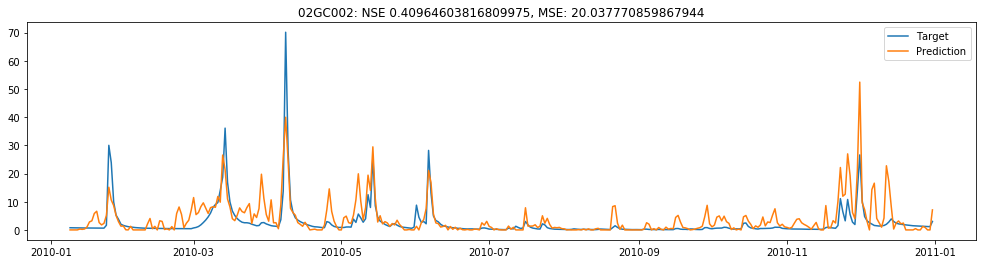

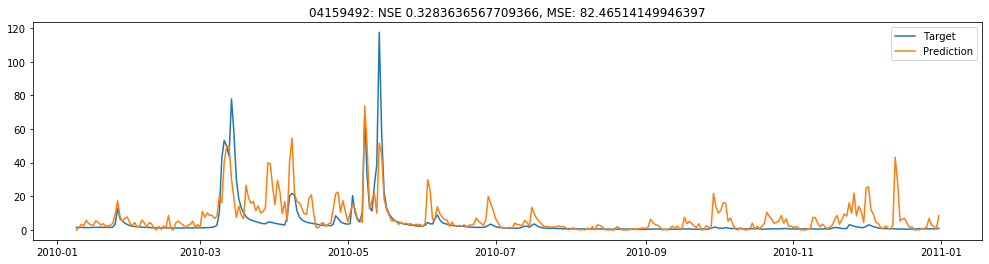

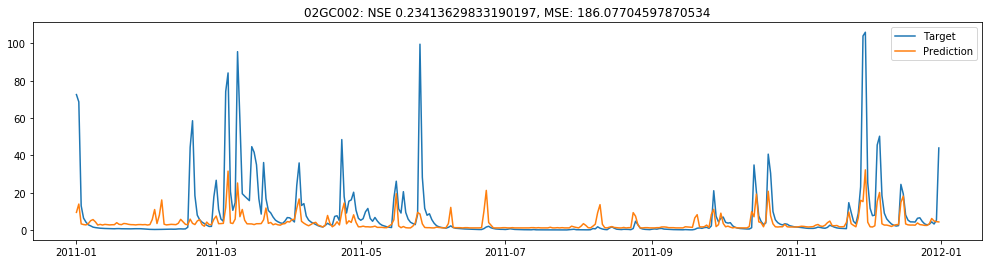

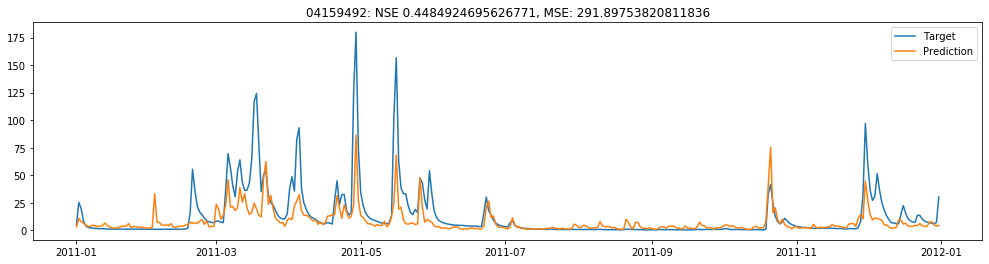

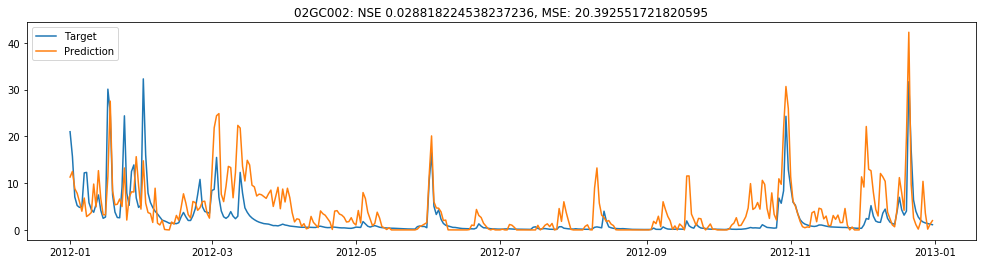

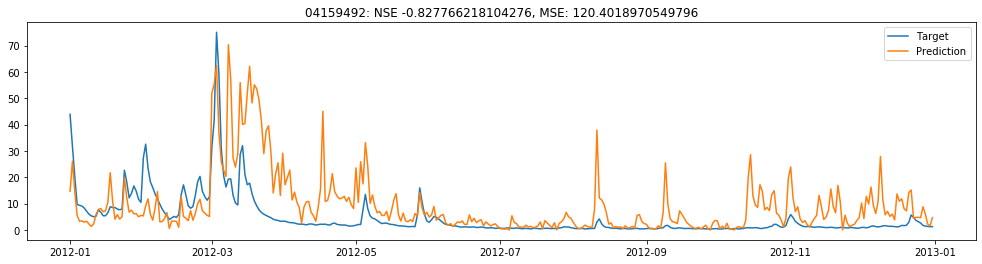

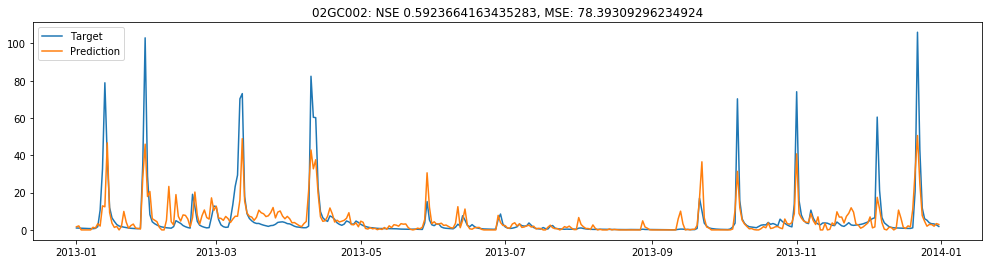

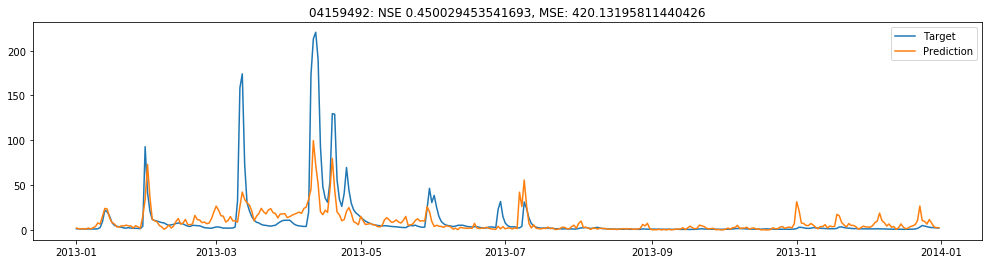

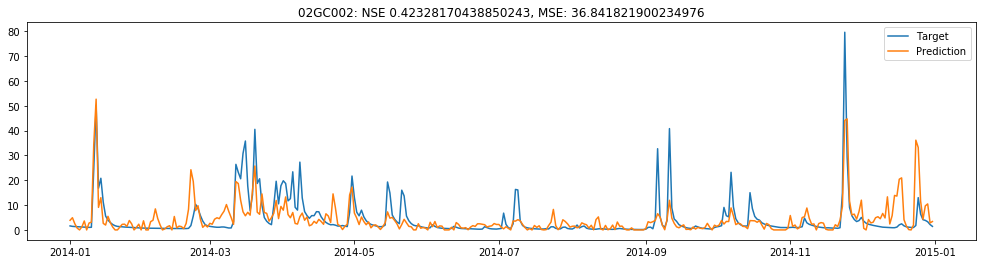

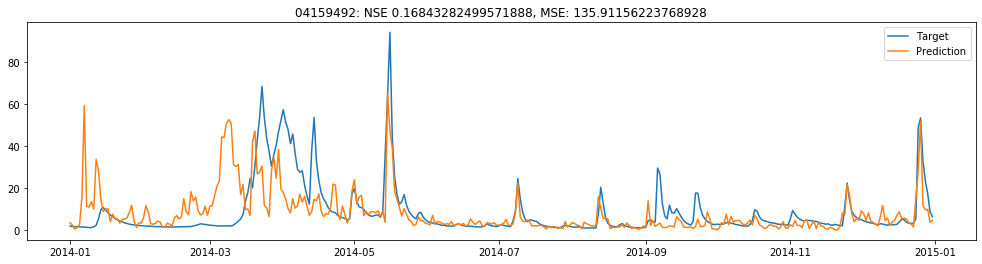

In [3]:
# Create test and train splits for each station (by time), then create predictions for each subbasin
history = 7
data_start = datetime.strptime('2010-01-01', '%Y-%m-%d') + timedelta(days=history + 1)
test_starts = [data_start, '2011-01-01', '2012-01-01', '2013-01-01', '2014-01-01']
test_ends = ['2010-12-31', '2011-12-31', '2012-12-31', '2013-12-31', '2014-12-31']

validation_fraction = 0.1

plot_list = ['04159492', '02GC002']
median_nse_mse_list = []
for cv_iter in range(len(test_starts)):
    test_start, test_end = test_starts[cv_iter], test_ends[cv_iter]
    print('Test: {} - {}'.format(test_start, test_end))
    
    predictions = {}
    actuals = {}
    models = {}
    nse_list, mse_list = [], []
    for station in station_data_dict.keys():
        print(station)
        station_data = station_data_dict[station]

        station_train = station_data[(station_data.index < test_start) | (station_data.index > test_end)].copy()
        num_validation_samples = int(validation_fraction * station_train.shape[0])
        shuffle_indices = np.arange(station_train.shape[0])
        np.random.shuffle(shuffle_indices)
        station_train = station_train.iloc[shuffle_indices]
        station_val, station_train = station_train.iloc[:num_validation_samples].copy(), station_train.iloc[num_validation_samples:].copy()

        station_test = station_data.loc[test_start:test_end]
        print('Shapes: train {}, val {}, test {}'.format(station_train.shape, station_val.shape, station_test.shape))

        station_val = [(station_train.drop(['station', 'runoff'], axis=1), station_train['runoff']), 
                       (station_val.drop(['station', 'runoff'], axis=1), station_val['runoff'])]

        m = pickle.load(open('../pickle/models/XGBoost_VIC_aggregateForcings_{}_20190705-084937.pkl'.format(station), 'rb'))  # Load model with parameters found in RandomSearchCV
        m = m.best_estimator_
        print(m)
        
        m.fit(station_train.drop(['station', 'runoff'], axis=1), station_train['runoff'], eval_set=station_val, eval_metric='rmse', early_stopping_rounds=100)
        
        station_test = station_test[~pd.isna(station_test['runoff'])]
        if len(station_test) == 0:
            print('Skipping', station)
            continue

        predict = pd.DataFrame(index=station_test.index)
        predict = predict.join(station_test.drop(['station', 'runoff'], axis=1))
        predict['runoff'] = np.nan
        predict['runoff'] = m.predict(predict.drop('runoff', axis=1))

        predictions['cv{}_{}'.format(cv_iter, station)] = predict[['runoff']]
        actuals['cv{}_{}'.format(cv_iter, station)] = station_test['runoff']
        models['cv{}_{}'.format(cv_iter, station)] = m
        
        nse, mse = evaluate.evaluate_daily(station, predict[['runoff']], station_test['runoff'], plot=station in plot_list)
        nse_list.append(nse)
        mse_list.append(mse)
    
    median_nse_mse_list.append((np.median(nse_list), np.median(mse_list)))
    print('Median NSE: {}\tMSE: {}'.format(*median_nse_mse_list[-1]))

In [9]:
median_nse_mse_list

[(0.3004746316117797, 59.75788349466316),
 (0.42544748706305, 164.79172990731072),
 (0.16945763708825506, 49.10649888493268),
 (0.5296995605192605, 93.1551055696101),
 (0.37082107274767395, 78.11343882101588)]

In [5]:
print('Median NSE: {}\t, MSE: {}'.format(np.median(list(zip(*median_nse_mse_list))[0]), np.median(list(zip(*median_nse_mse_list))[1])))

Median NSE: 0.37082107274767395	, MSE: 78.11343882101588


In [6]:
load_data.pickle_results('XGBoost_VIC_aggregateForcings_CV', (predictions, actuals), time_stamp)

'XGBoost_VIC_aggregateForcings_CV_20190706-075633.pkl'

In [7]:
for station, model in models.items():
    load_data.pickle_model('XGBoost_VIC_aggregateForcings_CV', model, station, time_stamp, model_type='xgb')

Saved model as ../pickle/models/XGBoost_VIC_aggregateForcings_CV_cv4_02GA010_20190706-075633.pkl
Saved model as ../pickle/models/XGBoost_VIC_aggregateForcings_CV_cv4_02GA018_20190706-075633.pkl
Saved model as ../pickle/models/XGBoost_VIC_aggregateForcings_CV_cv4_02GA038_20190706-075633.pkl
Saved model as ../pickle/models/XGBoost_VIC_aggregateForcings_CV_cv4_02GA047_20190706-075633.pkl
Saved model as ../pickle/models/XGBoost_VIC_aggregateForcings_CV_cv4_02GB001_20190706-075633.pkl
Saved model as ../pickle/models/XGBoost_VIC_aggregateForcings_CV_cv4_02GB007_20190706-075633.pkl
Saved model as ../pickle/models/XGBoost_VIC_aggregateForcings_CV_cv4_02GC002_20190706-075633.pkl
Saved model as ../pickle/models/XGBoost_VIC_aggregateForcings_CV_cv4_02GC007_20190706-075633.pkl
Saved model as ../pickle/models/XGBoost_VIC_aggregateForcings_CV_cv4_02GC010_20190706-075633.pkl
Saved model as ../pickle/models/XGBoost_VIC_aggregateForcings_CV_cv4_02GC018_20190706-075633.pkl
Saved model as ../pickle/model